In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm, multivariate_normal
import pandas as pd
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import Axes3D
import pandas as pd

# Code functions

In [ ]:
def mergedist(lamb, frequency, n):
  L = frequency*lamb
  datarange = np.arange(-0.5*L,0.5*L,0.001)
  d = norm.pdf(datarange, lamb/n, (lamb/np.pi)**2)/n
  df = pd.DataFrame(d, columns = np.arange(0,1))

  for i in range(0,n):
    d2 = norm.pdf(datarange, lamb*(2*i-n+1)/4, lamb/20)/n 
    # d2 = norm.pdf(datarange, (2*i-n+1)*lamb/n, lamb/(frequency*(n+1)))/n 
    df[i] = d2.tolist()

  return df, datarange

In [ ]:
def electrodist(f,r1):
  distdata = 2*f*np.sum(mergedist(r1, f, 2*f)[0],axis=1) # increased the probability value while reduced the range in order to get total probability for all orbitals
  xdata = mergedist(r1, f, 2*f)[1]
  return distdata, xdata

# Wave function

1999.9999999999977

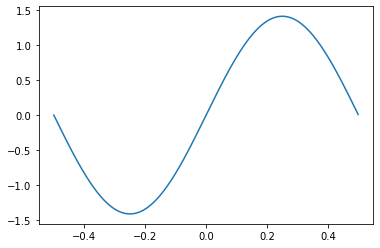

In [ ]:
# params
k = 2*np.pi
a = 1
lam = 1
L = a*lam

x = np.arange(-0.5*L,0.5*L,0.001)
phi = np.sqrt(2/L)*np.sin(k*x)
plt.plot(x,phi)
wf = 2/L*abs(phi)**2
wf_prob = sum(wf)
wf_prob

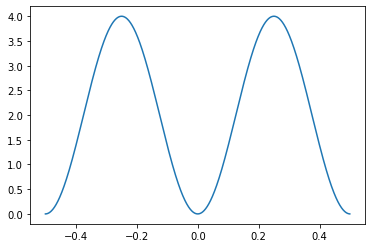

In [ ]:
plt.plot(x,wf)

# Multiple distributions

## KL divergence

In [ ]:
def kl_divergence(p, q):
    return np.sum(np.where(p != 0, p * np.log(p / q), 0))

11997.193039824

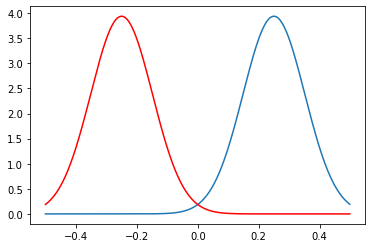

In [ ]:
# range, mean, sd
p = norm.pdf(x, lam/4, (lam/np.pi)**2)
q = norm.pdf(x, -lam/4, (lam/np.pi)**2)
plt.plot(x,p)
plt.plot(x, q, c='red')
Dkl = kl_divergence(p, q)
Dkl

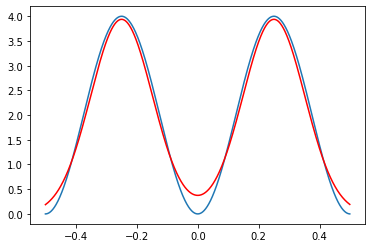

In [ ]:
plt.plot(x,wf)
plt.plot(x,(p+q), c='r')

## Multiple distributions / wave function

999.9999999999999

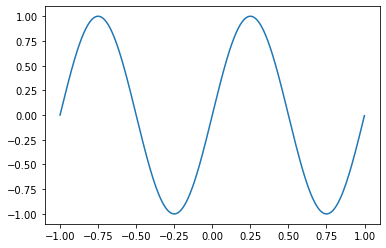

In [ ]:
# params
k = 2*np.pi
f = 2
lam = 1
L = f*lam

x = np.arange(-0.5*L,0.5*L,0.001)
phi = np.sqrt(2/L)*np.sin(k*x)
plt.plot(x,phi)
wf = 2/L*abs(phi)**2
wf_prob = sum(wf)
wf_prob

170198825174499.9

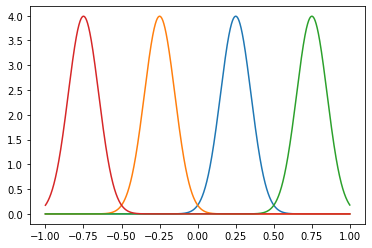

In [ ]:
p = norm.pdf(x, lam/4, lam/(f*(4+1)))
q = norm.pdf(x, -lam/4, lam/(f*(4+1)))
r = norm.pdf(x, 3*lam/4, lam/(f*(4+1)))
s = norm.pdf(x, -3*lam/4, lam/(f*(4+1))) #(lam/np.pi)**2)
plt.plot(x,p)
plt.plot(x, q)
plt.plot(x, r)
plt.plot(x, s)
Dkl = kl_divergence(p, q)
Dkl = kl_divergence(Dkl, r)
Dkl = kl_divergence(Dkl, s)
Dkl

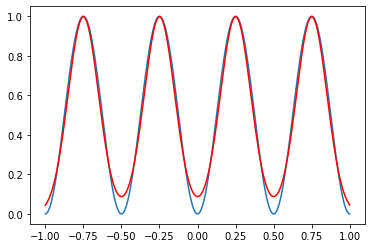

In [ ]:
plt.plot(x,wf)
plt.plot(x,(p+q+r+s)/4, c='r')

## Multi Dist

In [ ]:
datarange = x
sd = lam
n = 4

d = norm.pdf(datarange, lam/n, (lam/np.pi)**2)/n
df = pd.DataFrame(d, columns = np.arange(0,1))

for i in range(0,n):
  d2 = norm.pdf(datarange, (2*i-3)*lam/n, (lam/np.pi)**2)/n
  df[i] = d2.tolist()

df

,0,1,2,3
0,4.689674e-02,1.244758e-12,8.769394e-34,1.639821e-65
1,4.805046e-02,1.339035e-12,9.904412e-34,1.944499e-65
2,4.922776e-02,1.440312e-12,1.118525e-33,2.305562e-65
3,5.042901e-02,1.549099e-12,1.263049e-33,2.733401e-65
4,5.165453e-02,1.665939e-12,1.426108e-33,3.240319e-65
...,...,...,...,...
1995,3.840871e-65,1.610061e-33,1.791418e-12,5.290468e-02
1996,3.240319e-65,1.426108e-33,1.665939e-12,5.165453e-02
1997,2.733401e-65,1.263049e-33,1.549099e-12,5.042901e-02
1998,2.305562e-65,1.118525e-33,1.440312e-12,4.922776e-02


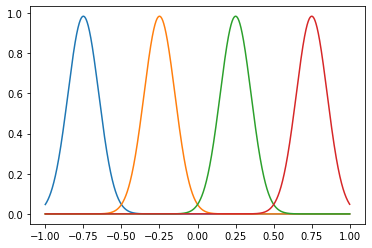

In [ ]:
plt.plot(x,df)

## Merged distribution function

In [ ]:
def mergedist(datarange, mu, n):
  d = norm.pdf(datarange, mu/n, (mu/np.pi)**2)/n
  df = pd.DataFrame(d, columns = np.arange(0,1))

  for i in range(0,n):
    d2 = norm.pdf(datarange, (2*i-n+1)*mu/n, mu/(f*(n+1)))/n  #((lam/(np.pi*L))**2)*4  #(mu/np.pi)**2)/n lam/(f*(4+1)))
    df[i] = d2.tolist()

  return df

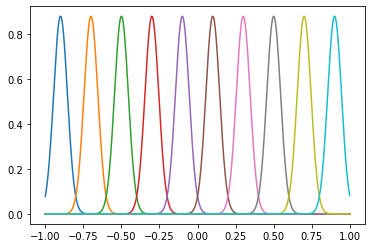

In [ ]:
nnn = mergedist(x, lam, 10)
plt.plot(x,nnn)

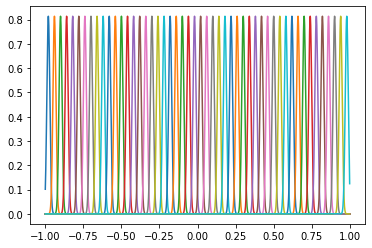

In [ ]:
nnn = mergedist(x, lam, 50)
plt.plot(x,nnn)

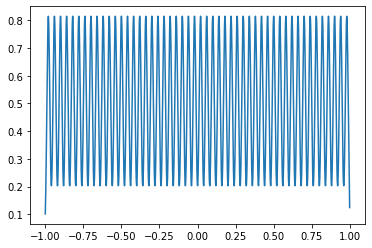

In [ ]:
nnn['sum'] = nnn. sum(axis=1)
plt.plot(x,nnn['sum']) # convergence of multiple normal distributions to a singular uniform distribution

# 3D

## 3D version has error

In [ ]:
def mergedist3D(datarange, mu, n):
  d = norm.pdf(datarange, mu/n, (mu/np.pi)**2)/n
  df = pd.DataFrame(d, columns = np.arange(0,1))

  df3D = pd.DataFrame(d, columns = np.arange(0,1))

  for i in range(0,n):
    d2 = norm.pdf(datarange, (2*i-n+1)*mu/n, (mu/np.pi)**2)/n
    df[i] = d2.tolist()


    # Parameters to set
    mu_x = (2*i-n+1)*mu/n
    variance_x = ((mu/np.pi)**2)/n

    #Create grid and multivariate normal
    x = np.arange(-0.5*L,0.5*L,0.001)
    X, Y = np.meshgrid(x,x)
    pos = np.empty(X.shape + (2,))
    pos[:, :, 0] = X; pos[:, :, 1] = Y
    rv = multivariate_normal([mu_x, mu_x], [[variance_x, 0], [0, variance_x]])
    d3D = rv.pdf(pos)
    df3D[i] = d3D.tolist()

  return df, df3D

In [ ]:
aaa = mergedist3D(x, lam, 4)[1]
aaa['sum'] = aaa.sum(axis=1)
aaa

,0,1,2,3,sum
0,"[0.5328453570062719, 0.5381197453046833, 0.543...","[1.4255147846985583e-09, 1.4683246763285552e-0...","[1.0202645714597204e-26, 1.071854429705492e-26...","[1.953549528186371e-52, 2.093244972546076e-52,...","[0.5328453570062719, 0.5381197453046833, 0.543..."
1,"[0.5381197453046833, 0.543446342319107, 0.5488...","[1.4683246763285552e-09, 1.5124201995360366e-0...","[1.071854429705492e-26, 1.1260529382447956e-26...","[2.093244972546076e-52, 2.2429298320157072e-52...","[0.5381197453046833, 0.543446342319107, 0.5488..."
2,"[0.5434248883409468, 0.5488039984982254, 0.554...","[1.5123604927583879e-09, 1.5577784635121364e-0...","[1.1260084843341528e-26, 1.1829453022099463e-2...","[2.242841286442971e-52, 2.403223557594712e-52,...","[0.5434248883409468, 0.5488039984982254, 0.554..."
3,"[0.5487606683819806, 0.554192594943571, 0.5596...","[1.5576554711103134e-09, 1.604433703529141e-09...","[1.1828519042799245e-26, 1.2426630197244467e-2...","[2.4030338141592384e-52, 2.5748712166089324e-5...","[0.5487606683819806, 0.554192594943571, 0.5596..."
4,"[0.554126962890133, 0.5596120079045487, 0.5651...","[1.6042436932700277e-09, 1.6524210249919981e-0...","[1.2425158533305575e-26, 1.3053438868961506e-2...","[2.5745662791434916e-52, 2.7586697150734506e-5...","[0.554126962890133, 0.5596120079045487, 0.5651..."
...,...,...,...,...,...
1995,"[1.4405207083757488e-26, 1.454779752708168e-26...","[4.8784944868767776e-18, 5.025001434782527e-18...","[4.420004090177205e-18, 4.643502377618238e-18,...","[1.0713467685634831e-26, 1.1479571952449875e-2...","[1.4405207083757488e-26, 1.454779752708168e-26..."
1996,"[1.3445979861709617e-26, 1.357907536101494e-26...","[4.644419058717934e-18, 4.7838964452187514e-18...","[4.291813887361683e-18, 4.50883021455752e-18, ...","[1.0610134833561464e-26, 1.1368849920589115e-2...","[1.3445979861709617e-26, 1.357907536101494e-26..."
1997,"[1.2550131077978145e-26, 1.2674358986940549e-2...","[4.421400268779472e-18, 4.554180137772088e-18,...","[4.1671769760923216e-18, 4.377891015857577e-18...","[1.0507383817817429e-26, 1.1258751331315118e-2...","[1.2550131077978145e-26, 1.2674358986940549e-2..."
1998,"[1.1713506470906184e-26, 1.1829453022098118e-2...","[4.208924377827137e-18, 4.335323345012703e-18,...","[4.045999864451424e-18, 4.2505865621653824e-18...","[1.0405217077216488e-26, 1.1149278797837617e-2...","[1.1713506470906184e-26, 1.1829453022098118e-2..."


In [ ]:
aa = aaa['sum']
aa

0       [0.5328453570062719, 0.5381197453046833, 0.543...
1       [0.5381197453046833, 0.543446342319107, 0.5488...
2       [0.5434248883409468, 0.5488039984982254, 0.554...
3       [0.5487606683819806, 0.554192594943571, 0.5596...
4       [0.554126962890133, 0.5596120079045487, 0.5651...
                              ...                        
1995    [1.4405207083757488e-26, 1.454779752708168e-26...
1996    [1.3445979861709617e-26, 1.357907536101494e-26...
1997    [1.2550131077978145e-26, 1.2674358986940549e-2...
1998    [1.1713506470906184e-26, 1.1829453022098118e-2...
1999    [1.0932221855963706e-26, 1.1040434834221958e-2...
Name: sum, Length: 2000, dtype: object

ValueError: ignored

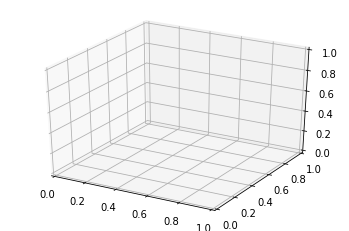

In [ ]:
#Make a 3D plot
x = np.arange(-0.5*L,0.5*L,0.001)
X, Y = np.meshgrid(x,x)
fig = plt.figure()
ax = fig.gca(projection='3d')
ax.plot_surface(X, Y, df,cmap='viridis',linewidth=0)
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_zlabel('Z axis')
plt.show()

## 3D plot simple

In [ ]:
#Parameters to set
mu_x = 0.5
variance_x = ((lam/np.pi)**2)/n

#Create grid and multivariate normal
x = np.arange(-0.5*L,0.5*L,0.001)
X, Y = np.meshgrid(x,x)
pos = np.empty(X.shape + (2,))
pos[:, :, 0] = X; pos[:, :, 1] = Y
rv = multivariate_normal([mu_x, mu_x], [[variance_x, 0], [0, variance_x]])


#Parameters to set
mu_x2 = -0.5
variance_x2 = ((lam/np.pi)**2)/n

#Create grid and multivariate normal
x2 = np.linspace(-1,1,1000)
y2 = np.linspace(-1,1,1000)
X2, Y2 = np.meshgrid(x2,y2)
pos2 = np.empty(X2.shape + (2,))
pos2[:, :, 0] = X2; pos2[:, :, 1] = Y2
rv2 = multivariate_normal([mu_x2, mu_x2], [[variance_x2, 0], [0, variance_x2]])

In [ ]:
rvpdf = rv.pdf(pos)+rv2.pdf(pos)
rvpdf

In [ ]:
#Make a 3D plot
fig = plt.figure()
ax = fig.gca(projection='3d')
ax.plot_surface(X, Y, rvpdf,cmap='viridis',linewidth=0)
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_zlabel('Z axis')
plt.show()

# Electron example

1369.8630136986283

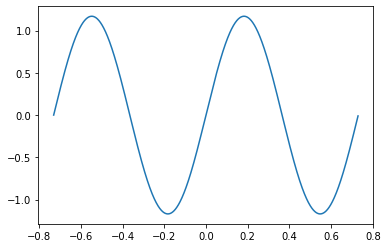

In [ ]:
# params
f = 2 # also number of electrons
lam = 0.73 # also atomic radius
L = f*lam

x = np.arange(-0.5*L,0.5*L,0.001)

phi = np.sqrt(2/L)*np.sin(2*np.pi*f*x/L)
plt.plot(x,phi)
wf = 2/L*abs(phi)**2
wf_prob = sum(wf)
wf_prob

In [ ]:
def mergedist(lamb, frequency, n):
  L = frequency*lamb
  datarange = np.arange(-0.5*L,0.5*L,0.001)
  d = norm.pdf(datarange, lamb/n, (lamb/np.pi)**2)/n
  df = pd.DataFrame(d, columns = np.arange(0,1))

  for i in range(0,n):
    d2 = norm.pdf(datarange, lamb*(2*i-n+1)/4, lamb/20)/n 
    # d2 = norm.pdf(datarange, (2*i-n+1)*lamb/n, lamb/(frequency*(n+1)))/n 
    df[i] = d2.tolist()

  return df, datarange

In [ ]:
nnn,xdata = mergedist(lam, f, 2*f)
nnn['sum'] = nnn. sum(axis=1)
#plt.plot(x,nnn['sum'])

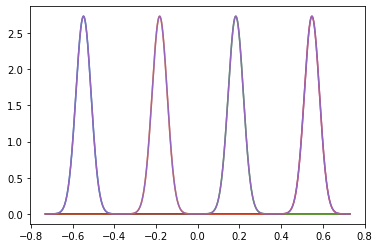

In [ ]:
plt.plot(x,nnn)

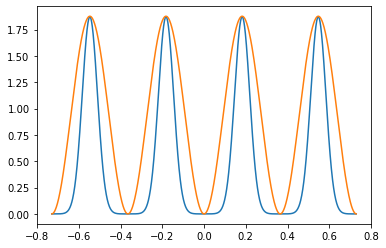

In [ ]:
plt.plot(x,nnn['sum']/L)

plt.plot(x,wf)

# Polar

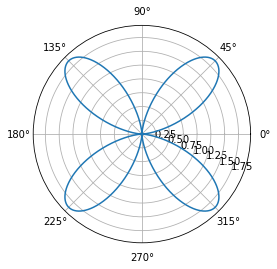

In [ ]:
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(4*np.pi*x/(2*L), wf)

ax.set_rlabel_position(-22.5)  # Move radial labels away from plotted line
ax.grid(True)
plt.show()

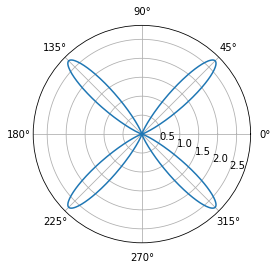

In [ ]:
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(4*np.pi*x/(2*L), nnn['sum'])

ax.set_rlabel_position(-22.5)  # Move radial labels away from plotted line
ax.grid(True)
plt.show()

## Polar to Cartesian plot

In [ ]:
def cart2pol(x, y):
    rho = np.sqrt(x**2 + y**2)
    phi = np.arctan2(y, x)
    return(rho, phi)

def pol2cart(rho, phi):
    x = rho * np.cos(phi)
    y = rho * np.sin(phi)
    return(x, y)

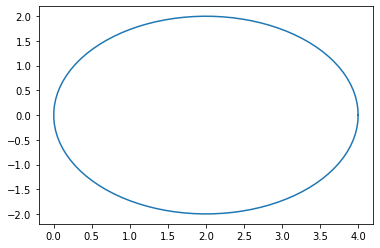

In [ ]:
theta = np.linspace(0,np.pi,100)
r = 4*np.cos(theta)
xr ,yr = pol2cart(r, theta)
plt.plot(xr, yr)

In [ ]:
# Bell curve formula
def bellcurve(x,mu,sig):
  return np.exp((-(x-mu)**2)/(2*sig**2))/np.sqrt(2*np.pi*sig**2)

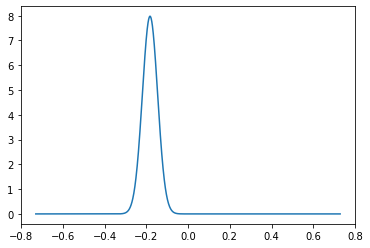

In [ ]:
bell = 2*L*bellcurve(x,lam*(2*1-n+1)/4,lam/20)/n
plt.plot(x,bell)

# Atoms

In [ ]:
def electrodist(f,r1):
  distdata = 2*f*np.sum(mergedist(r1, f, 2*f)[0],axis=1) # increased the probability value while reduced the range in order to get total probability for all orbitals
  xdata = mergedist(r1, f, 2*f)[1]
  return distdata, xdata

## H2O

(-1.0, 1.0)

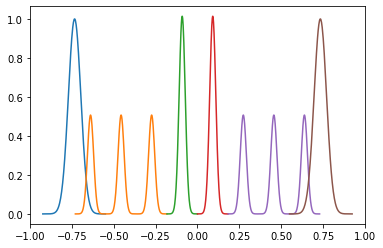

In [ ]:
# Water (H2O)
h_atomic_radius = 0.37 # angstrom
o_atomic_radius = 0.73 # angstrom

# Hydrogen
f=1
dist1 = 2*f*np.sum(mergedist(h_atomic_radius, f, 2*f)[0],axis=1) # increased the probability value while reduced the range in order to get total probability for all orbitals
x1 = mergedist(h_atomic_radius, f, 2*f)[1]
x1 = (2*x1*h_atomic_radius/max(x1) - o_atomic_radius - 3*h_atomic_radius)/2

# Oxygen shell 1

f=2
dist2 = 2*f*np.sum(mergedist(o_atomic_radius, f, 2*f)[0],axis=1)
x2 = mergedist(o_atomic_radius, f, 2*f)[1]
x2 = (x2 - 0.5*o_atomic_radius)/2

# Oxygen shell 2
f=6
dist3 = 2*f*np.sum(mergedist(o_atomic_radius, f, 2*f)[0],axis=1)
x3 = mergedist(o_atomic_radius, f, 2*f)[1]
x3 = (x3 - o_atomic_radius)/2

# plots
plt.plot(x1[x1>=-2.5*h_atomic_radius] , dist1[x1>=-2.5*h_atomic_radius]/max(dist1))
plt.plot(-x3[x3>=o_atomic_radius/4], dist3[x3>=o_atomic_radius/4]/max(dist1))
plt.plot(-x2[x2>=0], 2*dist2[x2>=0]/max(dist1))
plt.plot(x2[x2>=0], 2*dist2[x2>=0]/max(dist1))
plt.plot(x3[x3>=o_atomic_radius/4], dist3[x3>=o_atomic_radius/4]/max(dist1))
plt.plot(-x1[x1>=-2.5*h_atomic_radius] , dist1[x1>=-2.5*h_atomic_radius]/max(dist1))

plt.xlim(-1,1)

(-1.0, 1.0)

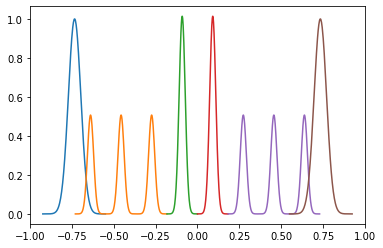

In [ ]:
# Water (H2O)
h_atomic_radius = 0.37 # angstrom
o_atomic_radius = 0.73 # angstrom

# Hydrogen
dist1, x1 = electrodist(1,h_atomic_radius)
x1 = (2*x1*h_atomic_radius/max(x1) - o_atomic_radius - 3*h_atomic_radius)/2

# Oxygen shell 1
dist2, x2 = electrodist(2,o_atomic_radius)
x2 = (x2 - 0.5*o_atomic_radius)/2

# Oxygen shell 2
dist3, x3 = electrodist(6,o_atomic_radius)
x3 = (x3 - o_atomic_radius)/2

# plots
plt.plot(x1[x1>=-2.5*h_atomic_radius] , dist1[x1>=-2.5*h_atomic_radius]/max(dist1))
plt.plot(-x3[x3>=o_atomic_radius/4], dist3[x3>=o_atomic_radius/4]/max(dist1))
plt.plot(-x2[x2>=0], 2*dist2[x2>=0]/max(dist1))
plt.plot(x2[x2>=0], 2*dist2[x2>=0]/max(dist1))
plt.plot(x3[x3>=o_atomic_radius/4], dist3[x3>=o_atomic_radius/4]/max(dist1))
plt.plot(-x1[x1>=-2.5*h_atomic_radius] , dist1[x1>=-2.5*h_atomic_radius]/max(dist1))

plt.xlim(-1,1)

## Generalised

In [ ]:
def electrodist(f,r1):
  distdata = 2*f*np.sum(mergedist(r1, f, 2*f)[0],axis=1) # increased the probability value while reduced the range in order to get total probability for all orbitals
  xdata = mergedist(r1, f, 2*f)[1]
  return distdata, xdata

## H2O

In [ ]:
# Atom radii
atom1 = 0.37 # angstrom
atom2 = 0.73 # angstrom

(-1.5, 1.5)

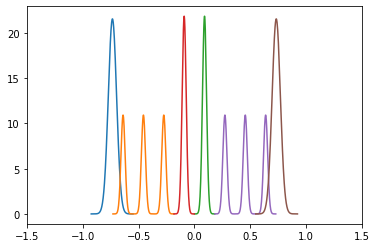

In [ ]:
## Atom 1

# Shell 1
dist1_1, x1_1 = electrodist(1,atom1) #1:2
x1_1 = (2*x1_1*atom1/max(x1_1) - atom2 - 3*atom1)/2

# Shell 2
dist2_1, x2_1 = electrodist(3,atom2) #3
x2_1 = (2*x2_1*atom1/max(x2_1) - atom2 - 3*atom1)/2


## Atom 2 (central)

# Shell 1
dist1_2, x1_2 = electrodist(2,atom2) #2
x1_2 = (x1_2 - atom2)/2

# Shell 2
dist3_2, x3_2 = electrodist(6,atom2) #6
x3_2 = (x3_2 - atom2)/2

# plots

# Atom 1
#plt.plot(x2_1[x2_1>=-2.5*atom1] , dist2_1[x2_1>=-5/2*atom1])
plt.plot(x1_1[x1_1>=-2.5*atom1] , dist1_1[x1_1>=-5/2*atom1])

# Atom 2
plt.plot(-x3_2[x3_2>=atom2/4], dist3_2[x3_2>=atom2/4])
plt.plot(-x1_2[x1_2>=-atom2/4], 2*dist1_2[x1_2>=-atom2/4])
plt.plot(x1_2[x1_2>=-atom2/4], 2*dist1_2[x1_2>=-atom2/4])
plt.plot(x3_2[x3_2>=atom2/4], dist3_2[x3_2>=atom2/4])

# Atom 1
plt.plot(-x1_1[x1_1>=-2.5*atom1] , dist1_1[x1_1>=-5/2*atom1])
#plt.plot(-x2_1[x2_1>=-2.5*atom1] , dist2_1[x2_1>=-5/2*atom1])

plt.xlim(-1.5,1.5)

## CO2

In [ ]:
# Atom radii
atom1 = 0.73 # angstrom
atom2 = 1.5 # angstrom

(-3.0, 3.0)

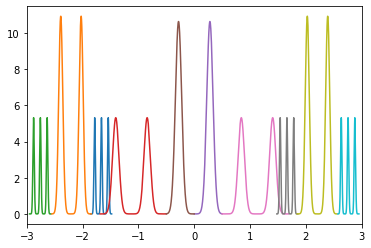

In [ ]:
## Atom 1
s1_1 = 2
s2_1 = 6

# Shell 1
dist1_1, x1_1 = electrodist(s1_1,atom1) #1:2
x1_1 = (2*x1_1*atom1/max(x1_1) - atom2 - 3*atom1)/2

# Shell 2
dist2_1, x2_1 = electrodist(s2_1,atom2) #3
x2_1 = (2*x2_1*atom1/max(x2_1) - atom2 - 3*atom1)/2


## Atom 2 (central)
s1_2 = 2
s2_2 = 4

# Shell 1
dist1_2, x1_2 = electrodist(s1_2,atom2) #2
x1_2 = atom2*(x1_2 - atom2)/2

# Shell 2
dist3_2, x3_2 = electrodist(s2_2,atom2) #6
x3_2 = atom2*(x3_2 - ((2*s2_2-4)/8)*atom2)/2 # 4:0.5 6:1 8:1.5

# plots

# Atom 1
plt.plot(x2_1[x2_1-2/s2_1>=-5/2*atom1]-0.5*atom1 , dist2_1[x2_1-2/s2_1>=-5/2*atom1])
plt.plot(x1_1[x1_1>=-5/2*atom1]-atom1 , dist1_1[x1_1>=-5/2*atom1])
plt.plot(x2_1[x2_1-2/s2_1>=-5/2*atom1]-2*atom1 , dist2_1[x2_1-2/s2_1>=-5/2*atom1])

# Atom 2
plt.plot(-x3_2[x3_2>=atom2/3], dist3_2[x3_2>=atom2/3])
plt.plot(-x1_2[x1_2>=-atom2/3], 2*dist1_2[x1_2>=-atom2/3])
plt.plot(x1_2[x1_2>=-atom2/3], 2*dist1_2[x1_2>=-atom2/3])
plt.plot(x3_2[x3_2>=atom2/3], dist3_2[x3_2>=atom2/3])

# Atom 1
plt.plot(-x2_1[x2_1-2/s2_1>=-5/2*atom1]+0.5*atom1 , dist2_1[x2_1-2/s2_1>=-5/2*atom1])
plt.plot(-x1_1[x1_1>=-5/2*atom1]+atom1 , dist1_1[x1_1>=-5/2*atom1])
plt.plot(-x2_1[x2_1-2/s2_1>=-5/2*atom1]+2*atom1 , dist2_1[x2_1-2/s2_1>=-5/2*atom1])

plt.xlim(-3,3)

## Adaptable

In [ ]:
# Atom radii
atom1 = 0.37 # angstrom
atom2 = 0.73 # angstrom

(-2.0, 2.0)

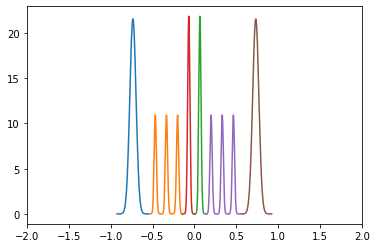

In [ ]:
## Atom 1
s1_1 = 1
s2_1 = 0

# Shell 1
dist1_1, x1_1 = electrodist(s1_1,atom1) #1:2
x1_1 = (2*x1_1*atom1/max(x1_1) - atom2 - 3*atom1)/2

# Shell 2
if s2_1 > 0:
  dist2_1, x2_1 = electrodist(s2_1,atom2) #3
  x2_1 = (2*x2_1*atom1/max(x2_1) - atom2 - 3*atom1)/2


## Atom 2 (central)
s1_2 = 2
s2_2 = 6

# Shell 1
dist1_2, x1_2 = electrodist(s1_2,atom2) #2
x1_2 = atom2*(x1_2 - atom2)/2

# Shell 2
dist3_2, x3_2 = electrodist(s2_2,atom2) #6
x3_2 = atom2*(x3_2 - ((2*s2_2-4)/8)*atom2)/2 # 4:0.5 6:1 8:1.5

# plots

# Atom 1
if s2_1 > 0:
  plt.plot(x2_1[x2_1-2/s2_1>=-5/2*atom1]-0.5*atom1 , dist2_1[x2_1-2/s2_1>=-5/2*atom1])
  plt.plot(x1_1[x1_1>=-5/2*atom1]-atom1 , dist1_1[x1_1>=-5/2*atom1])
  plt.plot(x2_1[x2_1-2/s2_1>=-5/2*atom1]-2*atom1 , dist2_1[x2_1-2/s2_1>=-5/2*atom1])
if s2_1 == 0:
  plt.plot(x1_1[x1_1>=-5/2*atom1] , dist1_1[x1_1>=-5/2*atom1])

# Atom 2
plt.plot(-x3_2[x3_2>=atom2/5], dist3_2[x3_2>=atom2/5])
plt.plot(-x1_2[x1_2>=-atom2/5], 2*dist1_2[x1_2>=-atom2/5])
plt.plot(x1_2[x1_2>=-atom2/5], 2*dist1_2[x1_2>=-atom2/5])
plt.plot(x3_2[x3_2>=atom2/5], dist3_2[x3_2>=atom2/5])

# Atom 1
if s2_1 > 0:
  plt.plot(-x2_1[x2_1-2/s2_1>=-5/2*atom1]+0.5*atom1 , dist2_1[x2_1-2/s2_1>=-5/2*atom1])
  plt.plot(-x1_1[x1_1>=-5/2*atom1]+atom1 , dist1_1[x1_1>=-5/2*atom1])
  plt.plot(-x2_1[x2_1-2/s2_1>=-5/2*atom1]+2*atom1 , dist2_1[x2_1-2/s2_1>=-5/2*atom1])
if s2_1 == 0:
  plt.plot(-x1_1[x1_1>=-5/2*atom1] , dist1_1[x1_1>=-5/2*atom1])

plt.xlim(-2,2)

# Atomic surface

In [ ]:
# Atom radii
atom1 = 0.37 # angstrom
atom2 = 0.73 # angstrom

In [ ]:
## Atom 1
s1_1 = 1
s2_1 = 0

# Shell 1
dist1_1, x1_1 = electrodist(s1_1,atom1) #1:2
x1_1 = (2*x1_1*atom1/max(x1_1) - atom2 - 3*atom1)/2

# Shell 2
if s2_1 > 0:
  dist2_1, x2_1 = electrodist(s2_1,atom2) #3
  x2_1 = (2*x2_1*atom1/max(x2_1) - atom2 - 3*atom1)/2


## Atom 2 (central)
s1_2 = 2
s2_2 = 6

# Shell 1
dist1_2, x1_2 = electrodist(s1_2,atom2) #2
x1_2 = atom2*(x1_2 - atom2)/2

# Shell 2
dist3_2, x3_2 = electrodist(s2_2,atom2) #6
x3_2 = atom2*(x3_2 - ((2*s2_2-4)/8)*atom2)/2 # 4:0.5 6:1 8:1.5

In [ ]:
def molecule(translate):
  # Atom 1
  if s2_1 > 0:
    plt.plot(x2_1[x2_1-2/s2_1>=-5/2*atom1]-0.5*atom1+translate , dist2_1[x2_1-2/s2_1>=-5/2*atom1])
    plt.plot(x1_1[x1_1>=-5/2*atom1]-atom1+translate , dist1_1[x1_1>=-5/2*atom1])
    plt.plot(x2_1[x2_1-2/s2_1>=-5/2*atom1]-2*atom1+translate , dist2_1[x2_1-2/s2_1>=-5/2*atom1])
  if s2_1 == 0:
    plt.plot(x1_1[x1_1>=-5/2*atom1]+translate , dist1_1[x1_1>=-5/2*atom1])

  # Atom 2
  plt.plot(-x3_2[x3_2>=atom2/5]+translate, dist3_2[x3_2>=atom2/5])
  plt.plot(-x1_2[x1_2>=-atom2/5]+translate, 2*dist1_2[x1_2>=-atom2/5])
  plt.plot(x1_2[x1_2>=-atom2/(s2_2-1)]+translate, 2*dist1_2[x1_2>=-atom2/(s2_2-1)])
  plt.plot(x3_2[x3_2>=atom2/(s2_2-1)]+translate, dist3_2[x3_2>=atom2/(s2_2-1)])

  # Atom 1
  if s2_1 > 0:
    plt.plot(-x2_1[x2_1-2/s2_1>=-5/2*atom1]+0.5*atom1+translate , dist2_1[x2_1-2/s2_1>=-5/2*atom1])
    plt.plot(-x1_1[x1_1>=-5/2*atom1]+atom1+translate , dist1_1[x1_1>=-5/2*atom1])
    plt.plot(-x2_1[x2_1-2/s2_1>=-5/2*atom1]+2*atom1+translate , dist2_1[x2_1-2/s2_1>=-5/2*atom1])
  if s2_1 == 0:
    plt.plot(-x1_1[x1_1>=-5/2*atom1]+translate , dist1_1[x1_1>=-5/2*atom1])


(-5.0, 5.0)

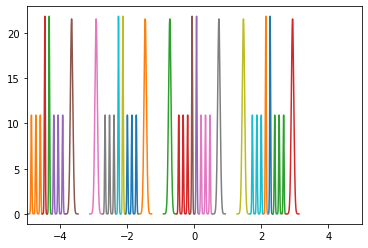

In [ ]:
# plots

## Molecules

tr = 2*(atom1 + atom2)
rng = 5

#tr = 40
#rng = 120
#rng = 10**4 # micrometre 
# metre of surface is 10**10

for i in range(-round(rng/tr),round(rng/tr)):
  molecule(i*tr)

plt.xlim(-rng,rng)

# Earth orbital electron analysis

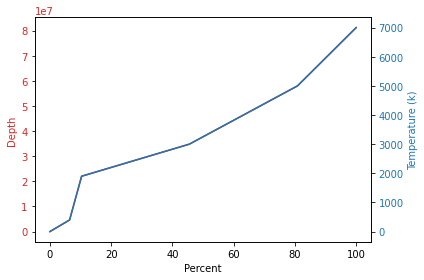

In [ ]:
# Geothermal gradient (Possible caused by free electrons)

# [percent,depth m, temp K]
Surface = [0,0,0]
Lithosphere = [410*10**3/6370*10,410*10**3,400] # Oxygen, iron, silicon
UpperMantle = [660*10**3/6370*10,660*10**3,1900] # Oxygen, rest
LowerMantle = [2900*10**3/6370*10,2900*10**3,3000] # Silicon and 100% Magnesium
OuterCore = [5150*10**3/6370*10,5150*10**3,5000] # 100% Liquid Iron
InnerCore = [6370*10**3/6370*10,6370*10**3,7000] # 100% Solid Iron

Ecore = [Surface, Lithosphere, UpperMantle, LowerMantle, OuterCore, InnerCore]
Edata = pd.DataFrame(Ecore)

x = Edata[0]/100
Depth = Edata[1]
Temp = Edata[2]
Kelvin2eV = Temp/(8.61732814974493*10**-5)

fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('Percent')
ax1.set_ylabel('Depth', color=color)
ax1.plot(x, Kelvin2eV, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('Temperature (k)', color=color)  # we already handled the x-label with ax1
ax2.plot(x, Temp, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

In [ ]:
n = 175 #*10**49 # number of electrons in Earth
atom1 = 0.37

perciron = 32.1*np.array([0.333,0,0,0.333,0.333]) #32.1
eiron = [2,8,14,2]
energyiron = (eiron[0]+2*eiron[1]+3*eiron[2]+4*eiron[3])/sum(eiron)
ioniseiron = [7.9024, 16.1877,30.652,54.8,75.0]

percoxy = 30.1*np.array([0.50,0.50,0,0,0])
eoxy = [2,6]
energyoxy = (eoxy[0]+2*eoxy[1])/sum(eoxy)
ioniseoxy = [13.6181,35.1211,54.9355,77.41353,113.8990]

percsili = 15.1*np.array([1,0,0,0,0])
esili = [2,8,4]
energysili = (esili[0]+2*esili[1])/sum(esili)
ionisesili = [8.1517,16.34584,33.49302,45.14181,166.767]

percmag = 13.9*np.array([0,0,1,0,0])
emag = [2,8,2]
energymag = (emag[0]+2*emag[1]+3*emag[2])/sum(emag)
ionisemag = [7.6462,15.03527,80.1437,109.2655,141.27]

# sulfur(average of rest)
percrest = (100-perciron-percoxy-percsili-percmag)*np.array([0.2,0.22,0.2,0.2,0.18])
erest = [2,8,6]
energyrest = (erest[0]+2*erest[1]+3*erest[2])/sum(erest)
ioniserest = [10.3600,23.33788,34.79,47.222,72.5945]

Kelvin2eV 




energy_100particles = perciron*energyiron+percoxy*energyoxy+percsili*energysili+percmag*energymag+percrest*energyrest

av_eV = energy_100particles/100
av_eV # per layer


array([1.00330731, 0.6838775 , 0.66545   , 0.68146446, 0.64127464])

In [ ]:
Kelvin2eV # suggests elements below and including Upper Mantle completely ionised as 4E6 eV is much larger than any ionisation energies combined

0    0.000000e+00
1    4.641810e+06
2    2.204860e+07
3    3.481358e+07
4    5.802263e+07
5    8.123168e+07
Name: 2, dtype: float64

In [ ]:
# 410*10**3 # proportion of area with orbital electrons

# VE = 1.0832*10**21  # Volume of Earth

# Vseg1 = (4/3)*np.pi*(5100*10**3)**3  # V = 4/3 pi r**3
# perc_inc = Vseg1/VE

# Vseg2 = (4/3)*np.pi*(2900*10**3)**3  # V = 4/3 pi r**3
# Vseg_outc = Vseg2 - Vseg1
# perc_outc = Vseg_outc/VE

# Vseg3 = (4/3)*np.pi*(660*10**3)**3  # V = 4/3 pi r**3
# Vseg_lowm = Vseg3 - (Vseg1+Vseg2)
# perc_lowm = Vseg_lowm/VE

# Vseg4 = (4/3)*np.pi*(410*10**3)**3  # V = 4/3 pi r**3
# Vseg_upm = Vseg4 - (Vseg1+Vseg2+Vseg3)
# perc_upm = Vseg_upm/VE

# Vseg5 = (4/3)*np.pi*(6378*10**3)**3  # V = 4/3 pi r**3
# Vseg_lith = Vseg5 - (Vseg1+Vseg2+Vseg3+Vseg4)
# perc_lith = Vseg_lith/VE

In [ ]:
perc_lith = 0.01
perc_mantle = 0.84
perc_core = 0.15

In [ ]:
Edist, Ex = electrodist(n,atom1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  # Remove the CWD from sys.path while we load stuff.


In [ ]:
EdistNorm = Edist/max(Edist)
#plt.polar(Ex,av_eV*EdistNorm) 

energyE = sum(av_eV[0]*EdistNorm)*(1.60217*10**-19) # orbital electron energy in Earth

me = (n*10**49)*9.1*10**-31 # mass of all electrons
me_lith = (n*10**49)*9.1*10**-31 # mass of all electrons 

f=(1.60217*10**-19)/(6.63*10**-34) # freq of electron wave f= E/h
T=1/f
m2_s = T*energyE/me_lith # a = (E x T)/mass (change to energy and mass of orbital electrons)

a = m2_s*n*10**49
a

11.868461851778171

In [ ]:
n = 175*10**49 # total number of electrons
numorbital = 1.2997*10**47
numfree = n - numorbital # 1.75E51

energyE = (n / numorbital)*(1.60217*10**-19) # ratio of total electron energy to orbital electron energy in Earth
moe = (9.1*10**-31) # mass of one orbital electron

f=(1.60217*10**-19)/(6.63*10**-34) # freq of electron wave f= E/h
T=1/f
m2_s_2 = energyE*T/moe # a = (E x T)/mass (change to energy and mass of orbital electrons) ratio of 

a = m2_s_2
a

9.809956143725474

## Testing electograv equations

In [ ]:
# Earth
Temp = 288  # kelvin
Pressure = 101325  # pascals
mass = 5.972*10**24
Volume = 1.0832*10**21

Epvt = Pressure/Temp


n = 0.49*mass/(1.672619*10**-27) # total number of electrons: 175*10**49
nEarth = n
numorbital = 1.2997*10**47
numfree = n - numorbital # 1.74987E51

energyE = (n / numorbital)*(1.60217*10**-19) # ratio of total electron energy to orbital electron energy in Earth
moe = (9.1*10**-31) # mass of one orbital electron

f=(1.60217*10**-19)/(6.63*10**-34) # freq of electron wave f=E/h
T=1/f
m2_s_2 = energyE*T/moe # a = (E x T)/mass (change to energy and mass of orbital electrons) ratio of 

a = m2_s_2
a

9.80726409618209

In [ ]:
# Mercury
Temp = 415  # kelvin
Pressure = 101325  # pascals
mass = 3.285*10**23
Volume = 6.08*10**19

Vpvt = Pressure/Temp

n = 0.49*mass/(1.672619*10**-27) # total number of electrons
nVenus = n

pvt_ratio = np.sqrt(1/((nEarth/nVenus)*(Vpvt/Epvt)))  # gas law (Gay-Lussac's law as volume remains the same)
print(pvt_ratio)

numorbital = 1.2997*10**47
numfree = n - numorbital # 1.74987E51

energyE = (n / numorbital)*(1.60217*10**-19) # ratio of total electron energy to orbital electron energy in Earth # (0.1458)*
moe = (9.1*10**-31) # mass of one orbital electron

f=(1.60217*10**-19)/(6.63*10**-34) # freq of electron wave f=E/h
T=1/f
m2_s_2 = energyE*T/moe # a = (E x T)/mass (change to energy and mass of orbital electrons) ratio of 

a = m2_s_2
a

0.2815370734808106


0.5394652135960843

In [ ]:
# Venus
Temp = 737  # kelvin
Pressure = 93*101325  # pascals
mass = 4.867*10**24
Volume = 9.2843*10**20

Vpvt = Pressure/Temp

n = 0.49*mass/(1.672619*10**-27) # total number of electrons
nVenus = n

pvt_ratio = np.sqrt(1/((nEarth/nVenus)*(Vpvt/Epvt)))  # gas law (Gay-Lussac's law as volume remains the same)
print(pvt_ratio)

numorbital = 1.2997*10**47
numfree = n - numorbital # 1.74987E51

energyE = (n / numorbital)*(1.60217*10**-19) # ratio of total electron energy to orbital electron energy in Earth # (1.10977)*
moe = (9.1*10**-31) # mass of one orbital electron

f=(1.60217*10**-19)/(6.63*10**-34) # freq of electron wave f=E/h
T=1/f
m2_s_2 = energyE*T/moe # a = (E x T)/mass (change to energy and mass of orbital electrons) ratio of 

a = m2_s_2
a

0.1497499890718193


7.992624641011089

In [ ]:
# Mars
Temp = 210  # kelvin
Pressure = 610  # pascals
mass = 6.39*10**23
Volume = 1.6318*10**20

Mpvt = Pressure/Temp

n = 0.49*mass/(1.672619*10**-27) # total number of electrons
nMars = n

pvt_ratio = np.sqrt(1/((nEarth/nMars)*(Mpvt/Epvt)))  # gas law (Gay-Lussac's law as volume remains the same)
print(pvt_ratio)

numorbital = 1.2997*10**47
numfree = n - numorbital # 1.74987E51

energyE = (n / numorbital)*(1.60217*10**-19) # ratio of total electron energy to orbital electron energy in Earth # (3.545937)*
moe = (9.1*10**-31) # mass of one orbital electron

f=(1.60217*10**-19)/(6.63*10**-34) # freq of electron wave f=E/h
T=1/f
m2_s_2 = energyE*T/moe # a = (E x T)/mass (change to energy and mass of orbital electrons) ratio of 

a = m2_s_2
a

3.599957069724976


1.0493706894608763

In [ ]:
# Jupiter
Temp = 165  # kelvin
Pressure = 400000  # pascals
mass = 1.898*10**27
Volume = 1.43128*10**24

Jpvt = Pressure/Temp

n = 0.49*(mass)/(1.672619*10**-27) # total number of electrons
nJup = n

pvt_ratio = np.sqrt(1/(((nEarth/nJup)*(Jpvt/Epvt))))  # gas law (Gay-Lussac's law as volume remains the same)
print(pvt_ratio)

numorbital = 1.2997*10**47
numfree = n - numorbital # 1.74987E51

energyE = (n / numorbital)*(1.60217*10**-19) # ratio of total electron energy to orbital electron energy in Earth # (0.0079534)*
moe = (9.1*10**-31) # mass of one orbital electron

f=(1.60217*10**-19)/(6.63*10**-34) # freq of electron wave f=E/h
T=1/f
m2_s_2 = energyE*T/moe # a = (E x T)/mass (change to energy and mass of orbital electrons) ratio of 

a = m2_s_2
a

6.7914458655194805


3116.910122999598

In [ ]:
# Saturn
Temp = 134  # kelvin
Pressure = 140000  # pascals
mass = 5.683*10**26
Volume = 8.2713*10**23

Jpvt = Pressure/Temp

n = 0.49*(mass)/(1.672619*10**-27) # total number of electrons
nJup = n

pvt_ratio = np.sqrt(1/(((nEarth/nJup)*(Jpvt/Epvt))))  # gas law (Gay-Lussac's law as volume remains the same)
print(pvt_ratio)

numorbital = 1.2997*10**47
numfree = n - numorbital # 1.74987E51

energyE = (n / numorbital)*(1.60217*10**-19) # ratio of total electron energy to orbital electron energy in Earth # (0.0111865)*
moe = (9.1*10**-31) # mass of one orbital electron

f=(1.60217*10**-19)/(6.63*10**-34) # freq of electron wave f=E/h
T=1/f
m2_s_2 = energyE*T/moe # a = (E x T)/mass (change to energy and mass of orbital electrons) ratio of 

a = m2_s_2
a

5.660820346025921


933.2666084829672

In [ ]:
# Uranus
Temp = 750  # kelvin
Pressure = 101325  # pascals
mass = 8.681*10**25
Volume = 6.833*10**22

Upvt = Pressure/Temp

n = 0.49*(mass)/(1.672619*10**-27) # total number of electrons
nUra = n

pvt_ratio = np.sqrt(1/(((nEarth/nUra)*(Upvt/Epvt))))  # gas law (Gay-Lussac's law as volume remains the same)
print(pvt_ratio)

numorbital = 1.2997*10**47
numfree = n - numorbital # 1.74987E51

energyE = (n / numorbital)*(1.60217*10**-19) # ratio of total electron energy to orbital electron energy in Earth # (0.0622)*
moe = (9.1*10**-31) # mass of one orbital electron

f=(1.60217*10**-19)/(6.63*10**-34) # freq of electron wave f=E/h
T=1/f
m2_s_2 = energyE*T/moe # a = (E x T)/mass (change to energy and mass of orbital electrons) ratio of 

a = m2_s_2
a

6.15260970791304


142.56004624741578

In [ ]:
# Sun
Temp = 5778  # kelvin
Pressure = 340000000000*101325  # pascals
mass = 1.989*10**30
Volume = 1.4*10**27

Upvt = Pressure/Temp

n = 0.49*(mass)/(1.672619*10**-27) # total number of electrons
nUra = n

pvt_ratio = np.sqrt(1/(((nEarth/nUra)*(Upvt/Epvt))))  # gas law (Gay-Lussac's law as volume remains the same)
print(pvt_ratio)

numorbital = 1.2997*10**47
numfree = n - numorbital # 1.74987E51

energyE = (n / numorbital)*(1.60217*10**-19) # ratio of total electron energy to orbital electron energy in Earth # (8.3885657E-5)*
moe = (9.1*10**-31) # mass of one orbital electron

f=(1.60217*10**-19)/(6.63*10**-34) # freq of electron wave f=E/h
T=1/f
m2_s_2 = energyE*T/moe # a = (E x T)/mass (change to energy and mass of orbital electrons) ratio of 

a = m2_s_2
a

0.004433130932652625


3266351.0193077982

## Observing the error

[-1.22384099e-138  1.25603825e-067  3.15988583e+001]


Text(0, 0.5, 'Error')

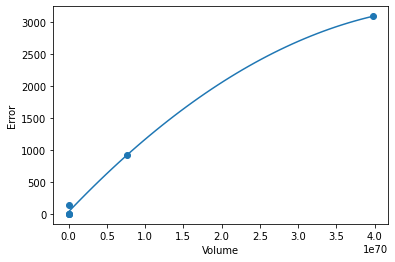

In [ ]:
orbital_free_ratio_error = np.array([0.1458,1.10977,3.545937,0.0079534,0.0111865,0.0622]) # Merc, Venus, Mars, Jupiter, Saturn, Uranus
error2 = np.array([-3.160535,-0.877375,-2.67163,3092.12,922.826,133.69]) # Merc, Venus, Mars, Jupiter, Saturn, Uranus

# Earth
ETemp = 288  # kelvin
EPressure = 101325  # pascals
EVolume = 1.0832*10**21


Volume = np.array([6.08*10**19,9.2843*10**20,1.6318*10**20,1.43128*10**24,8.2713*10**23,6.833*10**22])
Pressure = np.array([101325,93*101325,610,400000,140000,101325])  # pascals
Temp = np.array([415,737,210,165,134,750])  # kelvin

# Relative

RVolume = np.array([6.08*10**19,9.2843*10**20,1.6318*10**20,1.43128*10**24,8.2713*10**23,6.833*10**22])-EVolume
RPressure = np.array([101325,93*101325,610,400000,140000,101325])-EPressure  # pascals
RTemp = np.array([415,737,210,165,134,750])-ETemp  # kelvin

#plt.scatter(error2,RPressure)

#plt.scatter(error2,RTemp)

#plt.scatter(error2,RVolume)

x = (3*RVolume/(4*np.pi))**(3)*RPressure**(0)*RTemp**(0)
plt.scatter(x,error2)


# Calculate the polynomial
coefficients = np.polyfit(x,error2, 2)
poly = np.poly1d(coefficients)

# Calculate new x and y values
new_x = np.linspace(min(x), max(x))
y = coefficients[2]+coefficients[1]*new_x+coefficients[0]*new_x**2

plt.plot(new_x,y)
print(coefficients)

plt.xlabel('Volume')
plt.ylabel('Error')

1.4e+27
3266077.0
4.286483706421563e+20


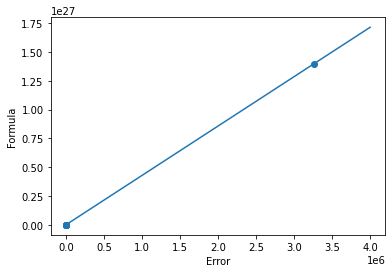

In [ ]:
# with Sun added

orbital_free_ratio_error = np.array([0.1458,1.10977,3.545937,0.0079534,0.0111865,0.0622,8.3885657E-5]) # Merc, Venus, Mars, Jupiter, Saturn, Uranus, Sun
error2 = np.array([-3.160535,-0.877375,-2.67163,3092.12,922.826,133.69,3266077]) # Merc, Venus, Mars, Jupiter, Saturn, Uranus, Sun

Volume = np.array([6.08*10**19,9.2843*10**20,1.6318*10**20,1.43128*10**24,8.2713*10**23,6.833*10**22,1.4*10**27]) # Merc, Venus, Mars, Jupiter, Saturn, Uranus, Sun
Pressure = np.array([101325,93*101325,610,400000,140000,101325,340000000000*101325])  # pascals
Temp = np.array([415,737,210,165,134,750,5778])  # kelvin

#plt.scatter(Pressure,orbital_free_ratio_error)
#plt.scatter(Temp,orbital_free_ratio_error)
#plt.scatter(Volume,orbital_free_ratio_error)
#plt.scatter(Volume,orbital_free_ratio_error)

#formula = Volume**(1/6)/(Pressure**(2/6)*Temp**(7/10)*orbital_free_ratio_error**(6/4))
#formula = Volume**(1/2)/(Pressure**(0)*Temp**(0)*orbital_free_ratio_error**(6/4))
formula = Volume

plt.scatter(error2, formula)

x = np.linspace(0,4E6,100000)
y = x

ms = (max(formula)-min(formula))/(max(error2)-min(error2))

plt.plot(x,ms*y)
plt.xlabel('Error')
plt.ylabel('Formula')



print(max(formula))
print(max(error2))
print(ms)

1.4312800000000002e+24
3092.12
4.623875554465697e+20


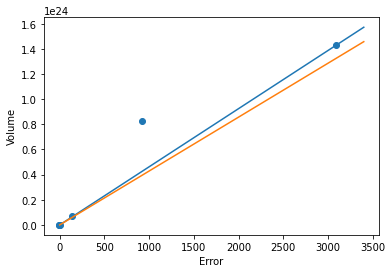

In [ ]:
orbital_free_ratio_error = np.array([0.1458,1.10977,3.545937,0.0079534,0.0111865,0.0622]) # Merc, Venus, Mars, Jupiter, Saturn, Uranus
error2 = np.array([-3.160535,-0.877375,-2.67163,3092.12,922.826,133.69]) # Merc, Venus, Mars, Jupiter, Saturn, Uranus

Volume = np.array([6.08*10**19,9.2843*10**20,1.6318*10**20,1.43128*10**24,8.2713*10**23,6.833*10**22]) # Merc, Venus, Mars, Jupiter, Saturn, Uranus
Pressure = np.array([101325,93*101325,610,400000,140000,101325])  # pascals
Temp = np.array([415,737,210,165,134,750])  # kelvin

#plt.scatter(Pressure,orbital_free_ratio_error)
#plt.scatter(Temp,orbital_free_ratio_error)
#plt.scatter(Volume,orbital_free_ratio_error)
#plt.scatter(Volume,orbital_free_ratio_error)

#formula = Volume**(1/6)/(Pressure**(2/6)*Temp**(7/10)*orbital_free_ratio_error**(6/4))
#formula = Volume**(1/2)/(Pressure**(0)*Temp**(0)*orbital_free_ratio_error**(6/4))
formula = Volume

plt.scatter(error2, formula)

x = np.linspace(0,3400,3400)
y = x

m = (max(formula)-min(formula))/(max(error2)-min(error2))

plt.plot(x,m*y)

plt.plot(x,ms*y)

plt.xlabel('Error')
plt.ylabel('Volume')

print(max(formula))
print(max(error2))
print(m)

# So volume / ms = error

In [ ]:
 def err_removal(Volume):
   orbital_ratio_error = Volume/ms # ms = 4.623875554465697e+20
   return orbital_ratio_error

In [ ]:
Volume = np.array([6.08*10**19,9.2843*10**20,1.6318*10**20,1.43128*10**24,8.2713*10**23,6.833*10**22])

print(orbital_free_ratio_error) # Merc, Venus, Mars, Jupiter, Saturn, Uranus
err_removal(Volume)

[0.1458    1.10977   3.545937  0.0079534 0.0111865 0.0622   ]


array([1.41841202e-01, 2.16594781e+00, 3.80684988e-01, 3.33905387e+03,
       1.92962357e+03, 1.59408048e+02])

## (Not used) Error removal

In [ ]:
# Applying machine learning
iterate = 10

# Stored
Volume = np.array([6.08*10**19,9.2843*10**20,1.6318*10**20,1.43128*10**24,8.2713*10**23,6.833*10**22])
Pressure = np.array([101325,93*101325,610,400000,140000,101325])  # pascals
Temp = np.array([415,737,210,165,134,750])  # kelvin

# Initialise
const_stored = np.array([100,1,1,1])
stored_loss = -1E30*np.ones(len(Volume))
plotloss = 1E30*np.ones([iterate,len(Volume)])
plotsumloss = []
# Ratio error
orbital_free_ratio_error = np.array([0.1458,1.10977,3.545937,0.0079534,0.0111865,0.0622]) # Merc, Venus, Mars, Jupiter, Saturn, Uranus



# Machine learning to remove error
for i in range(iterate):

  # Formula to remove error
  formula = const_stored[0]*Volume**(const_stored[1])/(Pressure**(const_stored[2])*Temp**(const_stored[3]))

  loss = -abs(orbital_free_ratio_error - formula) # trying to make this equal to 0

  print(np.round(stored_loss,2))
  #print(loss)

  for j in range(len(Volume)):

    if loss[j]>stored_loss[j]:
      stored_loss[j] = loss[j] # loss has improved

    plotloss[i,j] = stored_loss[j]


# Back propagation

  for n in range(-iterate):
    
    if sum(loss)>sum(stored_loss):
      const_stored = np.random.random(4)
  

  plotsumloss.append(sum(stored_loss))

    

[-1.e+30 -1.e+30 -1.e+30 -1.e+30 -1.e+30 -1.e+30]
[-1.44590204e+14 -1.33684826e+13 -1.27384856e+17 -2.16860606e+18
 -4.40900853e+18 -8.99152891e+16]
[-1.44590204e+14 -1.33684826e+13 -1.27384856e+17 -2.16860606e+18
 -4.40900853e+18 -8.99152891e+16]
[-1.44590204e+14 -1.33684826e+13 -1.27384856e+17 -2.16860606e+18
 -4.40900853e+18 -8.99152891e+16]
[-1.44590204e+14 -1.33684826e+13 -1.27384856e+17 -2.16860606e+18
 -4.40900853e+18 -8.99152891e+16]
[-1.44590204e+14 -1.33684826e+13 -1.27384856e+17 -2.16860606e+18
 -4.40900853e+18 -8.99152891e+16]
[-1.44590204e+14 -1.33684826e+13 -1.27384856e+17 -2.16860606e+18
 -4.40900853e+18 -8.99152891e+16]
[-1.44590204e+14 -1.33684826e+13 -1.27384856e+17 -2.16860606e+18
 -4.40900853e+18 -8.99152891e+16]
[-1.44590204e+14 -1.33684826e+13 -1.27384856e+17 -2.16860606e+18
 -4.40900853e+18 -8.99152891e+16]
[-1.44590204e+14 -1.33684826e+13 -1.27384856e+17 -2.16860606e+18
 -4.40900853e+18 -8.99152891e+16]


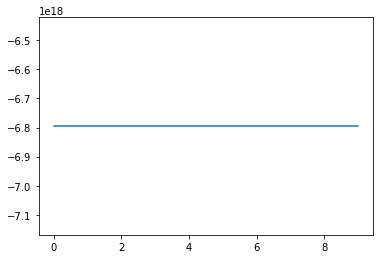

In [ ]:
plt.plot(range(iterate),plotsumloss)

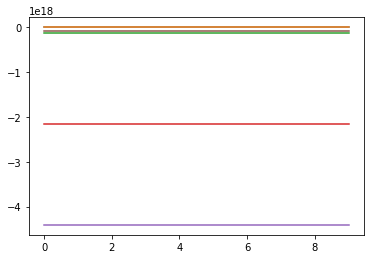

In [ ]:
plt.plot(range(iterate)[0:20],plotloss[0:20]);

In [ ]:
print(const_stored[0],const_stored[1],const_stored[2],const_stored[3])

100 1 1 1


In [ ]:
def err_formula(Volume,Pressure,Temperature):
  return const_stored[0]*Volume**(const_stored[1])/(Pressure**(const_stored[2])*Temperature**(const_stored[3]))

In [ ]:
# Test error removal

# Mercury
Temp = 415  # kelvin
Pressure = 101325  # pascals
Volume = 6.08*10**19

# # Uranus
# Temp = 750  # kelvin
# Pressure = 101325  # pascals
# Volume = 6.833*10**22

# Jupiter
Temp = 165  # kelvin
Pressure = 400000  # pascals
Volume = 1.43128*10**24

print(orbital_free_ratio_error) # Merc, Venus, Mars, Jupiter, Saturn, Uranus
err_formula(Volume,Pressure,Temp)

[0.1458    1.10977   3.545937  0.0079534 0.0111865 0.0622   ]


2.1686060606060608e+18

## Testing electograv equations with error removal

In [ ]:
 def err_removal(Volume):
   return Volume/ms # ms = 4.623875554465697e+20

In [ ]:
# Earth
Temp = 288  # kelvin
Pressure = 101325  # pascals
mass = 5.972*10**24
Volume = 1.0832*10**21

Epvt = Pressure/Temp


Kel2eV = 8.61732814974493E-05
Temp_eV = 288*Kel2eV

n = 0.49*mass/(1.672619*10**-27) # total number of electrons: 175*10**49
nEarth = n
numorbital = 1.2997*10**47
numfree = n - numorbital # 1.74987E51

energyE = (n / (n-numfree))*(1.60217*10**-19) # ratio of total electron energy to orbital electron energy in Earth
moe = (9.1*10**-31) # mass of one orbital electron

f=(1.60217*10**-19)/(6.63*10**-34) # freq of electron wave f=E/h
T=1/f
m2_s_2 = energyE*T/moe # a = (E x T)/mass (change to energy and mass of orbital electrons) ratio of 

a = m2_s_2
a

9.807264096169906

In [ ]:
# Mercury
Temp = 415  # kelvin
Pressure = 101325  # pascals
mass = 3.285*10**23
Volume = 6.08*10**19

Vpvt = Pressure/Temp

n = 0.49*mass/(1.672619*10**-27) # total number of electrons
nVenus = n

pvt_ratio = np.sqrt(1/((nEarth/nVenus)*(Vpvt/Epvt)))  # gas law (Gay-Lussac's law as volume remains the same)
print(pvt_ratio)

numorbital = 1.2997*10**47
numfree = n - numorbital # 1.74987E51

energyE = (n / numorbital)*(1.60217*10**-19) # ratio of total electron energy to orbital electron energy in Earth # (0.1458)*
moe = (9.1*10**-31) # mass of one orbital electron

f=(1.60217*10**-19)/(6.63*10**-34) # freq of electron wave f=E/h
T=1/f
m2_s_2 = energyE*T/moe # a = (E x T)/mass (change to energy and mass of orbital electrons) ratio of 

a = m2_s_2 
abs(a-(err_removal(Volume)))

0.2815370734808106


0.3976240118928893

In [ ]:
# Venus
Temp = 737  # kelvin
Pressure = 93*101325  # pascals
mass = 4.867*10**24
Volume = 9.2843*10**20

Vpvt = Pressure/Temp

n = 0.49*mass/(1.672619*10**-27) # total number of electrons
nVenus = n

pvt_ratio = np.sqrt(1/((nEarth/nVenus)*(Vpvt/Epvt)))  # gas law (Gay-Lussac's law as volume remains the same)
print(pvt_ratio)

numorbital = 1.2997*10**47
numfree = n - numorbital # 1.74987E51

energyE = (n / numorbital)*(1.60217*10**-19) # ratio of total electron energy to orbital electron energy in Earth # (1.10977)*
moe = (9.1*10**-31) # mass of one orbital electron

f=(1.60217*10**-19)/(6.63*10**-34) # freq of electron wave f=E/h
T=1/f
m2_s_2 = energyE*T/moe # a = (E x T)/mass (change to energy and mass of orbital electrons) ratio of 

a = m2_s_2
abs(a-(err_removal(Volume)))

0.1497499890718193


5.826676830200277

In [ ]:
# Mars
Temp = 210  # kelvin
Pressure = 610  # pascals
mass = 6.39*10**23
Volume = 1.6318*10**20

Mpvt = Pressure/Temp

n = 0.49*mass/(1.672619*10**-27) # total number of electrons
nMars = n

pvt_ratio = np.sqrt(1/((nEarth/nMars)*(Mpvt/Epvt)))  # gas law (Gay-Lussac's law as volume remains the same)
print(pvt_ratio)

numorbital = 1.2997*10**47
numfree = n - numorbital # 1.74987E51

energyE = (n / numorbital)*(1.60217*10**-19) # ratio of total electron energy to orbital electron energy in Earth # (3.545937)*
moe = (9.1*10**-31) # mass of one orbital electron

f=(1.60217*10**-19)/(6.63*10**-34) # freq of electron wave f=E/h
T=1/f
m2_s_2 = energyE*T/moe # a = (E x T)/mass (change to energy and mass of orbital electrons) ratio of 

a = m2_s_2
abs(a-(err_removal(Volume)))

3.599957069724976


0.6686857010739131

In [ ]:
# Jupiter
Temp = 165  # kelvin
Pressure = 400000  # pascals
mass = 1.898*10**27
Volume = 1.43128*10**24

Jpvt = Pressure/Temp

n = 0.49*(mass)/(1.672619*10**-27) # total number of electrons
nJup = n

pvt_ratio = np.sqrt(1/(((nEarth/nJup)*(Jpvt/Epvt))))  # gas law (Gay-Lussac's law as volume remains the same)
print(pvt_ratio)

numorbital = 1.2997*10**47
numfree = n - numorbital # 1.74987E51

energyE = (n / numorbital)*(1.60217*10**-19) # ratio of total electron energy to orbital electron energy in Earth # (0.0079534)*
moe = (9.1*10**-31) # mass of one orbital electron

f=(1.60217*10**-19)/(6.63*10**-34) # freq of electron wave f=E/h
T=1/f
m2_s_2 = energyE*T/moe # a = (E x T)/mass (change to energy and mass of orbital electrons) ratio of 

a = m2_s_2
abs(a-(err_removal(Volume)))

6.7914458655194805


222.14374498969482

In [ ]:
# Saturn
Temp = 134  # kelvin
Pressure = 140000  # pascals
mass = 5.683*10**26
Volume = 8.2713*10**23

Jpvt = Pressure/Temp

n = 0.49*(mass)/(1.672619*10**-27) # total number of electrons
nJup = n

pvt_ratio = np.sqrt(1/(((nEarth/nJup)*(Jpvt/Epvt))))  # gas law (Gay-Lussac's law as volume remains the same)
print(pvt_ratio)

numorbital = 1.2997*10**47
numfree = n - numorbital # 1.74987E51

energyE = (n / numorbital)*(1.60217*10**-19) # ratio of total electron energy to orbital electron energy in Earth # (0.0111865)*
moe = (9.1*10**-31) # mass of one orbital electron

f=(1.60217*10**-19)/(6.63*10**-34) # freq of electron wave f=E/h
T=1/f
m2_s_2 = energyE*T/moe # a = (E x T)/mass (change to energy and mass of orbital electrons) ratio of 

a = m2_s_2
a

5.660820346025921


933.2666084829672

In [ ]:
# Uranus
Temp = 750  # kelvin
Pressure = 101325  # pascals
mass = 8.681*10**25
Volume = 6.833*10**22

Upvt = Pressure/Temp

n = 0.49*(mass)/(1.672619*10**-27) # total number of electrons
nUra = n

pvt_ratio = np.sqrt(1/(((nEarth/nUra)*(Upvt/Epvt))))  # gas law (Gay-Lussac's law as volume remains the same)
print(pvt_ratio)

numorbital = 1.2997*10**47
numfree = n - numorbital # 1.74987E51

energyE = (n / numorbital)*(1.60217*10**-19) # ratio of total electron energy to orbital electron energy in Earth # (0.0622)*
moe = (9.1*10**-31) # mass of one orbital electron

f=(1.60217*10**-19)/(6.63*10**-34) # freq of electron wave f=E/h
T=1/f
m2_s_2 = energyE*T/moe # a = (E x T)/mass (change to energy and mass of orbital electrons) ratio of 

a = m2_s_2
(err_removal(Volume))-a

6.15260970791304


16.848001653559834

In [ ]:
# Sun
Temp = 5778  # kelvin
Pressure = 340000000000*101325  # pascals
mass = 1.989*10**30
Volume = 1.4*10**27

Upvt = Pressure/Temp

n = 0.49*(mass)/(1.672619*10**-27) # total number of electrons
nUra = n

pvt_ratio = np.sqrt(1/(((nEarth/nUra)*(Upvt/Epvt))))  # gas law (Gay-Lussac's law as volume remains the same)
print(pvt_ratio)

numorbital = 1.2997*10**47
numfree = n - numorbital # 1.74987E51

energyE = (n / numorbital)*(1.60217*10**-19) # ratio of total electron energy to orbital electron energy in Earth # (0.0622)*
moe = (9.1*10**-31) # mass of one orbital electron

f=(1.60217*10**-19)/(6.63*10**-34) # freq of electron wave f=E/h
T=1/f
m2_s_2 = energyE*T/moe # a = (E x T)/mass (change to energy and mass of orbital electrons) ratio of 

a = m2_s_2

a-(err_removal(Volume))

0.004433130932652625


270.716931596864

## Reversed calculations

In [ ]:
# Reversed

f=(1.60217*10**-19)/(6.63*10**-34) # freq of electron wave f= E/h
T=1/f
n = 175 #*10**49
g = 9.81
m2_s_rev = g/(n*10**49) # acceleration / no. electrons in Earth
predicted_orbital_e_mass_perE = T/m2_s_rev # total orbital mass = E*T*ne/a

n_orbital_perE = predicted_orbital_e_mass_perE/(9.1*10**-31) # number of orbital electrons = E*T*n/(a*me)
n_orbital_perE

8.11208666747253e+65

In [ ]:
n_orbital_perE = T*1.75*10**51/(g*9.1*10**-31) # shortened (per Joule)
n_orbital_perEv = n_orbital_perE*(1.60217*10**-19) # (per eV)
n_orbital_perEv

1.2996941896024462e+47

In [ ]:
# One electron gravity contribution estimate

energy1 = 1.60217*10**-19
me1 = 9.1*10**-31

a = energy1*T*1/me1
a

0.0007285714285714286

In [ ]:
n_orbital_perEv*a # combined acceleration for electrons of 1eV

9.469200524246393e+43

In [ ]:
Eo = n_orbital_perEv*a/9.81 # total energy of 1eV orbital electrons
Eo

9.652599922779197e+42

In [ ]:
numo = Eo*T/(a*me1*n*10**49)          # Eo*T/(a*me1*n)
numo # number of orbital electrons in Earth: 3.44*10**10

34426879697.19353

In [ ]:
numo = Eo/(13.6*energy1*n*10**49) # simplified (total energy of 1J orbital electrons)/(number of orbital electrons)
numo

2531388213.0289364

In [ ]:
Eo1 = Eo/numo
Eo1
sum(EdistNorm)

16236.34696771577

# Gravitational acceleration formula using orbital-free electron ratio

In [ ]:
def orbital_free_ratio(gravity):
  return gravity*(9.1E-31)/(6.63E-34)

def orbital_free_ratio(gravity):
  return gravity*(9.1E-31)/((6.63E-34)*(1.6E-19))

def total_electrons(mass):
  return 0.49*mass/(1.672619*10**-27) # total number of electrons

## Feature Extraction


In [ ]:
# Planetary data

planet = np.array(['Merc 3.7', 'Venus 8.8', 'Earth 9.8', 'Mars 3.7', 'Jupiter 24.7', 'Saturn 10.5', 'Uranus 9.0','Neptune 11.7','Pluto 0.49', 'Sun 293.0'])
Volume = np.array([6.08*10**19,9.2843*10**20,1.0832*10**21,1.6318*10**20,1.43128*10**24,8.2713*10**23,6.833*10**22,6.254E22,6.4E18,1.4*10**27])
Pressure = np.array([101325,93*101325,101325,610,400000,140000,101325,1000E5,0.022,340000000000*101325])  # pascals
Temp = np.array([415,737,288,210,165,134,76,72,44,5778])  # kelvin
Core_Pressure = np.array([5,700,330,40,3000,4620,800,10,1.34,2.6E7])  # gigapascals (Venus unknown)
Sun_distance = np.array([0.39,0.72,1,1.52,5.2,9.54,19.2,30.06,39,0.001]) # au

Grav = np.array([3.7,8.8,9.8,3.7,24.7,10.5,9.0,11.7,0.49,293.0])  # m2s_2
mass = np.array([0.330,4.87,5.97,0.642,1898,568,86.8,1.024E2,0.01303,1989000])*10**24  # kg

orb2free_ratio = orbital_free_ratio(Grav) # = (e_orb + e_free) / e_orb  (or = eT / e_orb)
eT = total_electrons(mass)

# Note that orb2free_ratio = eT / e_orb
# and so e_orb = eT / orb2free_ratio

e_orb = eT / orb2free_ratio

e_free = eT - e_orb

print(e_orb)
print('')
print(e_free)

# Merc, Venus, Earth, Mars, Jupiter, Saturn, Uranus, Neptune, Pluto, Sun

[3.0458140715168755e+27 1.8898940686867277e+28 2.080364472038845e+28
 5.925492830041923e+27 2.6241607040405357e+30 1.84735435864354e+30
 3.293581303731851e+29 2.988857900586154e+29 9.081121966722332e+26
 2.3182396831641475e+32]

[9.667473584839104e+49 1.4266847381262556e+51 1.7489338576208923e+51
 1.880763042868699e+50 5.56026208000746e+53 1.6639772715723064e+53
 2.5428385065576794e+52 2.9998463487500743e+52 3.817187297286471e+48
 5.826849987953024e+56]


## PCA analysis (Categorise planets)

### Feature extraction

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn import decomposition

In [ ]:
data = [planet,Volume,Pressure,Temp,Core_Pressure, Sun_distance, Grav, mass, e_orb, e_free, eT, orb2free_ratio]
header = ['planet','Volume','Pressure','Temp','Core_Pressure', 'Sun_distance', 'Grav', 'mass', 'e_orb', 'e_free', 'eT', 'orb2free_ratio']
df = pd.DataFrame(np.transpose(data), columns = header)
df = df.set_index('planet')
df

,Volume,Pressure,Temp,Core_Pressure,Sun_distance,Grav,mass,e_orb,e_free,eT,orb2free_ratio
planet,,,,,,,,,,,
Merc 3.7,60800000000000000000.0,101325.0,415,5.0,0.39,3.7,330000000000000029360128.0,3045814071516875497096085504.0,9667473584839104417330091759519207655826963352...,9667473584839104417330091759519207655826963352...,31740196078431376506880.0
Venus 8.8,928429999999999934464.0,9423225.0,737,700.0,0.72,8.8,4869999999999999601541120.0,18898940686867277389930430464.0,1426684738126255602986634343291470055353086860...,1426684738126255602986634343291470055353086860...,75490196078431391711232.0
Earth 9.8,1083200000000000000000.0,101325.0,288,330.0,1.0,9.8,5969999999999999207276544.0,20803644720388451767416782848.0,1748933857620892333820887665384868254059377704...,1748933857620892333820887665384868254059377704...,84068627450980420550656.0
Mars 3.7,163180000000000000000.0,610.0,210,40.0,1.52,3.7,642000000000000046137344.0,5925492830041922661072764928.0,1880763042868698820489694094302955710222834188...,1880763042868698820489694094302955710222834188...,31740196078431376506880.0
Jupiter 24.7,1431280000000000171966464.0,400000.0,165,3000.0,5.2,24.7,1897999999999999949903233024.0,2624160704040535663351886249984.0,5560262080007459798150116423564119895991299223...,5560262080007459798150116423564119895991299223...,211887254901960810168320.0
Saturn 10.5,827130000000000005767168.0,140000.0,134,4620.0,9.54,10.5,568000000000000011945377792.0,1847354358643540009771845287936.0,1663977271572306388407728739450392630896578144...,1663977271572306388407728739450392630896578144...,90073529411764706344960.0
Uranus 9.0,68330000000000001572864.0,101325.0,76,800.0,19.2,9.0,86800000000000000905969664.0,329358130373185117268387823616.0,2542838506557679359561143035832573859656464479...,2542838506557679359561143035832573859656464479...,77205882352941184057344.0
Neptune 11.7,62539999999999996854272.0,100000000.0,72,10.0,30.06,11.7,102400000000000008589934592.0,298885790058615412375173464064.0,2999846348750074338168607992301890868611975447...,2999846348750074338168607992301890868611975447...,100367647058823544307712.0
Pluto 0.49,6400000000000000000.0,0.022,44,1.34,39.0,0.49,13030000000000000524288.0,908112196672233211831517184.0,3817187297286471013330290959134624913320809857...,3817187297286471013330290959134624913320809857...,4203431372549020188672.0


In [ ]:
mean = df.mean()
sd = df.std()

df_norm = ((df-mean)/sd).astype(float) # Normalise
df_norm
df_norm = df_norm.drop('Sun 293.0')
df_norm = df_norm.drop(header[1:3], axis = 1)
df_norm = df_norm.drop(header[4:8], axis = 1)
df_norm = df_norm.drop(header[9:12], axis = 1)
df_norm

,Temp,e_orb
planet,,
Merc 3.7,-0.213626,-0.323985
Venus 8.8,-0.031117,-0.323768
Earth 9.8,-0.285609,-0.323742
Mars 3.7,-0.329819,-0.323945
Jupiter 24.7,-0.355325,-0.288145
Saturn 10.5,-0.372896,-0.298766
Uranus 9.0,-0.405770,-0.319523
Neptune 11.7,-0.408038,-0.319939
Pluto 0.49,-0.423908,-0.324014


### PCA analysis

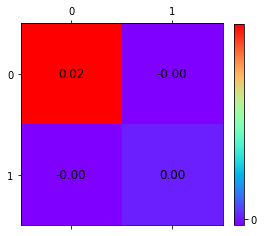

[0.01572302 0.00016284]



In [ ]:
cov_data = np.cov(df_norm.T) # covariance matrix

img = plt.matshow(cov_data, cmap=plt.cm.rainbow)
plt.colorbar(img, ticks = [-1, 0, 1], fraction=0.045)
for x in range(cov_data.shape[0]):
    for y in range(cov_data.shape[1]):
        plt.text(x, y, "%0.2f" % cov_data[x,y], size=12, color='black', ha="center", va="center")
        
plt.show() # strong correlation between feature 4 and all other features

eigenvalues,eigenvectors = np.linalg.eig(cov_data)
print(eigenvalues)
print('')
#print(eigenvectors)


Text(0.5, 1.0, 'Scree Plot')

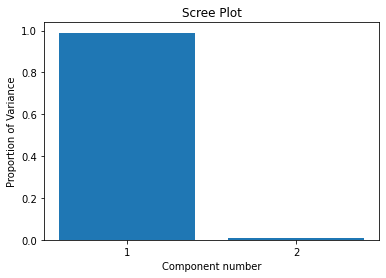

In [ ]:
# PCA

pca = decomposition.PCA()
pca = pca.fit(df_norm)
plt.bar(np.arange(1,1+len(df_norm.count())), pca.explained_variance_ratio_)
plt.xticks(np.arange(1,1+len(df_norm.count())))  # Set label locations.
plt.xlabel("Component number")
plt.ylabel("Proportion of Variance")
plt.title("Scree Plot")

In [ ]:
pca = decomposition.PCA(n_components = 2)
pca = pca.fit(df_norm)
df_transformed = pca.transform(df_norm)

print(df_transformed)

[[ 0.10057255 -0.00480558]
 [ 0.28299489  0.00081559]
 [ 0.02861364 -0.00669446]
 [-0.01557115 -0.00820697]
 [-0.04212599  0.02682257]
 [-0.05937448  0.01568523]
 [-0.09161967 -0.00603552]
 [-0.09387353 -0.00651914]
 [-0.10961625 -0.01106172]]


### PCA plot

In [ ]:
# With simply temperature and number of orbital electrons
# we can work out the type of planet

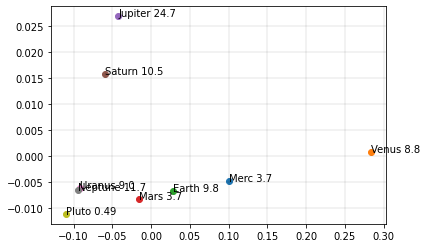

In [ ]:
for i, txt in enumerate(planet[0:len(df_norm)]):
    plt.scatter(df_transformed[i,0],df_transformed[i,1], label = planet[i])
    plt.annotate(txt, (df_transformed[i,0],df_transformed[i,1]))

plt.grid(color='k', linestyle='-', linewidth=0.1)

## Orbital vs free

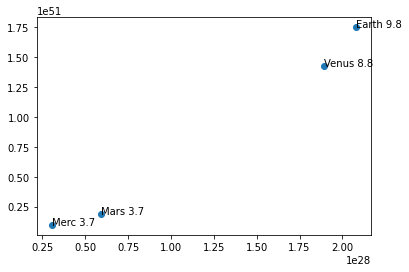

In [ ]:
n = 4 # up to 10
z = (e_orb)[0:n]
y = (e_free)[0:n]

plt.scatter(z, y)

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (z[i], y[i]))

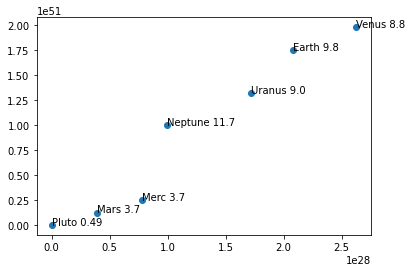

In [ ]:
n = 4 # up to 10
z = np.append((e_orb/Sun_distance)[0:n],(e_orb/Sun_distance)[6:9])
y = np.append((e_free/Sun_distance)[0:n],(e_free/Sun_distance)[6:9])

plt.scatter(z, y)

for i, txt in enumerate(np.append(planet[0:n],planet[6:9])):
    plt.annotate(txt, (z[i], y[i]))

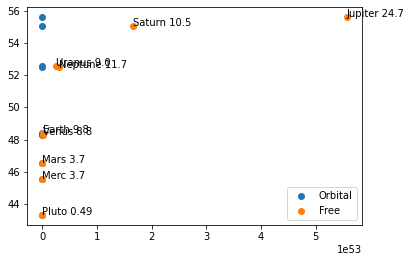

In [ ]:
n = 9

z = e_free[0:n]
y = np.log(Volume[0:n])

plt.scatter(e_orb[0:n], y,label='Orbital')
plt.scatter(z,y,label='Free');

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (z[i], y[i]))

plt.legend()

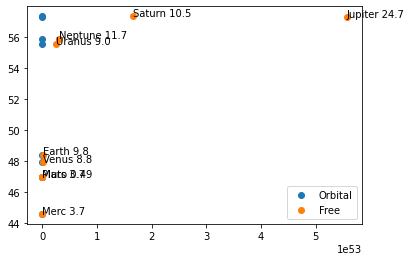

In [ ]:
n = 9

z = e_free[0:n]
y = np.log(Volume[0:n]*Sun_distance[0:n])

plt.scatter(e_orb[0:n], y,label='Orbital')
plt.scatter(z,y,label='Free');

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (z[i], y[i]))

plt.legend()

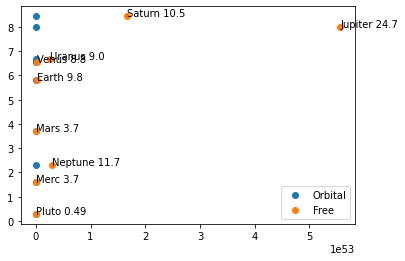

In [ ]:
n = 9

z = e_free[0:n]
y = np.log(Core_Pressure[0:n])

plt.scatter(e_orb[0:n], y,label='Orbital')
plt.scatter(z,y,label='Free');

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (z[i], y[i]))

plt.legend()

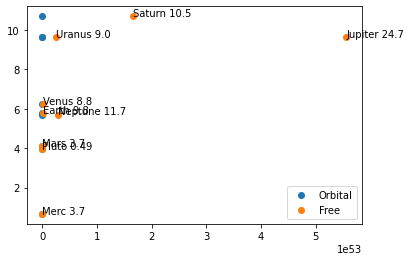

In [ ]:
n = 9

z = e_free[0:n]
y = np.log(Core_Pressure[0:n]*Sun_distance[0:n])

plt.scatter(e_orb[0:n], y,label='Orbital')
plt.scatter(z,y,label='Free');

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (z[i], y[i]))

plt.legend()

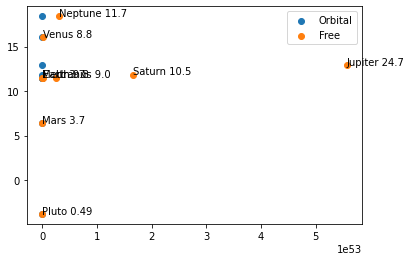

In [ ]:
n = 9

z = e_free[0:n]
y = np.log(Pressure[0:n])

plt.scatter(e_orb[0:n], y,label='Orbital')
plt.scatter(z,y,label='Free');

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (z[i], y[i]))

plt.legend()

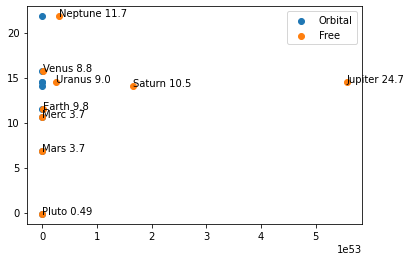

In [ ]:
n = 9

z = e_free[0:n]
y = np.log(Pressure[0:n]*Sun_distance[0:n])

plt.scatter(e_orb[0:n], y,label='Orbital')
plt.scatter(z,y,label='Free');

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (z[i], y[i]))

plt.legend()

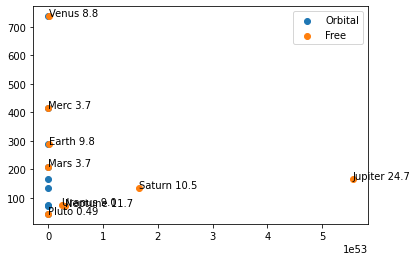

In [ ]:
n = 9

z = e_free[0:n]
y = Temp[0:n]

plt.scatter(e_orb[0:n], y,label='Orbital')
plt.scatter(z,y,label='Free');

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (z[i], y[i]))

plt.legend()

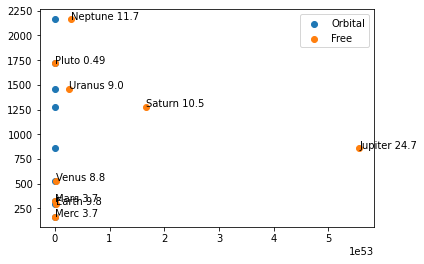

In [ ]:
n = 9

z = e_free[0:n]
y = Temp[0:n]*Sun_distance[0:n]

plt.scatter(e_orb[0:n], y,label='Orbital')
plt.scatter(z,y,label='Free');

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (z[i], y[i]))

plt.legend()

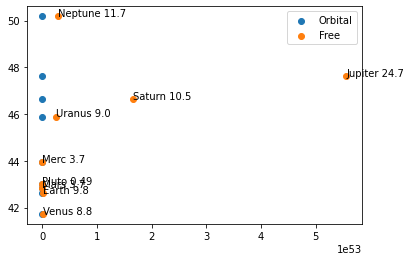

In [ ]:
n = 9

z = e_free[0:n]
y = np.log((Volume/Core_Pressure))[0:n]

plt.scatter(e_orb[0:n], y,label='Orbital');
plt.scatter(z,y,label='Free');

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (z[i], y[i]))

plt.legend()

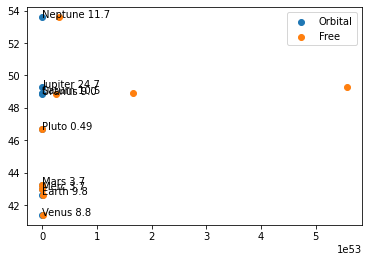

In [ ]:
n = 9

z = e_orb[0:n]
y = np.log(Sun_distance*Volume/Core_Pressure)[0:n]

plt.scatter(z, y,label='Orbital');
plt.scatter(e_free[0:n],y,label='Free');

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (z[i], y[i]))

plt.legend()

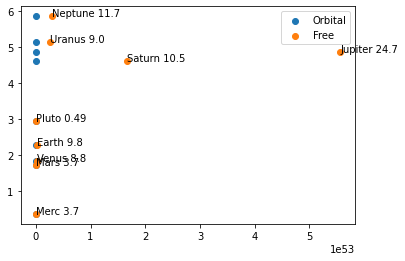

In [ ]:
n = 9

z = e_free[0:n]
y = np.log(Grav[0:n]*Sun_distance[0:n])

plt.scatter(e_orb[0:n], y,label='Orbital')
plt.scatter(z,y,label='Free');

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (z[i], y[i]))

plt.legend()

## Orbital

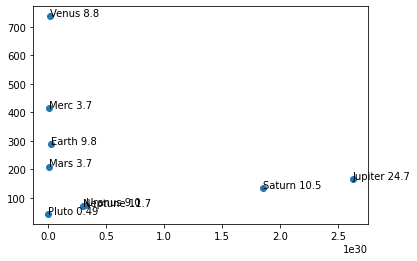

In [ ]:
# Same as PCA graph

n = 9

z = e_orb[0:n]
y = (Temp)[0:n]

plt.scatter(z, y);
#plt.scatter(e_free[0:n],y,label='Free');

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (z[i], y[i]))

No handles with labels found to put in legend.


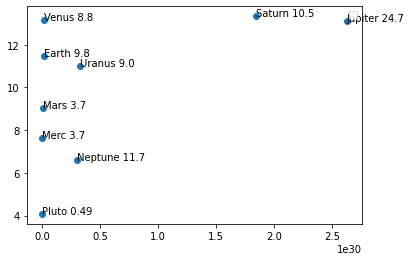

In [ ]:
n = 9

z = e_orb[0:n]
y = np.log(Core_Pressure*Temp)[0:n]

plt.scatter(z, y);
#plt.scatter(e_free[0:n],y,label='Free');

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (z[i], y[i]))

plt.legend()

# Earth free electron analysis

## Gravity method

In [ ]:
# def orbital_free_ratio(gravity):
#   return gravity*(9.1E-31)/((6.63E-34)*(1.6E-19))

def orbital_free_ratio(gravity):
  return gravity*(9.1E-31)*(6.63E-34)/(1.6E-19)**2

def total_electrons(mass):
  return 0.49*mass/(1.672619*10**-27) # total number of electrons

### Feature extraction

In [ ]:
# Planetary data

planet = np.array(['Merc 3.7', 'Venus 8.8', 'Earth 9.8', 'Mars 3.7', 'Jupiter 24.7', 'Saturn 10.5', 'Uranus 9.0','Neptune 11.7','Pluto 0.49', 'Sun 293.0'])
Volume = np.array([6.08*10**19,9.2843*10**20,1.0832*10**21,1.6318*10**20,1.43128*10**24,8.2713*10**23,6.833*10**22,6.254E22,6.4E18,1.4*10**27])
Pressure = np.array([101325,93*101325,101325,610,400000,140000,101325,1000E5,0.022,340000000000*101325])  # pascals
Temp = np.array([415,737,288,210,165,134,76,72,44,5778])  # kelvin
Core_Pressure = np.array([5,700,330,40,3000,4620,800,10,1.34,2.6E7])  # gigapascals (Venus unknown)
Sun_distance = np.array([0.39,0.72,1,1.52,5.2,9.54,19.2,30.06,39,0.001]) # au


Grav = np.array([3.7,8.8,9.8,3.7,24.7,10.5,9.0,11.7,0.49,293.0])  # m2s_2
mass = np.array([0.330,4.87,5.97,0.642,1898,568,86.8,1.024E2,0.01303,1989000])*10**24  # kg

orb2free_ratio = orbital_free_ratio(Grav) # = (e_orb + e_free) / e_orb  (or = eT / e_orb)
eT = total_electrons(mass)

# Note that orb2free_ratio = eT / e_orb
# and so e_orb = eT / orb2free_ratio

e_orb = eT * orb2free_ratio

e_free = eT - e_orb

print(eT)
print('')
print(e_orb)
print('')
print(e_free)

# Merc, Venus, Earth, Mars, Jupiter, Saturn, Uranus, Neptune, Pluto, Sun

[9.667473584839104e+49 1.4266847381262556e+51 1.7489338576208923e+51
 1.880763042868699e+50 5.56026208000746e+53 1.6639772715723064e+53
 2.5428385065576794e+52 2.9998463487500743e+52 3.817187297286471e+48
 5.826849987953024e+56]

[8.43004074233657e+24 2.9588683542471413e+26 4.039377261843925e+26
 1.6400261080545692e+25 3.236735200861455e+29 4.11767100633049e+28
 5.39356906463008e+27 8.271796242898115e+27 4.4081311324812685e+22
 4.023614949792529e+33]

[9.667473584839104e+49 1.4266847381262556e+51 1.7489338576208923e+51
 1.880763042868699e+50 5.56026208000746e+53 1.6639772715723064e+53
 2.5428385065576794e+52 2.9998463487500743e+52 3.817187297286471e+48
 5.826849987953024e+56]


### Magnetic field method

In [ ]:
# Electron will have kinetic energy 1eV = 11 604.45 K
# KE = 0.5mv**2, v = np.sqrt(2*KE/me)
# F = qvB, B=F/Qv, F = mg

#nT = 1.7489338576208923e+51

q = 1.6E-19
me = 9.1E-31

# Working out magnetic field strength
relperm = 1 # air = 1, pure iron - 8000
uo = 4*np.pi*10**-7
u = relperm*uo

t = 24*60*60 # daily seconds
B = 40E-6
#B = 65000E-9

current = q/t

# Thermal energy in Earth
Tcore = 5000
Temp = 288

eV = Tcore/11604.45
Eth = eV*(1.6E-19)

Pth = 47E12 # watts Js-1
Eth = 47E12*t # thermal energy of Earth

# Energy from Sun
Ps = 2.55E14
Es = Ps*t

print(Eth, Es)

c = 0.8 # specific heat capacity of liquid iron

# Eth = m c deltaT
# Eth = mc delta T + Es
# m = (Eth - Es)/cdelta T
n_freeTH = Eth/(me*c*(Tcore-Temp))
print(n_freeTH)

r = 6371E3
k = 8.987E9
Fe = k*q**2/(r**2) # Electric force caused by one free electron from Iron core

# v = np.sqrt(2*E/me)
# B = u*n_free**(1/2)*current # 1/2 to reduce free electron volume to a free electron surface like a coil of wire (might not need this)

# n_free makes up whole sphere of Iron core, but only surface is calculated. To go from surace to volume divide by 3 increase power by 1.
# assume n_free volume = 4/3 pi r^3 then n_free Area = 4 pi r^2

n_free = (B/(u*current))**(2)
print(n_free)

n_free+n_freeTH

# (n_orb + n_free) / n_free
# expecting: 1.7489E51 

4.0608e+18 2.2032e+19
1.1837907423645963e+45
2.95452571501057e+50


2.954537552917994e+50

In [ ]:
# Electron will have kinetic energy 1eV = 11 604.45 K
# KE = 0.5mv**2, v = np.sqrt(2*KE/me)
# F = qvB, B=F/Qv, F = mg

#nT = 1.7489338576208923e+51

q = 1.6E-19
me = 9.1E-31

# Working out magnetic field strength
relperm = 1 # air = 1, pure iron - 8000
uo = 4*np.pi*10**-7
u = relperm*uo

t = 24*60*60 # daily seconds
B = 40E-6
#B = 65000E-9

current = q/t

# Thermal energy in Earth
Tcore = 5000
Temp = 288

eV = Tcore/11604.45
Eth = eV*(1.6E-19)

Pth = 47E12 # watts Js-1
Eth = 47E12*t # thermal energy of Earth

# Energy from Sun
Ps = 2.55E14
Es = Ps*t

print(Eth, Es)

c = 0.8 # specific heat capacity of liquid iron

# Eth = m c deltaT
# Eth = mc delta T + Es
# m = (Eth - Es)/cdelta T
n_freeTH = Eth/(me*c*(Tcore-Temp))
print(n_freeTH)

r = 6371E3
k = 8.987E9
Fe = k*q**2/(r**2) # Electric force caused by one free electron from Iron core

# v = np.sqrt(2*E/me)
# B = u*n_free**(1/2)*current # 1/2 to reduce free electron volume to a free electron surface like a coil of wire (might not need this)

# n_free makes up whole sphere of Iron core, but only surface is calculated. To go from surace to volume divide by 3 increase power by 1.
# assume n_free volume = 4/3 pi r^3 then n_free Area = 4 pi r^2

n_free = (B/(u*current))**(2)
print(n_free)

n_free+n_freeTH

# (n_orb + n_free) / n_free
# expecting: 1.7489E51

4.0608e+18 2.2032e+19
1.1837907423645963e+45
2.95452571501057e+50


2.954537552917994e+50

In [ ]:
# Don't know core temps of all planets so this is estimate using Earth's core temp

#nT = 1.7489338576208923e+51

q = 1.6E-19
me = 9.1E-31
c = 0.8 # specific heat capacity of liquid iron

# Working out magnetic field strength
relperm = np.array([5000,8000,8000,8000,1,1,1,8000,1,1])              # air = 1, pure iron - 8000
B = np.array([0,0,38,0.1,550,400,32,27,0,76])*10**-6 # sufarce B_r
t = np.array([1408,5832,24,25,10,11,17,16,6.4*24,34*24])*60*60    

Temp = np.array([415,737,288,210,165,134,76,72,44,5778])  # kelvin
Tcore = np.array([8000,5160,5000,1500,20000,35000,5000,7273,1000,15E6])  # kelvin

#mass = np.array([0.330,4.87,5.97,0.642,1898,568,86.8,1.024E2,0.01303,1989000])*10**24  # kg






uo = 4*np.pi*10**-7
u = relperm*uo



current = q/t

# B = u*n_free**(1/2)*current # 1/2 to reduce free electron volume to a free electron surface like a coil of wire (might not need this)

# n_free makes up whole sphere of Iron core, but only surface is calculated. To go from surace to volume divide by 3 increase power by 1.
# assume n_free volume = 4/3 pi r^3 then n_free Area = 4 pi r^2

n_freeMG = (B/(u*current))**(2) 



# Merc, Venus, Earth, Mars, Jupiter, Saturn, Uranus, Neptune, Pluto, Sun
Eth = (e_free-n_freeMG)*me*c*(Tcore-Temp)

#Pth = [,,47E12,,,,,,,] # watts Js-1
#Eth = 47E12*t # thermal energy of Earth


n_freeTH = Eth/(me*c*(Tcore-Temp))




n_free = n_freeMG + n_freeTH

print(n_freeMG)
print('')
print(n_freeTH)
print('')
print(e_free)

# expecting: 1.7489E51

# Merc, Venus, Earth, Mars, Jupiter, Saturn, Uranus, Neptune, Pluto, Sun

[0.00000000e+00 0.00000000e+00 4.16634290e+42 3.13072810e+37
 9.69774337e+51 6.20655576e+51 9.48731035e+49 9.34830402e+41
 0.00000000e+00 1.23297085e+54]

[9.667473584839104e+49 1.4266847381262554e+51 1.748933853454549e+51
 1.880763042868385e+50 5.463284646327913e+53 1.6019117140173968e+53
 2.533351196206145e+52 2.9998463486565913e+52 3.817187297286471e+48
 5.81452027942017e+56]

[9.667473584839104e+49 1.4266847381262556e+51 1.7489338576208923e+51
 1.880763042868699e+50 5.56026208000746e+53 1.6639772715723064e+53
 2.5428385065576794e+52 2.9998463487500743e+52 3.817187297286471e+48
 5.826849987953024e+56]


In [ ]:
nn = n_freeMG/e_free
print(nn) # check similarity
print(np.prod(nn[nn!=0]))

[0.0 0.0 2.3822186783412307e-09 1.6646052853985772e-13
 0.017441162356040603 0.03729952242452401 0.0037309920889853163
 3.116260945846686e-11 0.0 0.002116016125066735]
6.346710794329404e-41


In [ ]:
print(n_freeTH/e_free) # check similarity
print(np.prod(n_freeTH/e_free))

[1.0 0.9999999999999999 0.9999999976177811 0.9999999999998332
 0.9825588376439593 0.9627004775754759 0.9962690079110146
 0.9999999999688374 1.0 0.9978839838749333]
0.9403865850483422


In [ ]:
print(n_free/e_free) # check similarity
print(np.prod(n_free/e_free))

[1.0 0.9999999999999999 0.9999999999999998 0.9999999999999998 1.0 1.0 1.0
 1.0 1.0 1.0]
0.9999999999999994


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in log
  import sys


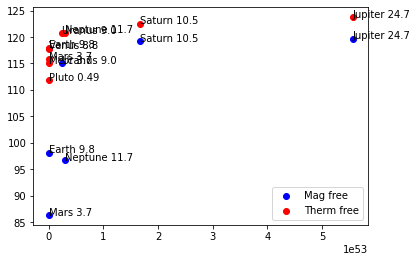

In [ ]:
n = 9

z = e_free[0:n]



y = (np.log(n_freeMG[0:n]))
y2 = ((n_freeTH[0:n]))
y2 = np.log(y2.astype('float64'))
#y3 = e_orb[0:n]

plt.scatter(z,y,color ='b', label = 'Mag free');
plt.scatter(z,y2,color ='r', label = 'Therm free');
#plt.scatter(z,y3,color ='y', label = 'Orbital')
#plt.scatter(z,np.log(n_free[0:n]),color ='y');

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (z[i], y[i]))

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (z[i], y2[i]))

plt.legend(loc='lower right');

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log
  


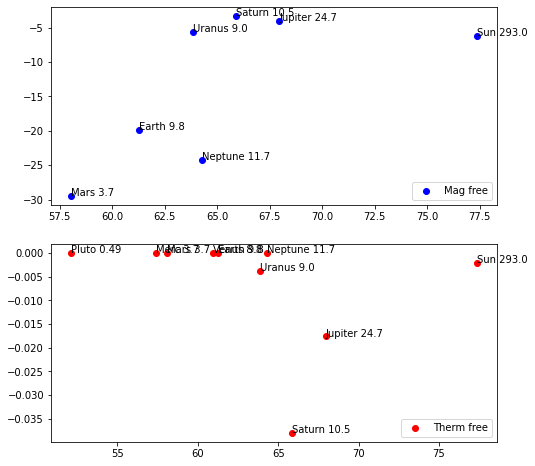

In [ ]:
n = 10

z = np.log(e_orb[0:n].astype('float64'))



y = ((n_freeMG[0:n]/e_free[0:n]))
y = np.log(y.astype('float64'))

y2 = ((n_freeTH[0:n]/e_free[0:n]))
y2 = np.log(y2.astype('float64'))
#y3 = e_orb[0:n]

# Set up the axes with gridspec
fig, axes = plt.subplots(2,1, figsize=(8,8))

# Plots
axes[0].scatter(z,y,color ='b', label = 'Mag free');
axes[1].scatter(z,y2,color ='r', label = 'Therm free');
#ax3.scatter(z,y3,color ='y', label = 'Orbital')
#ax4.scatter(z,np.log(n_free[0:n]),color ='y');

for i, txt in enumerate(planet[0:n]):
    axes[0].annotate(txt, (z[i], y[i]))

for i, txt in enumerate(planet[0:n]):
    axes[1].annotate(txt, (z[i], y2[i]))

axes[0].legend(loc='lower right');
axes[1].legend(loc='lower right');

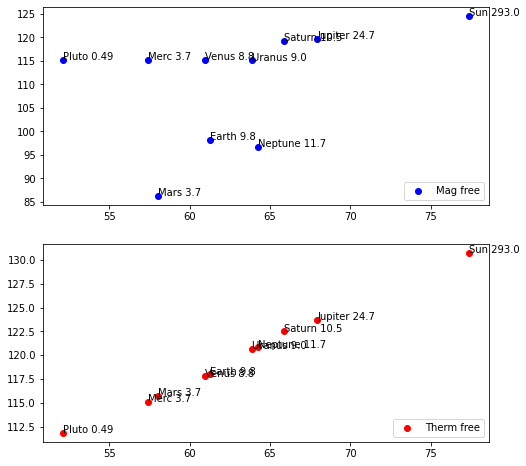

In [ ]:
n = 10

z = np.log(e_orb[0:n].astype('float64'))



y = ((n_freeMG[0:n]))
y[y==0]=1E50
y = np.log(y.astype('float64'))

y2 = ((n_freeTH[0:n]))
y2[y2==0]=1E50
y2 = np.log(y2.astype('float64'))
#y3 = e_orb[0:n]

# Set up the axes with gridspec
fig, axes = plt.subplots(2,1, figsize=(8,8))

# Plots
axes[0].scatter(z,y,color ='b', label = 'Mag free');
axes[1].scatter(z,y2,color ='r', label = 'Therm free');
#ax3.scatter(z,y3,color ='y', label = 'Orbital')
#ax4.scatter(z,np.log(n_free[0:n]),color ='y');

for i, txt in enumerate(planet[0:n]):
    axes[0].annotate(txt, (z[i], y[i]))

for i, txt in enumerate(planet[0:n]):
    axes[1].annotate(txt, (z[i], y2[i]))

axes[0].legend(loc='lower right');
axes[1].legend(loc='lower right');

Text(0, 0.5, 'Free therm')

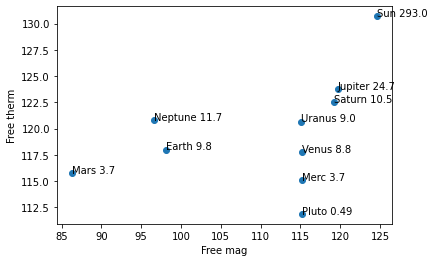

In [ ]:
n = 10

z = np.log(e_orb[0:n].astype('float64'))



y = ((n_freeMG[0:n]))
y[y==0]=1E30
y = np.log(y.astype('float64'))

y2 = ((n_freeTH[0:n]))
y2 = np.log(y2.astype('float64'))

# Plots
plt.scatter(y,y2);

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (y[i], y2[i]))

plt.xlabel('Free mag')
plt.ylabel('Free therm')

Text(0, 0.5, 'Free therm')

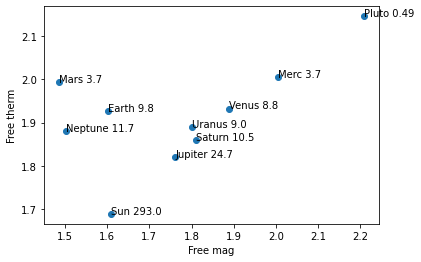

In [ ]:
n = 10

z = np.log(e_orb[0:n].astype('float64'))

y = (n_freeMG[0:n])
y[y==0]=1E30
y = np.log(y.astype('float64'))

y2 = ((n_freeTH[0:n]))
y2 = np.log(y2.astype('float64'))

# Plots
plt.scatter(y/z,y2/z);

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (y[i]/z[i], y2[i]/z[i]))

plt.xlabel('Free mag')
plt.ylabel('Free therm')

# Categorising planets

In [ ]:
def orbital_free_ratio(gravity):
  return gravity*(9.1E-31)*(6.63E-34)/(1.6E-19)**2

def total_electrons(mass):
  return 0.49*mass/(1.672619*10**-27) # total number of electrons

In [ ]:
# Planetary data

planet = np.array(['Merc 3.7', 'Venus 8.8', 'Earth 9.8', 'Mars 3.7', 'Jupiter 24.7', 'Saturn 10.5', 'Uranus 9.0','Neptune 11.7','Pluto 0.49', 'Sun 293.0'])

Volume = np.array([6.08*10**19,9.2843*10**20,1.0832*10**21,1.6318*10**20,1.43128*10**24,8.2713*10**23,6.833*10**22,6.254E22,6.4E18,1.4*10**27])
Pressure = np.array([101325,93*101325,101325,610,400000,140000,101325,1000E5,0.022,340000000000*101325])  # pascals
Temp = np.array([415,737,288,210,165,134,76,72,44,5778])  # kelvin
Core_Pressure = np.array([5,700,330,40,3000,4620,800,10,1.34,2.6E7])  # gigapascals (Venus unknown)
Sun_distance = np.array([0.39,0.72,1,1.52,5.2,9.54,19.2,30.06,39,0.001]) # au

relperm = np.array([5000,8000,8000,8000,1,1,1,8000,1,1])  # air = 1, pure iron - 8000
B = np.array([0,0,38,0.1,550,400,32,27,0,76])*10**-6  # sufarce B_r
t = np.array([1408,5832,24,25,10,11,17,16,6.4*24,34*24])*60*60  # seconds in planet day

Tcore = np.array([8000,5160,5000,1500,20000,35000,5000,7273,1000,15E6])  # kelvin

Grav = np.array([3.7,8.8,9.8,3.7,24.7,10.5,9.0,11.7,0.49,293.0])  # m2s_2
mass = np.array([0.330,4.87,5.97,0.642,1898,568,86.8,1.024E2,0.01303,1989000])*10**24  # kg

## Include Moons ##

moon = np.array(['Moon 1.6', 'Titan (Saturn) 1.4', 'Ganymede'])

VolumeM = np.array([2.1968E19,7.16E19])
PressureM = np.array([3E-10, 147E3])  # pascals
TempM = np.array([26, 94])  # kelvin
Core_PressureM = np.array([5,1.3])  # gigapascals (Venus unknown)
Sun_distanceM = np.array([1,9.5]) # au

relpermM = np.array([5000,1])  # air = 1, pure iron - 8000
BM = np.array([38/1000,0])*10**-6  # sufarce B_r
tM = np.array([708.72,15.9*24])*60*60  # seconds in planet day

TcoreM = np.array([1650,93.6])  # kelvin

GravM = np.array([1.62,1.352])  # m2s_2
massM = np.array([0.07347,0.13452])*10**24  # kg

# Attach Planets and Moons
planet = np.concatenate((planet, moon))

Volume = np.concatenate((Volume, VolumeM))
Pressure = np.concatenate((Pressure, PressureM))  # pascals
Temp = np.concatenate((Temp, TempM))  # kelvin
Core_Pressure = np.concatenate((Core_Pressure, Core_PressureM))  # gigapascals (Venus unknown)
Sun_distance = np.concatenate((Sun_distance, Sun_distanceM)) # au

relperm = np.concatenate((relperm, relpermM))  # air = 1, pure iron - 8000
B = np.concatenate((B, BM))  # sufarce B_r
t = np.concatenate((t, tM))  # seconds in planet day

Tcore = np.concatenate((Tcore, TcoreM))  # kelvin

Grav = np.concatenate((Grav, GravM))  # m2s_2
mass = np.concatenate((mass, massM)) # kg

orb2free_ratio = orbital_free_ratio(Grav) # = (e_orb + e_free) / e_orb  (or = eT / e_orb)
eT = total_electrons(mass)

# Note that orb2free_ratio = eT / e_orb
# and so e_orb = eT / orb2free_ratio

e_orb = eT * orb2free_ratio

e_free = eT - e_orb


##############################################################
#### Free electrons causing magnetic and thermal activity ####
##############################################################

q = 1.6E-19
me = 9.1E-31
c = 0.8 # specific heat capacity of liquid iron

# Working out magnetic field strength

uo = 4*np.pi*10**-7
u = relperm*uo

current = q/t

# B = u*n_free**(1/2)*current # 1/2 to reduce free electron volume to a free electron surface like a coil of wire (might not need this)

# n_free makes up whole sphere of Iron core, but only surface is calculated. To go from surace to volume divide by 3 increase power by 1.
# assume n_free volume = 4/3 pi r^3 then n_free Area = 4 pi r^2

n_freeMG = (B/(u*current))**(2) 

Eth = (e_free-n_freeMG)*me*c*(Tcore-Temp)
n_freeTH = Eth/(me*c*(Tcore-Temp))

n_free = n_freeMG + n_freeTH

print('Total electrons')
print(eT)
print('Total orbital electrons')
print(e_orb)
print('Total free electrons - gravity prediction')
print(e_free)
print('Total free electrons - magnetic & thermal prediction')
print(n_free)
print('Free electrons causing magnetic field')
print(n_freeMG)
print('Free electrons causing thermal currents')
print(n_freeTH)

# Merc, Venus, Earth, Mars, Jupiter, Saturn, Uranus, Neptune, Pluto, Sun + Moon, Titan

Total electrons
[9.667473584839104e+49 1.4266847381262556e+51 1.7489338576208923e+51
 1.880763042868699e+50 5.56026208000746e+53 1.6639772715723064e+53
 2.5428385065576794e+52 2.9998463487500743e+52 3.817187297286471e+48
 5.826849987953024e+56 2.1523311644791788e+49 3.9408137776744135e+49]
Total orbital electrons
[8.43004074233657e+24 2.9588683542471413e+26 4.039377261843925e+26
 1.6400261080545692e+25 3.236735200861455e+29 4.11767100633049e+28
 5.39356906463008e+27 8.271796242898115e+27 4.4081311324812685e+22
 4.023614949792529e+33 8.217487724897115e+23 1.2556759025807732e+24]
Total free electrons - gravity prediction
[9.667473584839104e+49 1.4266847381262556e+51 1.7489338576208923e+51
 1.880763042868699e+50 5.56026208000746e+53 1.6639772715723064e+53
 2.5428385065576794e+52 2.9998463487500743e+52 3.817187297286471e+48
 5.826849987953024e+56 2.1523311644791788e+49 3.9408137776744135e+49]
Total free electrons - magnetic & thermal prediction
[9.667473584839104e+49 1.4266847381262554e+51

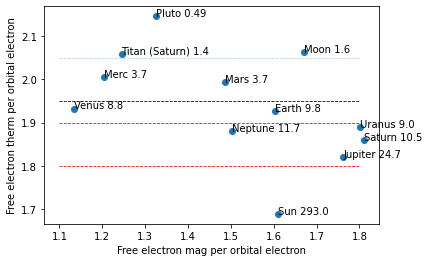

In [ ]:
n = 12

z = np.log(e_orb[0:n].astype('float64'))

y = (n_freeMG[0:n])
y[y==0]=1E30
y = np.log(y.astype('float64'))

y2 = ((n_freeTH[0:n]))
y2 = np.log(y2.astype('float64'))

# Plots
plt.scatter(y/z,y2/z);

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (y[i]/z[i], y2[i]/z[i]))

plt.xlabel('Free electron mag per orbital electron')
plt.ylabel('Free electron therm per orbital electron')

# Atmosphere zone (blue dash)
plt.plot(np.linspace(1.1,1.8,10),2.05*np.ones(10),'--', color = 'lightblue', linewidth = 0.8)
plt.plot(np.linspace(1.1,1.8,10),1.95*np.ones(10),'--', color = 'k', linewidth = 0.8)
plt.plot(np.linspace(1.1,1.8,10),1.9*np.ones(10),'--', color = 'g', linewidth = 0.8)
plt.plot(np.linspace(1.1,1.8,10),1.8*np.ones(10),'--', color = 'r', linewidth = 0.8)

# Finding gravity equation

[1.146788477105219e+25 4.8217242787378525e+24 4.3297115869196697e+24
 1.1467884771050278e+25 1.6878997839779614e+24 3.890334394259824e+24
 4.696984808851977e+24 3.6265960385957987e+24 8.659423194467981e+25
 1.445098587209491e+23 2.6192082490467523e+25 3.138400418113395e+25]
[3.7, 8.8, 9.8, 3.7, 24.7, 10.5, 9.0, 11.7, 0.49, 293, 1.6, 1.4]


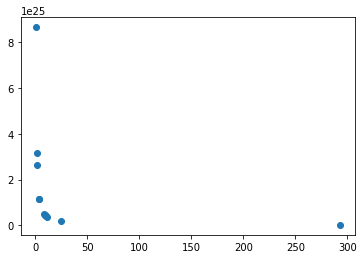

In [ ]:
print((n_freeTH[0:n])/(e_orb[0:n].astype('float64')))
planet
ag = [3.7,8.8,9.8,3.7,24.7,10.5,9.0,11.7,0.49,293,1.6,1.4]
print(ag)

plt.scatter(ag,(n_freeTH[0:n])/(e_orb[0:n].astype('float64')))

In [ ]:
# Finding out the constant

k = ag*(n_freeTH[0:n])/(e_orb[0:n].astype('float64'))
k = np.mean(k)
k

4.229882227851452e+25

[1.146788477105219e+25 4.8217242787378525e+24 4.3297115869196697e+24
 1.1467884771050278e+25 1.6878997839779614e+24 3.890334394259824e+24
 4.696984808851977e+24 3.6265960385957987e+24 8.659423194467981e+25
 1.445098587209491e+23 2.6192082490467523e+25 3.138400418113395e+25]
[3.7, 8.8, 9.8, 3.7, 24.7, 10.5, 9.0, 11.7, 0.49, 293, 1.6, 1.4]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.


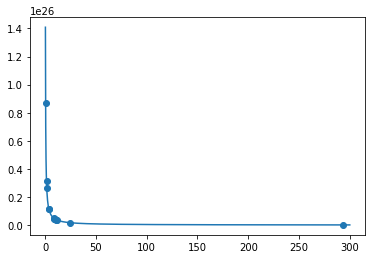

In [ ]:
print((n_freeTH[0:n])/(e_orb[0:n].astype('float64')))
planet
ag = [3.7,8.8,9.8,3.7,24.7,10.5,9.0,11.7,0.49,293,1.6,1.4]
print(ag)

plt.scatter(ag,(n_freeTH[0:n])/(e_orb[0:n].astype('float64')))

x = np.linspace(0,300,1000)

y = k/x

plt.plot(x,y)

# Testing gravity equation

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  


Text(0, 0.5, 'Acceleration due to gravity')

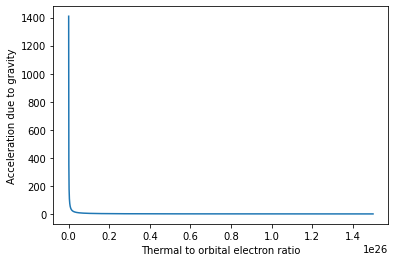

In [ ]:
x = np.linspace(0,1.5E26,5000)
ag = k/x
plt.plot(x,ag);

plt.xlabel('Thermal to orbital electron ratio')
plt.ylabel('Acceleration due to gravity')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.


Text(0.5, 0, 'Acceleration due to gravity')

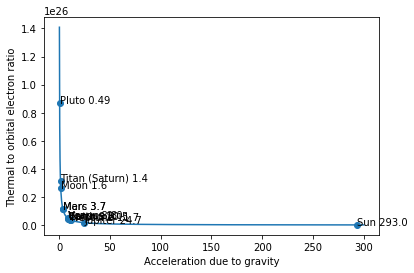

In [ ]:
# Finding out the constant

k = ag[0:n]*(n_freeTH[0:n])/(e_orb[0:n].astype('float64'))
k = np.mean(k)
ag = [3.7,8.8,9.8,3.7,24.7,10.5,9.0,11.7,0.49,293,1.6,1.4]

plt.scatter(ag[0:n],(n_freeTH[0:n])/(e_orb[0:n].astype('float64')));

x = np.linspace(0,300,1000)
y = k/x

plt.plot(x,y);

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (ag[i], (n_freeTH[i])/(e_orb[i])))

plt.ylabel('Thermal to orbital electron ratio')
plt.xlabel('Acceleration due to gravity')

4.229882227851452e+25

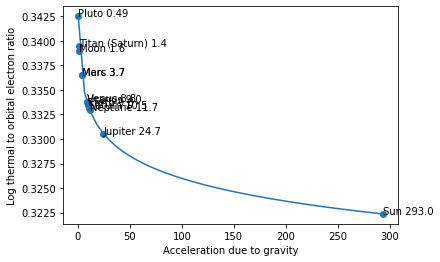

In [ ]:
# Finding out the constant
n = 12

ratio = (n_freeTH[0:n])/(e_orb[0:n].astype('float64'))

ag = [3.7,8.8,9.8,3.7,24.7,10.5,9.0,11.7,0.49,293,1.6,1.4][0:n]

plt.scatter(ag,np.log(np.log(np.log(np.log(ratio.astype(float))))));

x = np.linspace(min(ag),max(ag))  # 2E9 for neutron star
k = ag*ratio
k = np.mean(k)
y = k/x

plt.plot(x,np.log(np.log(np.log(np.log(y)))));

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (ag[i], np.log(np.log(np.log(np.log((n_freeTH[i])/(e_orb[i])))))))

plt.ylabel('Log thermal to orbital electron ratio')
plt.xlabel('Acceleration due to gravity')

k

4.251305619878133e+25

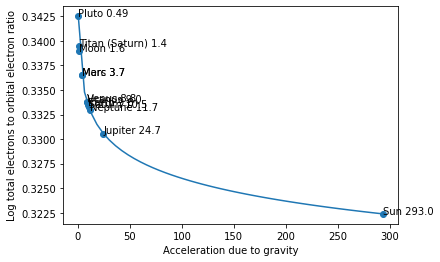

In [ ]:
# Finding out the constant
n = 12

ratio = (n_free[0:n])/(e_orb[0:n].astype('float64'))

ag = [3.7,8.8,9.8,3.7,24.7,10.5,9.0,11.7,0.49,293,1.6,1.4][0:n]

plt.scatter(ag,np.log(np.log(np.log(np.log(ratio.astype(float))))));

x = np.linspace(min(ag),max(ag))  # 2E9 for neutron star
k = ag*ratio
k = np.mean(k)
y = k/x

plt.plot(x,np.log(np.log(np.log(np.log(y)))));

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (ag[i], np.log(np.log(np.log(np.log((n_free[i])/(e_orb[i])))))))

plt.ylabel('Log total electrons to orbital electron ratio')
plt.xlabel('Acceleration due to gravity')

k

4.251305619878133e+25

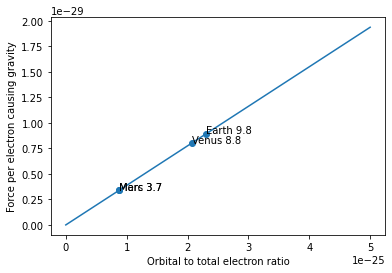

In [ ]:
n = 4

z = (e_orb[0:n].astype('float64'))

y = (n_freeMG[0:n])
y[y==0]=1E30
y = (y.astype('float64'))

y2 = ((n_free[0:n]))
y2 = (y2.astype('float64'))

plt.scatter(z/y2,9.10938356E-31*k*(z/y2))

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (z[i]/y2[i], 9.10938356E-31*k*(z[i]/y2[i])))

x = np.linspace(0,np.sqrt(1/n)*1E-24,5000)
F = 9.10938356E-31*k*x

plt.plot(x,F);

plt.xlabel('Orbital to total electron ratio')
plt.ylabel('Force per electron causing gravity')

k

4.229882227851452e+25

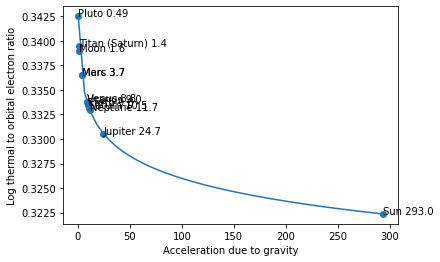

In [ ]:
# Finding out the constant
n = 12

ratio = (n_freeTH[0:n])/(e_orb[0:n].astype('float64'))

ag = [3.7,8.8,9.8,3.7,24.7,10.5,9.0,11.7,0.49,293,1.6,1.4][0:n]

plt.scatter(ag,np.log(np.log(np.log(np.log(ratio.astype(float))))));

x = np.linspace(min(ag),max(ag))  # 2E9 for neutron star
k = ag*ratio
k = np.mean(k)
y = k/x

plt.plot(x,np.log(np.log(np.log(np.log(y)))));

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (ag[i], np.log(np.log(np.log(np.log((n_freeTH[i])/(e_orb[i])))))))

plt.ylabel('Log thermal to orbital electron ratio')
plt.xlabel('Acceleration due to gravity')

k

Text(0, 0.5, 'Force due to gravity')

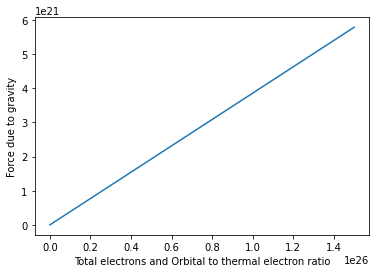

In [ ]:
x = np.linspace(0,1.5E26,5000)
F = 9.10938356E-31*k*x

plt.plot(x,F);

plt.xlabel('Total electrons and Orbital to thermal electron ratio')
plt.ylabel('Force due to gravity')

Text(0, 0.5, 'Force per electron causing gravity')

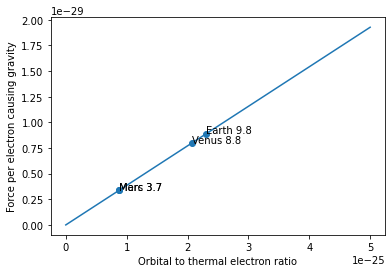

In [ ]:
n = 4

z = (e_orb[0:n].astype('float64'))

y = (n_freeMG[0:n])
y[y==0]=1E30
y = (y.astype('float64'))

y2 = ((n_freeTH[0:n]))
y2 = (y2.astype('float64'))

plt.scatter(z/y2,9.10938356E-31*k*(z/y2))

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (z[i]/y2[i], 9.10938356E-31*k*(z[i]/y2[i])))

x = np.linspace(0,np.sqrt(1/n)*1E-24,5000)
F = 9.10938356E-31*k*x

plt.plot(x,F);

plt.xlabel('Orbital to thermal electron ratio')
plt.ylabel('Force per electron causing gravity')

6.837574728687181e+20

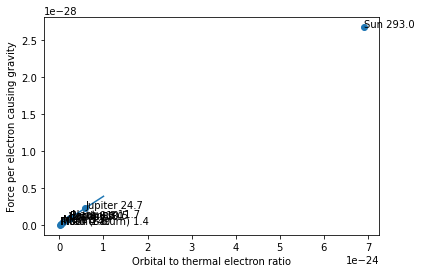

In [ ]:
n = 12

z = (e_orb[0:n].astype('float64'))

y = (n_freeMG[0:n])
y[y==0]=1E30
y = (y.astype('float64'))

y2 = ((n_free[0:n]))
y2 = (y2.astype('float64'))

plt.scatter(z/y2,9.10938356E-31*k*(z/y2))

for i, txt in enumerate(planet[0:n]):
    plt.annotate(txt, (z[i]/y2[i], 9.10938356E-31*k*(z[i]/y2[i])))

x = np.linspace(0,1E-24,5000)
F = 9.10938356E-31*k*x

plt.plot(x,F);

plt.xlabel('Orbital to thermal electron ratio')
plt.ylabel('Force per electron causing gravity')

E = 9.10938356E-31*k*(z[3]/y2[3])*eT[3]  # gravitational potential force of Earth based on number of electrons

S = 9.10938356E-31*k*(z[11]/y2[11])*eT[11]  # gravitational potential force of Sun based on number of electrons

E+S


# 3.54E22 force between Sun and Earth

[3.7, 8.8, 9.8, 3.7, 24.7, 10.5, 9.0, 11.7, 0.49, 293, 1.6, 1.4]


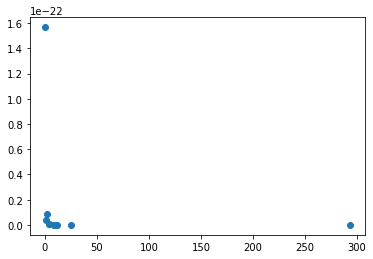

In [ ]:
# Gravity equation with temperature
n= 12

planet
ag = [3.7,8.8,9.8,3.7,24.7,10.5,9.0,11.7,0.49,293,1.6,1.4]
print(ag)

plt.scatter(ag[0:n],np.log(Tcore[0:n])/(e_orb[0:n].astype('float64')))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in true_divide
  import sys


2.7369744361992645e-23

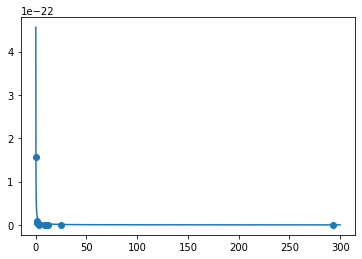

In [ ]:
# Finding out the constant using core temp

k = (np.log(Tcore[0:n])/(e_orb[0:n].astype('float64')))/ag[0:n]
k = np.mean(k)

x = np.linspace(0,300,5000)
y = k/x  # where y is temp/orbital, x is gravity at surface


plt.scatter(ag[0:n],np.log(Tcore[0:n])/(e_orb[0:n].astype('float64')))
plt.plot(x,y)

k

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in true_divide
  import sys


1.5045266191619937e-23

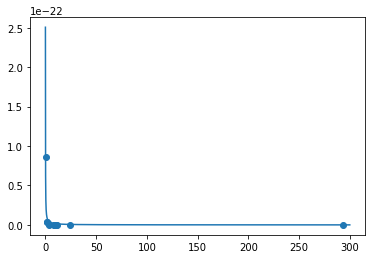

In [ ]:
# Finding out the constant using surface temp

k = (np.log(Temp[0:n])/(e_orb[0:n].astype('float64')))/ag[0:n]
k = np.mean(k)

x = np.linspace(0,300,5000)
y = k/x  # where y is temp/orbital, x is gravity at surface


plt.scatter(ag[0:n],np.log(Temp[0:n])/(e_orb[0:n].astype('float64')))
plt.plot(x,y)

k

# Wave mathematics

## 2D

(-100.0, 100.0)

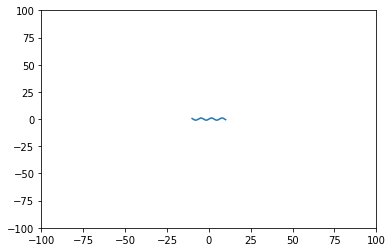

In [ ]:
A = 1
f = 1
xL = 10

x = np.linspace(-xL,xL,1000)
y = A*np.sin(f*x)
plt.plot(x,y)

plt.xlim(-100,100)
plt.ylim(-100,100)

(-100.0, 100.0)

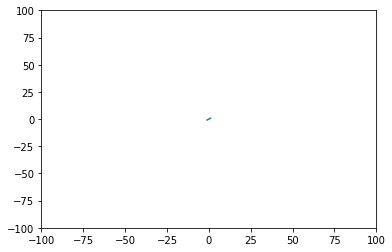

In [ ]:
A = 1
f = 1
xL = 1

x = np.linspace(-xL,xL,1000)
y = A*np.sin(f*x)
plt.plot(x,y)

plt.xlim(-100,100)
plt.ylim(-100,100)

(-100.0, 100.0)

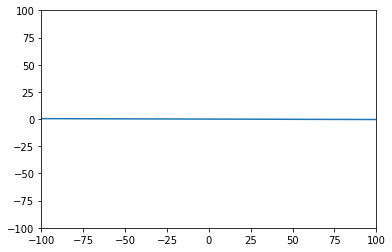

In [ ]:
A = 1
f = 1
xL = 100000

x = np.linspace(-xL,xL,1000)
y = A*np.sin(f*x)
plt.plot(x,y)

plt.xlim(-100,100)
plt.ylim(-100,100)

(-100.0, 100.0)

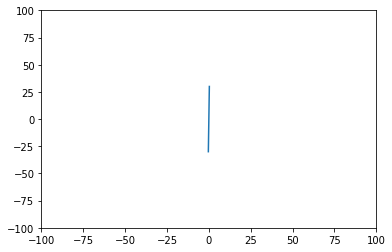

In [ ]:
A = 10000
f = 0.01
xL = 0.3

x = np.linspace(-xL,xL,1000)
y = A*np.sin(f*x)
plt.plot(x,y)

plt.xlim(-100,100)
plt.ylim(-100,100)

(-100.0, 100.0)

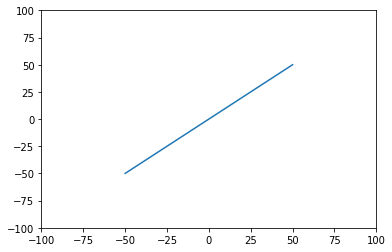

In [ ]:
A = 1000
f = 0.001
xL = 50

x = np.linspace(-xL,xL,1000)
y = A*np.sin(f*x)
plt.plot(x,y)

plt.xlim(-100,100)
plt.ylim(-100,100)

(-100.0, 100.0)

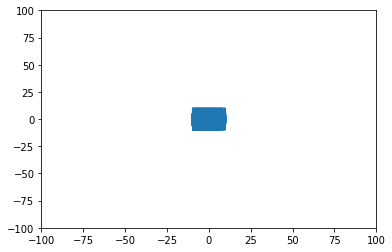

In [ ]:
A = 10
f = 100000000
xL = 10

x = np.linspace(-xL,xL,1000)
y = A*np.sin(f*x)
plt.plot(x,y)

plt.xlim(-100,100)
plt.ylim(-100,100)

(-100.0, 100.0)

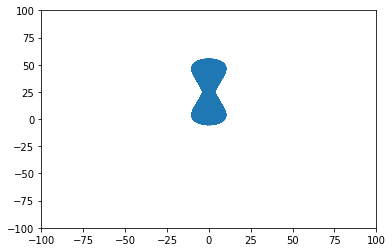

In [ ]:
A = 10
f = 100000000
xL = 10

u = np.linspace(-xL,xL,1000)-25

x = 10*np.sin(f*u)
y = 30*np.sin(0.5*f*u)+25
plt.plot(x,y)

plt.xlim(-100,100)
plt.ylim(-100,100)

(-100.0, 100.0)

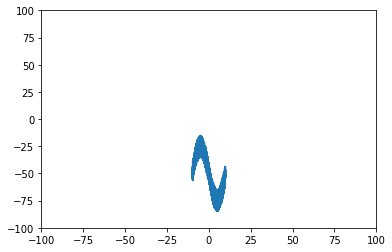

In [ ]:
A = 10
f = 100000000
xL = 10

x = np.linspace(-xL,xL,1000)
y = A*np.sin(f*x)+25*np.sin(np.pi*f*x)-50
plt.plot(x,y)

plt.xlim(-100,100)
plt.ylim(-100,100)

(-100.0, 100.0)

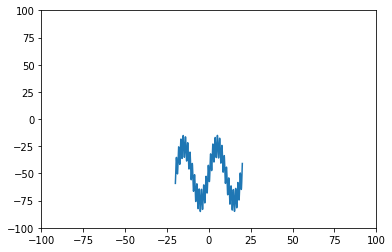

In [ ]:
A = 10
f = 100000000
xL = 20

x = np.linspace(-xL,xL,1000)
y = A*np.sin(f*x)+25*np.sin(np.pi*f*x)-50
plt.plot(x,y)

plt.xlim(-100,100)
plt.ylim(-100,100)

## 3D

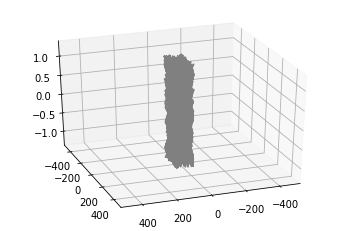

In [ ]:
A = 10
f = 1000000000
xL = 10

x = np.linspace(-xL,xL,1000)

ax = plt.axes(projection='3d')

# Data for a three-dimensional line
zline = 2/15*A*np.sin(100*f*x)
xline = 5*A*np.sin(0.1*f*x)
yline = 10*A*np.sin(f*(100*A*np.sin(f*x)))
ax.plot3D(xline, yline, zline, 'gray')

plt.xlim(-500,500)
plt.ylim(-500,500)


ax.view_init(30, 70)


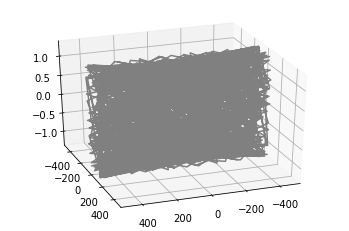

In [ ]:
A = 10
f = 100
xL = 10

x = np.linspace(-xL,xL,1000)

ax = plt.axes(projection='3d')

# Data for a three-dimensional line
zline = 2/15*A*np.sin(100*f*x)
xline = 50*A*np.sin(20*f*(100*A*np.sin(0.02*f*x)))
yline = 10*A*np.sin(0.02*f*(100*A*np.sin(0.02*f*x)))
ax.plot3D(xline, yline, zline, 'gray')


#x = 10*np.sin(f*u)
#y = 30*np.sin(0.5*f*u)+25

plt.xlim(-500,500)
plt.ylim(-500,500)


ax.view_init(30, 70)

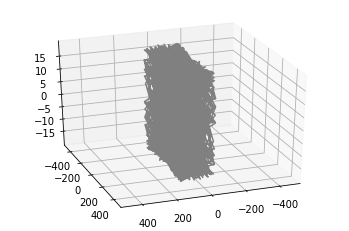

In [ ]:
A = 10
f = 100
xL = 10

x = np.linspace(-xL,xL,1000)

ax = plt.axes(projection='3d')

# Data for a three-dimensional line
zline = 2*A*np.sin(100*f*x)
xline = 10*A*np.sin(20*f*(100*A*np.sin(0.02*f*x)))
yline = 30*A*np.sin(0.02*f*(100*A*np.sin(0.02*f*x)))
ax.plot3D(xline, yline, zline, 'gray')


#x = 10*np.sin(f*u)
#y = 30*np.sin(0.5*f*u)+25

plt.xlim(-500,500)
plt.ylim(-500,500)


ax.view_init(30, 70)

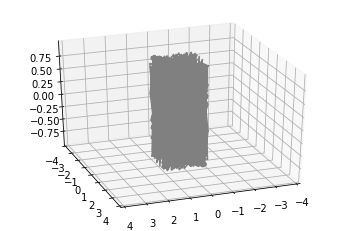

In [ ]:
# 1x1x1 cube
A = 1
f = 10
xL = 10

x = np.linspace(-xL,xL,1000)

ax = plt.axes(projection='3d')

# Data for a three-dimensional line
zline = A*np.sin(100*f*x)
xline = A*np.sin(20*f*(100*A*np.sin(0.02*f*x)))
yline = A*np.sin(0.02*f*(100*A*np.sin(0.02*f*x)))
ax.plot3D(xline, yline, zline, 'gray')


#x = 10*np.sin(f*u)
#y = 30*np.sin(0.5*f*u)+25

plt.xlim(-4*A,4*A)
plt.ylim(-4*A,4*A)


ax.view_init(30, 70)

## Cuboid

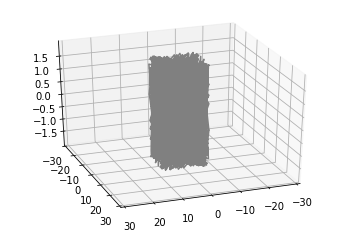

In [ ]:
# 8x7x2 cube
Ax = 8
Ay = 7
Az = 2

f = 10
xL = 10

x = np.linspace(-xL,xL,1000)

ax = plt.axes(projection='3d')

# Data for a three-dimensional line
zline = Az*np.sin(100*f*x)
xline = Ax*np.sin(20*f*(100*A*np.sin(0.02*f*x)))
yline = Ay*np.sin(0.02*f*(100*A*np.sin(0.02*f*x)))
ax.plot3D(xline, yline, zline, 'gray')

plt.xlim(-2*(Ax+Ay),2*(Ax+Ay))
plt.ylim(-2*(Ax+Ay),2*(Ax+Ay))


ax.view_init(30, 70)

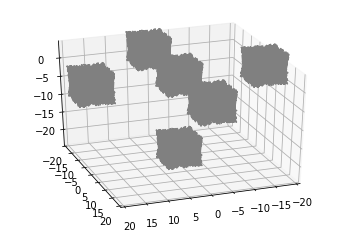

In [ ]:
A = 10

Ax = 1
Ay = 1
Az = 1

f = 1000000000
xL = 10

s = 2 # size of cubes
n = 4 # number of cubes

x = np.linspace(-xL,xL,1000)

ax = plt.axes(projection='3d')

# Data for a three-dimensional line
xline = Ax*np.sin(20*f*(100*A*np.sin(0.02*f*x)))*n
yline = Ay*np.sin(0.02*f*(100*A*np.sin(0.02*f*x)))*n
zline = Az*np.sin(100*f*x)*n
ax.plot3D(xline, yline, zline, 'gray')

# Data for a three-dimensional line
xline = Ax*np.sin(20*f*(100*A*np.sin(0.02*f*x)))*n
yline = Ay*np.sin(0.02*f*(100*A*np.sin(0.02*f*x)))*n
zline = Az*np.sin(100*f*x)*n-20
ax.plot3D(xline, yline, zline, 'gray')

# Data for a three-dimensional line
xline = Ax*np.sin(20*f*(100*A*np.sin(0.02*f*x)))*n-20
yline = Ay*np.sin(0.02*f*(100*A*np.sin(0.02*f*x)))*n
zline = Az*np.sin(100*f*x)*n
ax.plot3D(xline, yline, zline, 'gray')

# Data for a three-dimensional line
xline = Ax*np.sin(20*f*(100*A*np.sin(0.02*f*x)))*n 
yline = Ay*np.sin(0.02*f*(100*A*np.sin(0.02*f*x)))*n -20
zline = Az*np.sin(100*f*x)*n
ax.plot3D(xline, yline, zline, 'gray')

# Data for a three-dimensional line
xline = Ax*np.sin(20*f*(100*A*np.sin(0.02*f*x)))*n +20
yline = Ay*np.sin(0.02*f*(100*A*np.sin(0.02*f*x)))*n
zline = Az*np.sin(100*f*x)*n
ax.plot3D(xline, yline, zline, 'gray')

# Data for a three-dimensional line
xline = Ax*np.sin(20*f*(100*A*np.sin(0.02*f*x)))*n 
yline = Ay*np.sin(0.02*f*(100*A*np.sin(0.02*f*x)))*n +20
zline = Az*np.sin(100*f*x)*n
ax.plot3D(xline, yline, zline, 'gray')


plt.xlim(-10*(Ax+Ay),10*(Ax+Ay))
plt.ylim(-10*(Ax+Ay),10*(Ax+Ay))


ax.view_init(30, 70)

## Spiky cube

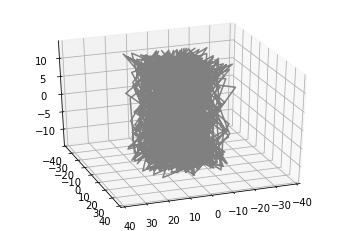

In [ ]:
# 8x7x2 cube
Ax = 10
Ay = 10
Az = 10

f = 10
xL = 10

x = np.linspace(-xL,xL,1000)

ax = plt.axes(projection='3d')

# Data for a three-dimensional line
xline = (Ax*np.sin(20*f*(100*A*np.sin(0.02*f*x))))+(Ax*np.sin(20*f*(100*A*np.cos(0.02*f*x))))
yline = (Ay*np.sin(0.02*f*(100*A*np.sin(0.02*f*x))))+(Ay*np.sin(0.02*f*(100*A*np.cos(0.02*f*x))))
zline = (Az*np.sin(100*f*x))+(Az*np.cos(100*f*x))
ax.plot3D(xline, yline, zline, 'gray')

plt.xlim(-2*(Ax+Ay),2*(Ax+Ay))
plt.ylim(-2*(Ax+Ay),2*(Ax+Ay))


ax.view_init(30, 70)

## Mobius strip

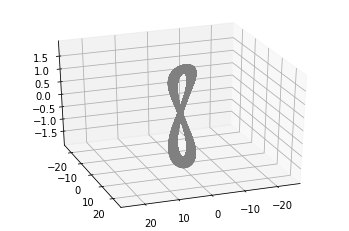

In [ ]:
# 8x7x2 cube
Ax = 8
Ay = 5
Az = 2

f = 10000
xL = 1

x = np.linspace(-xL,xL,1000)
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
xline = Ax*np.cos(f*x)*np.sin(f*x)
yline = Ay*np.sin(f*x)*np.sin(f*x)
zline = Az*np.sin(f*x)
ax.plot3D(xline, yline, zline, 'gray')

plt.xlim(-2*(Ax+Ay),2*(Ax+Ay))
plt.ylim(-2*(Ax+Ay),2*(Ax+Ay))


ax.view_init(30, 70)

## Smoother wall

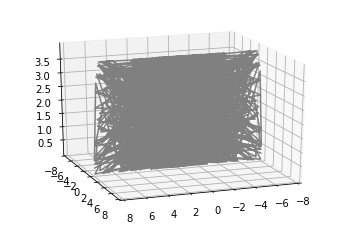

In [ ]:
# 8x7x2 
Ax = 4
Ay = 0.01
Az = 4

f = 100000
xL = 1

x = np.linspace(-xL,xL,1000)
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
xline = Ax*np.sin(f*np.sin(f*x))*np.cos(f*np.cos(f*x))+Ax*np.sin(f*np.sin(f*x))*np.cos(f*np.cos(f*x))
yline = Ay*np.cos(f*Ay*np.cos(f*x))+Ay*np.cos(f*Ay*np.cos(f*x))
zline = Az*np.sin(f*Az*np.sin(f*x))*np.sin(f*Az*np.sin(f*x))
ax.plot3D(xline, yline, zline, 'gray')

plt.xlim(-2*(Ax+Ay),2*(Ax+Ay))
plt.ylim(-2*(Ax+Ay),2*(Ax+Ay))


ax.view_init(20, 70)

## Sphere

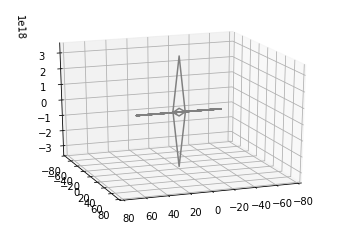

In [ ]:
# 8x7x2 
Ax = 40
Ay = 0.00001
Az = 10

f = 100000
xL = 1

x = np.linspace(-xL,xL,1000)
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
xline = Ax*np.sin(f*x)**7
yline = Ay*np.cos(f*x)**7
zline = Az*np.sin(f*x)**-7
ax.plot3D(xline, yline, zline, 'gray')

plt.xlim(-2*(Ax+Ay),2*(Ax+Ay))
plt.ylim(-2*(Ax+Ay),2*(Ax+Ay))


ax.view_init(20, 70)

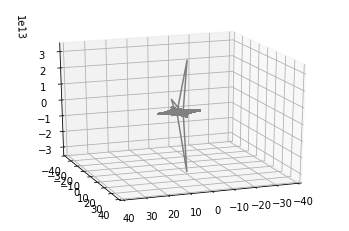

In [ ]:
# 8x7x2 
Ax = 10
Ay = 10
Az = 10

f = 100000
xL = 1

x = np.linspace(-xL,xL,1000)
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
xline = Ax*np.sin(f*x)**7
yline = Ay*np.cos(f*x)**5
zline = Az*np.sin(f*x)**-5
ax.plot3D(xline, yline, zline, 'gray')

plt.xlim(-2*(Ax+Ay),2*(Ax+Ay))
plt.ylim(-2*(Ax+Ay),2*(Ax+Ay))


ax.view_init(20, 70)

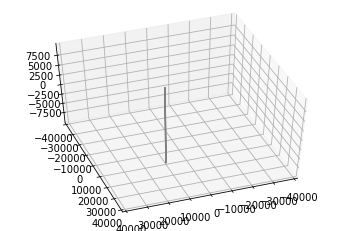

In [ ]:
# 8x7x2 
Ax = 10000
Ay = 10000
Az = 10000

f = 10000000
xL = 100

x = np.linspace(-xL,xL,1000)
ax = plt.axes(projection='3d')

#532 #53-2 #534 #234 #834 #531,542
# Data for a three-dimensional line
xline = Ax*np.sin(f*x)**2+Ax*np.cos(f*x)**2
yline = Ay*np.cos(f*x)**2+Ax*np.sin(f*x)**2
zline = Az*np.cos(f*x)**5+Ax*np.sin(f*x)**2
ax.plot3D(xline, yline, zline, 'gray')

plt.xlim(-2*(Ax+Ay),2*(Ax+Ay))
plt.ylim(-2*(Ax+Ay),2*(Ax+Ay))


ax.view_init(50, 70)

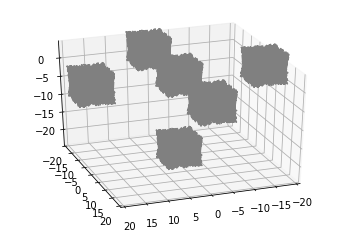

In [ ]:
A = 10

Ax = 1
Ay = 1
Az = 1

f = 1000000000
xL = 10

s = 2 # size of cubes
n = 4 # number of cubes

x = np.linspace(-xL,xL,1000)

ax = plt.axes(projection='3d')

# Data for a three-dimensional line
xline = Ax*np.sin(20*f*(100*A*np.sin(0.02*f*x)))*n
yline = Ay*np.sin(0.02*f*(100*A*np.sin(0.02*f*x)))*n
zline = Az*np.sin(100*f*x)*n
ax.plot3D(xline, yline, zline, 'gray')

# Data for a three-dimensional line
xline = Ax*np.sin(20*f*(100*A*np.sin(0.02*f*x)))*n
yline = Ay*np.sin(0.02*f*(100*A*np.sin(0.02*f*x)))*n
zline = Az*np.sin(100*f*x)*n-20
ax.plot3D(xline, yline, zline, 'gray')

# Data for a three-dimensional line
xline = Ax*np.sin(20*f*(100*A*np.sin(0.02*f*x)))*n-20
yline = Ay*np.sin(0.02*f*(100*A*np.sin(0.02*f*x)))*n
zline = Az*np.sin(100*f*x)*n
ax.plot3D(xline, yline, zline, 'gray')

# Data for a three-dimensional line
xline = Ax*np.sin(20*f*(100*A*np.sin(0.02*f*x)))*n 
yline = Ay*np.sin(0.02*f*(100*A*np.sin(0.02*f*x)))*n -20
zline = Az*np.sin(100*f*x)*n
ax.plot3D(xline, yline, zline, 'gray')

# Data for a three-dimensional line
xline = Ax*np.sin(20*f*(100*A*np.sin(0.02*f*x)))*n +20
yline = Ay*np.sin(0.02*f*(100*A*np.sin(0.02*f*x)))*n
zline = Az*np.sin(100*f*x)*n
ax.plot3D(xline, yline, zline, 'gray')

# Data for a three-dimensional line
xline = Ax*np.sin(20*f*(100*A*np.sin(0.02*f*x)))*n 
yline = Ay*np.sin(0.02*f*(100*A*np.sin(0.02*f*x)))*n +20
zline = Az*np.sin(100*f*x)*n
ax.plot3D(xline, yline, zline, 'gray')


plt.xlim(-10*(Ax+Ay),10*(Ax+Ay))
plt.ylim(-10*(Ax+Ay),10*(Ax+Ay))


ax.view_init(30, 70)

# Using wave mathematics to model a planet

In [ ]:
def model_cube(X,Y,Z, ef,space, position):
  xline = X*np.sin(20*ef*(1000*np.sin(0.02*ef*space)))*n + position[0]
  yline = Y*np.sin((0.5)*ef*(1000*np.sin(0.02*ef*space)))*n + position[1]
  zline = Z*np.sin(0.01*ef*space)*n + position[2]
  ax.plot3D(xline, yline, zline, 'gray')

def model_planet(X,Y,Z,type,space,position):
  orbital_cube = model_cube(X,Y,Z,e_orb[type],space,position)
  thermal_cube = model_cube(X,Y,Z,n_freeTH[type],space,position)
  magnetic_cube = model_cube(X,Y,Z,n_freeMG[type],space,position)
  return orbital_cube,thermal_cube, magnetic_cube

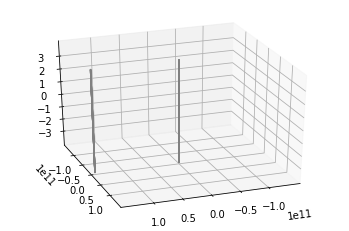

In [ ]:
s = 1 # Amp of waves (eV of electron waves)

Ax = 1*s
Ay = 1*s
Az = 1*s

f = 1000000000
xL = 10
n = 4 # size of cubes

x = np.linspace(-xL,xL,1000)
ax = plt.axes(projection='3d')

# Sun
sun = 9

# Earth
d = 1.496E11  # 1AU
earth = 2

orbital1, thermal1, magnetic1 = model_planet(Ax,Ay,Az,sun,x,[0,0,0])
orbital2, thermal2, magnetic2 = model_planet(Ax,Ay,Az,earth,x,[d,0,0])

plt.xlim(-10*(Ax+Ay)-d,10*(Ax+Ay)+d)
plt.ylim(-10*(Ax+Ay)-d,10*(Ax+Ay)+d)
ax.view_init(30, 70)

In [ ]:
# Gravitational Force between the planets

# This theory suggests that it's only based on orbital electrons and electrostatic force (perhaps convolution of electrostatic force)

e_orb[sun]
e_orb[earth]

# Electrostatic forces within planet F = kq1q2/r**2
k = 8.98755E9
FE = k*(1.6E-19*e_orb[earth])/((6371E3)**2)
FS =k*(1.6E-19*e_orb[sun])/((696340E3)**2)
FE+FS
#exp 3.557E22

11946909.2128296

# Ring mathematics

## Install pyvista

In [ ]:
pip install pyvista

     |████████████████████████████████| 1.4 MB 10.4 MB/s 
     |████████████████████████████████| 88.3 MB 90 kB/s 
     |████████████████████████████████| 1.1 MB 21.9 MB/s 
     |████████████████████████████████| 94 kB 2.5 MB/s 
     |████████████████████████████████| 271 kB 16.8 MB/s 
     |████████████████████████████████| 144 kB 11.3 MB/s 


In [ ]:
import pyvista as pv

# setup enviornment for interactive plotting
!apt-get install -qq xvfb
!pip install pyvista panel -q

import os
os.system('/usr/bin/Xvfb :99 -screen 0 1024x768x24 &')
os.environ['DISPLAY'] = ':99'

import panel as pn
pn.extension('vtk')

# ### new cell spline example cell ###
# pn.extension('vtk')  # this needs to be at the top of each cell for some reason

Selecting previously unselected package xvfb.
(Reading database ... 155113 files and directories currently installed.)
Preparing to unpack .../xvfb_2%3a1.19.6-1ubuntu4.10_amd64.deb ...
Unpacking xvfb (2:1.19.6-1ubuntu4.10) ...
Setting up xvfb (2:1.19.6-1ubuntu4.10) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...


## 2D

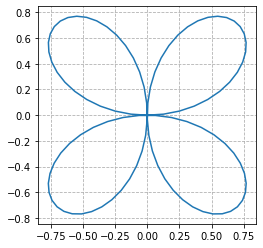

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

theta = np.linspace(0, 2*np.pi, 100)

r = np.sin(2*theta)

x1 = r*np.cos(theta)
x2 = r*np.sin(theta)

fig, ax = plt.subplots(1)

ax.plot(x1, x2)
ax.set_aspect(1)


plt.grid(linestyle='--')

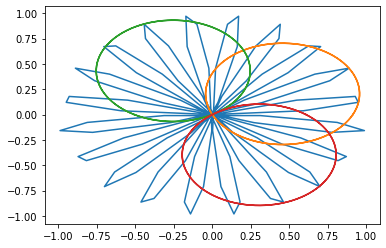

In [ ]:
theta = np.linspace(0, 2*np.pi, 100)

r = np.sin(10*theta)

x1 = r*np.cos(theta)
x2 = r*np.sin(theta)

plt.plot(x1, x2)


r = np.sin(theta+20)

x1 = r*np.cos(theta)
x2 = r*np.sin(theta)

plt.plot(x1, x2)


r = np.sin(theta+100)

x1 = r*np.cos(theta)
x2 = r*np.sin(theta)

plt.plot(x1, x2)


r = np.sin(theta+147)

x1 = r*np.cos(theta)
x2 = r*np.sin(theta)

plt.plot(x1, x2)

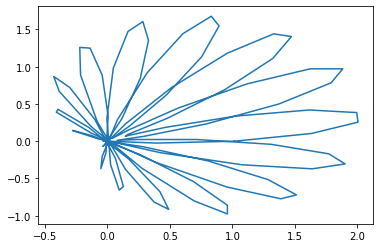

In [ ]:
theta = np.linspace(0, 2*np.pi, 100)

r = np.sin(10*theta)+np.sin(theta+20)+np.sin(theta+100)+np.sin(theta+147)

x1 = r*np.cos(theta)
x2 = r*np.sin(theta)

plt.plot(x1, x2)

### Discrete polar

14


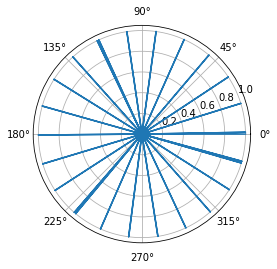

In [ ]:
print(sum([1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1]))
plt.polar([1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0]);

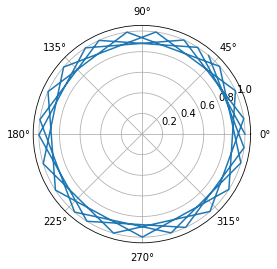

In [ ]:
plt.polar([1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1]);

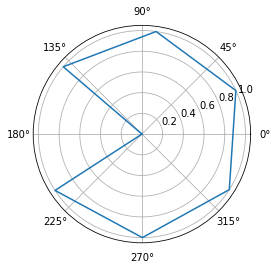

In [ ]:
plt.polar([0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]);

## 3D

In [ ]:
# setup enviornment for interactive plotting
!apt-get install -qq xvfb
!pip install pyvista panel -q

import os
os.system('/usr/bin/Xvfb :99 -screen 0 1024x768x24 &')
os.environ['DISPLAY'] = ':99'

import panel as pn
pn.extension('vtk')

# ### new cell spline example cell ###
# pn.extension('vtk')  # this needs to be at the top of each cell for some reason

# n_points = 100
# theta = np.linspace(-4 * np.pi, 4 * np.pi, n_points)
# z = np.linspace(-2, 2, n_points)
# r = z ** 2 + 1
# x = r * np.sin(theta)
# y = r * np.cos(theta)
# points = np.column_stack((x, y, z))

# # Create spline with 1000 interpolation points
# spline = pv.Spline(points, 1000)

# # add scalars to spline and plot it
# spline["scalars"] = np.arange(spline.n_points)
# tube = spline.tube(radius=0.1)
# tube.plot(smooth_shading=True, notebook=True)

## Proof sine in polar converges to circle

/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


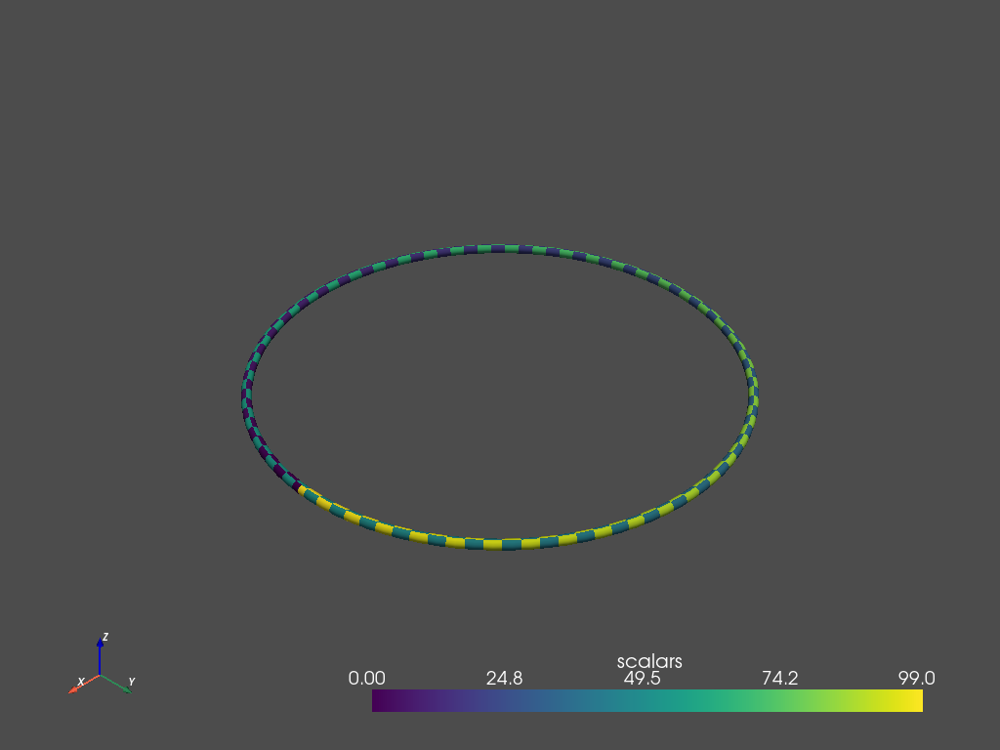

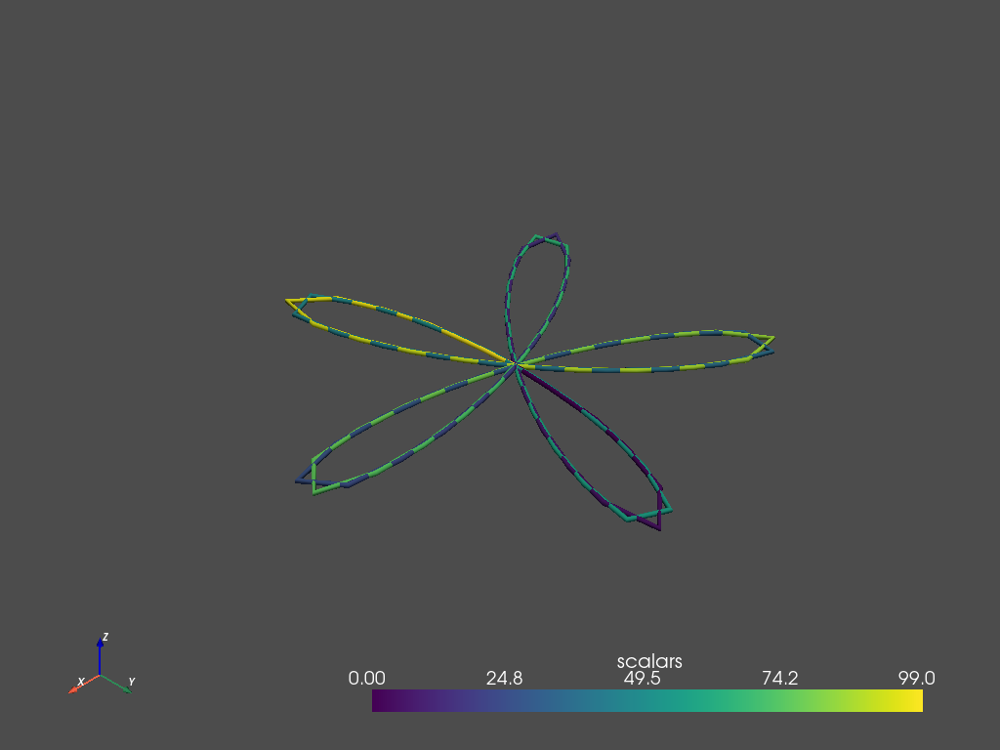

In [ ]:
# setup enviornment for interactive plotting

import os
os.system('/usr/bin/Xvfb :99 -screen 0 1024x768x24 &')
os.environ['DISPLAY'] = ':99'

import panel as pn
pn.extension('vtk')

### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = np.sin(100*theta)+np.sin(100*theta)
x = r * np.sin(theta)
y = r * np.cos(theta)
points = np.column_stack((x, y, z))

# Create spline with 1000 interpolation points
spline = pv.Spline(points, 100)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=0.02)
tube.plot(smooth_shading=True, notebook=True)


### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = np.sin(5*theta)+np.sin(5*theta)
x = r * np.sin(theta)
y = r * np.cos(theta)
points = np.column_stack((x, y, z))

# Create spline with 1000 interpolation points
spline = pv.Spline(points, 100)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=0.02)
tube.plot(smooth_shading=True, notebook=True)

## Two perpendicular force rings

/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


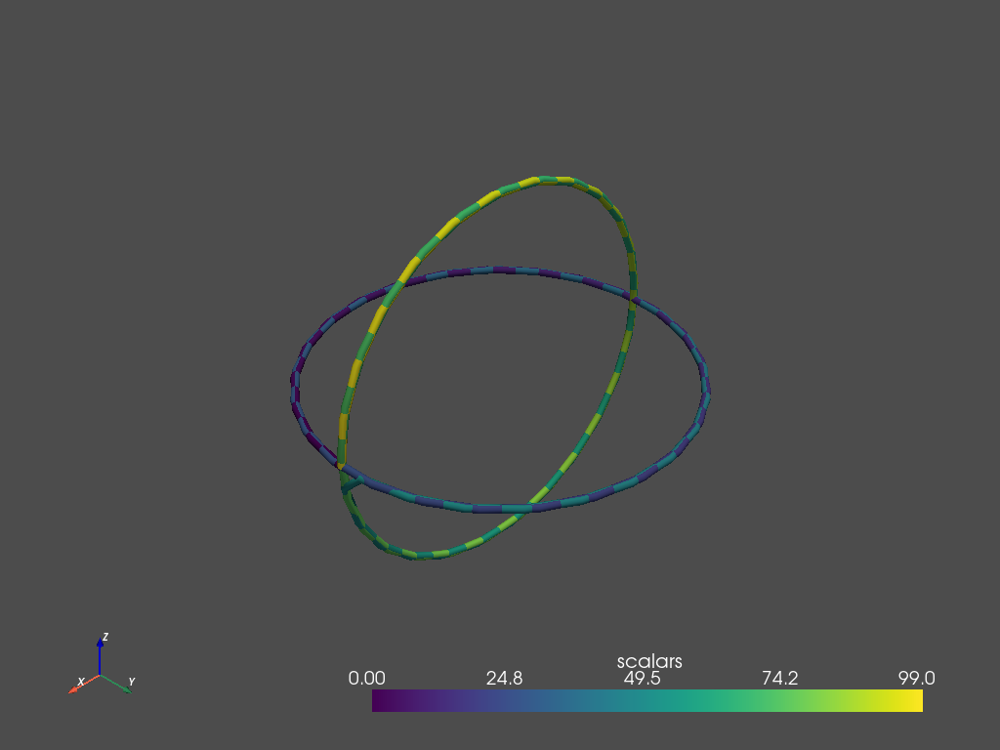

In [ ]:
# setup enviornment for interactive plotting

import os
os.system('/usr/bin/Xvfb :99 -screen 0 1024x768x24 &')
os.environ['DISPLAY'] = ':99'

import panel as pn
pn.extension('vtk')

### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

f = 100

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
x = r * np.sin(theta)
y = r * np.cos(theta)
points = np.column_stack((x, y, z))



theta = np.linspace(-np.pi, np.pi, n_points)
z = y 
r = r
x = x
y = np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))

# Create spline with 1000 interpolation points
spline = pv.Spline(points, 100)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=0.02)
tube.plot(smooth_shading=True, notebook=True);


## Quantum entanglement ?

/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


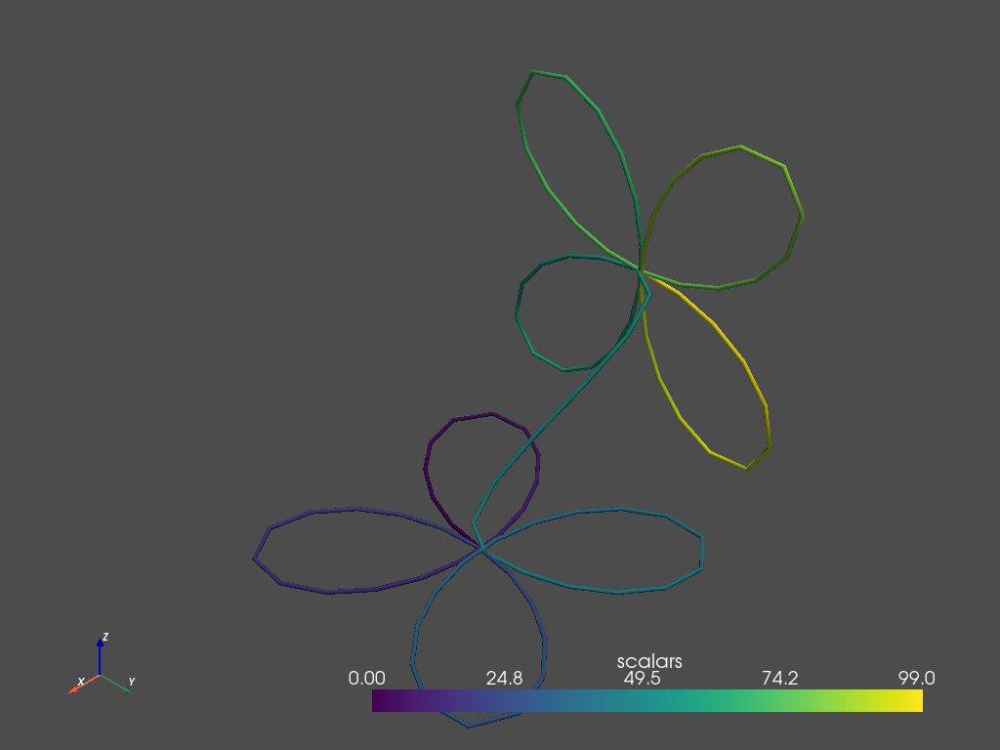

In [ ]:
# setup enviornment for interactive plotting

import os
os.system('/usr/bin/Xvfb :99 -screen 0 1024x768x24 &')
os.environ['DISPLAY'] = ':99'

import panel as pn
pn.extension('vtk')

### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

f = 2

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
x = r * np.sin(theta)
y = r * np.cos(theta)
points = np.column_stack((x, y, z))


theta = np.linspace(-np.pi, np.pi, n_points)
z = x 
r = r
x = np.linspace(0, 0, n_points)
y = y
points = np.concatenate((points,np.column_stack((x-f, y, z+f))))

# Create spline with 1000 interpolation points
spline = pv.Spline(points, 100)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=0.02)
tube.plot(smooth_shading=True, notebook=True);



# New coordinate system

/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


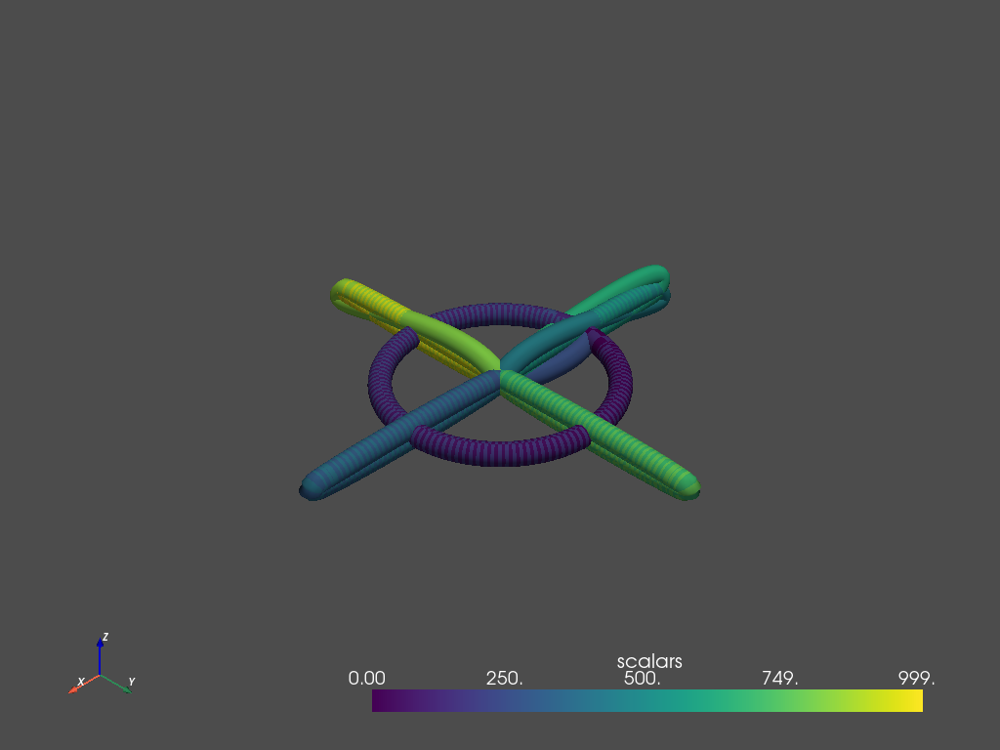

In [ ]:
# setup enviornment for interactive plotting

import os
os.system('/usr/bin/Xvfb :99 -screen 0 1024x768x24 &')
os.environ['DISPLAY'] = ':99'

import panel as pn
pn.extension('vtk')

### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

A = 20
f = 1

T = 1/f

# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
x = r * np.sin(theta)*A
y = r * np.cos(theta)*A
points = np.column_stack((x, y, z))


# Vertical rings 

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x+A, y, z))))

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x-A, y, z))))

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * np.linspace(0, 0, n_points)
y = A * r * np.sin(theta)
points = np.concatenate((points,np.column_stack((x+T-T*A*(A**-1-f), y-T-A-(A**-1-T)*T*A+2, z)))) # x+A+T-T*A

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * np.linspace(0, 0, n_points)
y = A * r * np.sin(theta)
points = np.concatenate((points,np.column_stack((x+T-T*A*(A**-1-f), y+T-A+(A**-1-T)*T*A-2, z)))) # x+A+T-T*A

# Create spline with 1000 interpolation points
spline = pv.Spline(points, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);



In [ ]:
# setup enviornment for interactive plotting

import os
os.system('/usr/bin/Xvfb :99 -screen 0 1024x768x24 &')
os.environ['DISPLAY'] = ':99'

import panel as pn
pn.extension('vtk')

/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


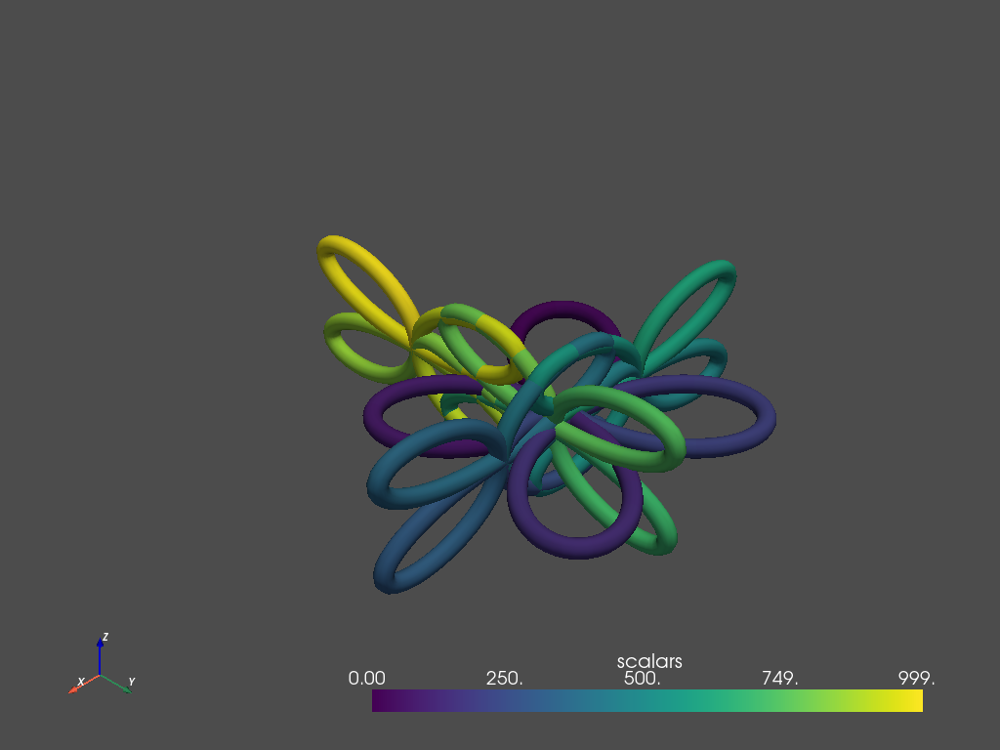

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

A = 2
f = 2

T = 1/f

# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
x = r * np.sin(theta)*A
y = r * np.cos(theta)*A
points = np.column_stack((x, y, z))


# Vertical rings 

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x+A, y, z))))

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x-A, y, z))))


# Vertical rotated by 90

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * np.linspace(0, 0, n_points)
y = A * r * np.sin(theta)
points = np.concatenate((points,np.column_stack((x+T-T*A*(A**-1-T), y-T-A-(A**-1-f)*T*A+2*T, z))))  # green

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * np.linspace(0, 0, n_points)
y = A * r * np.sin(theta)
points = np.concatenate((points,np.column_stack((x+T-T*A*(A**-1-T), y+T-A+(A**-1-f)*T*A-2*T, z))))  # yellow

# Create spline with 1000 interpolation points
spline = pv.Spline(points, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


## Final model

/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


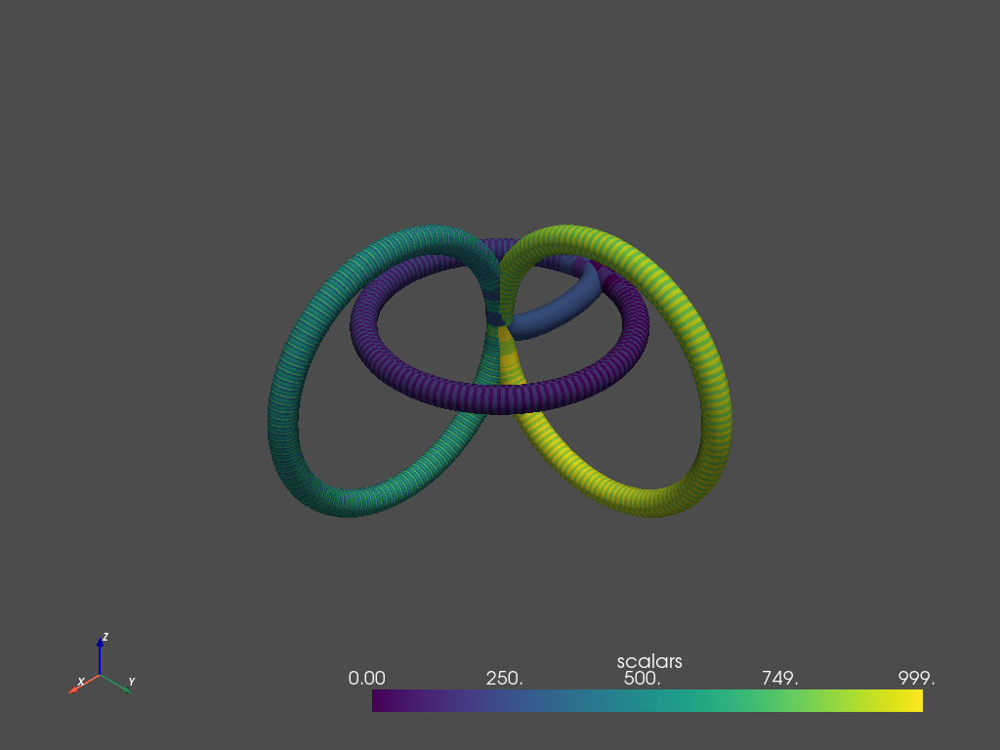

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

A = 1
f = 1

T = 1/f

# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (np.sin(f*theta))+(np.sin(f*theta))
x = r * np.sin(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * np.cos(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))



# Create spline with 1000 interpolation points
spline = pv.Spline(points, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


## Creation of a sphere

/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


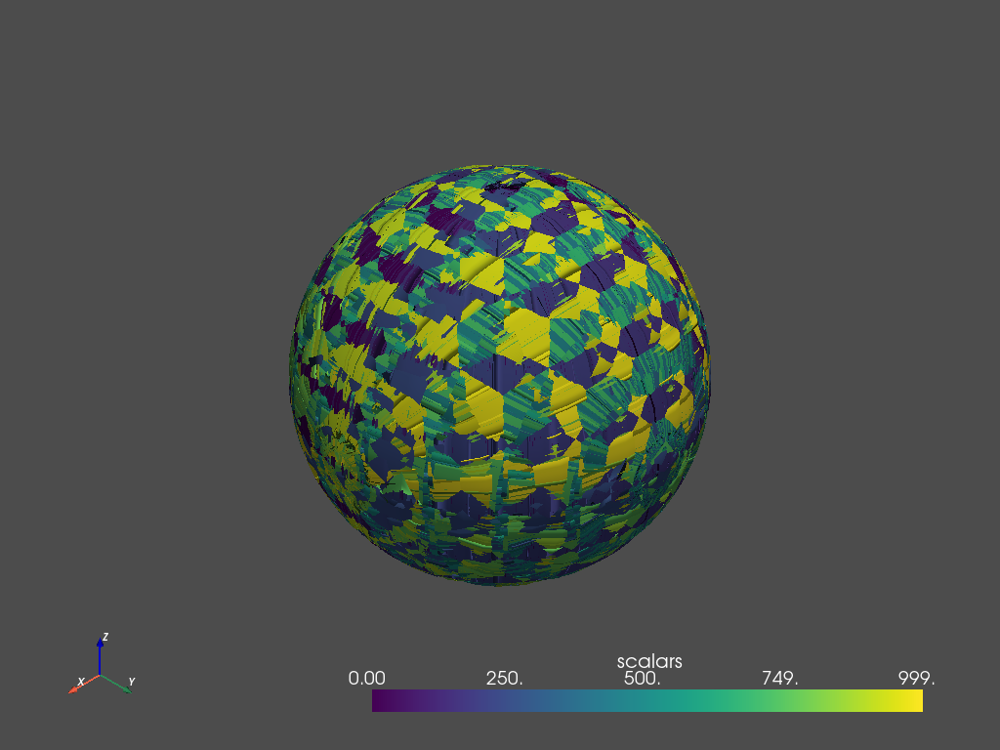

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

A = 1
f = 99

T = 1/f

# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (np.sin(f*theta))+(np.sin(f*theta))
x = r * np.sin(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * np.cos(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))



# Create spline with 1000 interpolation points
spline = pv.Spline(points, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


# 3D modelling

In [ ]:
# setup enviornment for interactive plotting

import os
os.system('/usr/bin/Xvfb :99 -screen 0 1024x768x24 &')
os.environ['DISPLAY'] = ':99'

import panel as pn
pn.extension('vtk')

## Sphere

/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


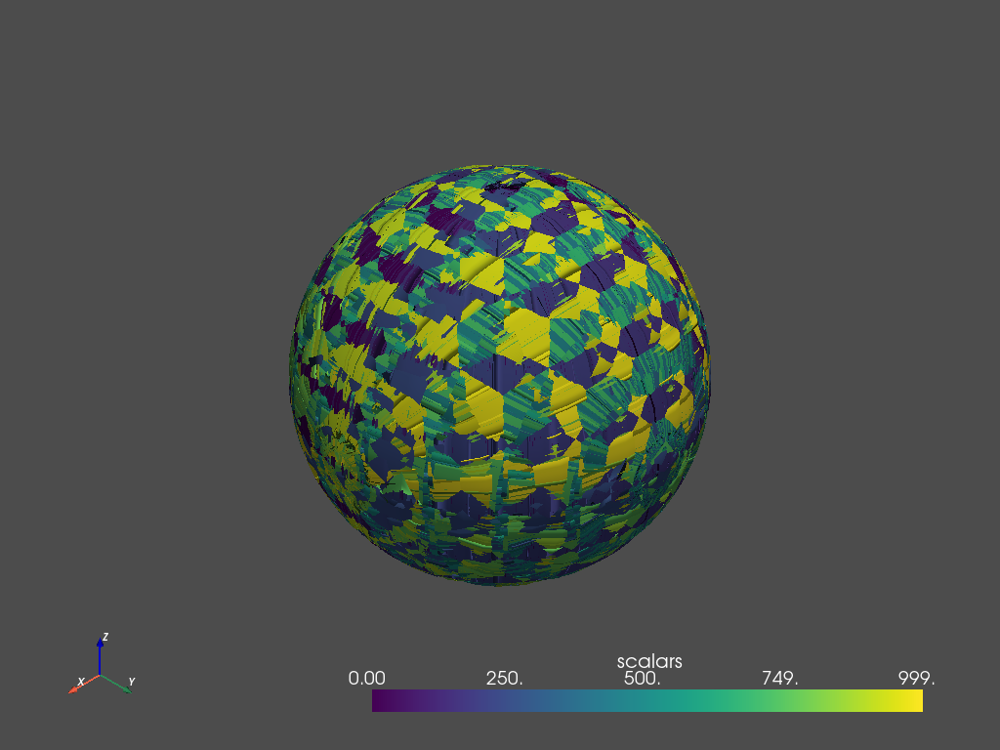

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 1
f = 99

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (np.sin(f*theta))+(np.sin(f*theta))
x = r * np.sin(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * np.cos(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))






# Create spline with 1000 interpolation points
spline = pv.Spline(points, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


## Two relative models

/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


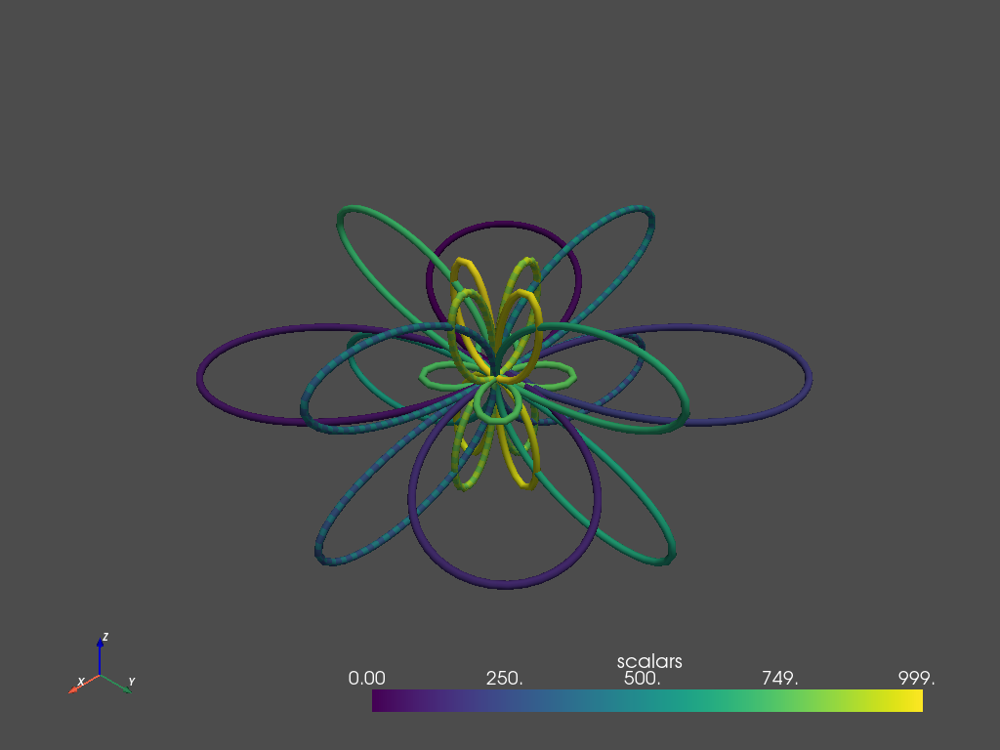

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 2
f = 2

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (np.sin(f*theta))+(np.sin(f*theta))
x = r * np.sin(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * np.cos(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))



# object 2

A = 1/2
f = 2

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (np.sin(f*theta))+(np.sin(f*theta))
x = r * np.sin(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * np.cos(theta)*A
points = np.concatenate((points,np.column_stack((x, y, z))))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))


# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


## Object

In [ ]:
def objct(points,A,f,n_points,X,Y,Z):

  T = 1/f
  # Horizontal ring


  theta = np.linspace(-np.pi, np.pi, n_points)
  z = np.linspace(0, 0, n_points)
  r = (np.sin(f*theta))+(np.sin(f*theta))
  x = r * np.sin(theta)*A-A/(2*np.pi*f)**(f-1)
  y = r * np.cos(theta)*A
  if len(points) == 1:
    points = np.column_stack((x+X, y+Y, z+Z))
  else:
    points = np.concatenate((points,np.column_stack((x+X, y+Y, z+Z))))
    

  # Vertical ring

  theta = np.linspace(-np.pi, np.pi, n_points)
  r = np.sin(f*theta)+np.sin(f*theta)
  z = r * np.cos(theta) 
  x = A * r * np.sin(theta)
  y = A * np.linspace(0, 0, n_points)
  points = np.concatenate((points,np.column_stack((x+X, y+Y, z+Z))))


  theta = np.linspace(-np.pi, np.pi, n_points)
  r = np.sin(f*theta)+np.sin(f*theta)
  z = r * np.cos(theta) 
  x = A * r * np.sin(theta)
  y = A * np.linspace(0, 0, n_points)
  points = np.concatenate((points,np.column_stack((x+X, y+Y, z+Z))))

  import scipy

  rotation_degrees = 90
  rotation_radians = np.radians(rotation_degrees)
  rotation_axis = np.array([0, 0, 1])

  rotation_vector = rotation_radians * rotation_axis
  rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
  rotated_vec = rotation.apply(np.column_stack((x, y, z)))
  rotated_vec[:,0] = rotated_vec[:,0] + X  # xaxis
  rotated_vec[:,1] = rotated_vec[:,1] + Y  # yaxis
  rotated_vec[:,2] = rotated_vec[:,2] + Z  # zaxis
  points = np.concatenate((points,rotated_vec))

  return points

## Modelling

/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


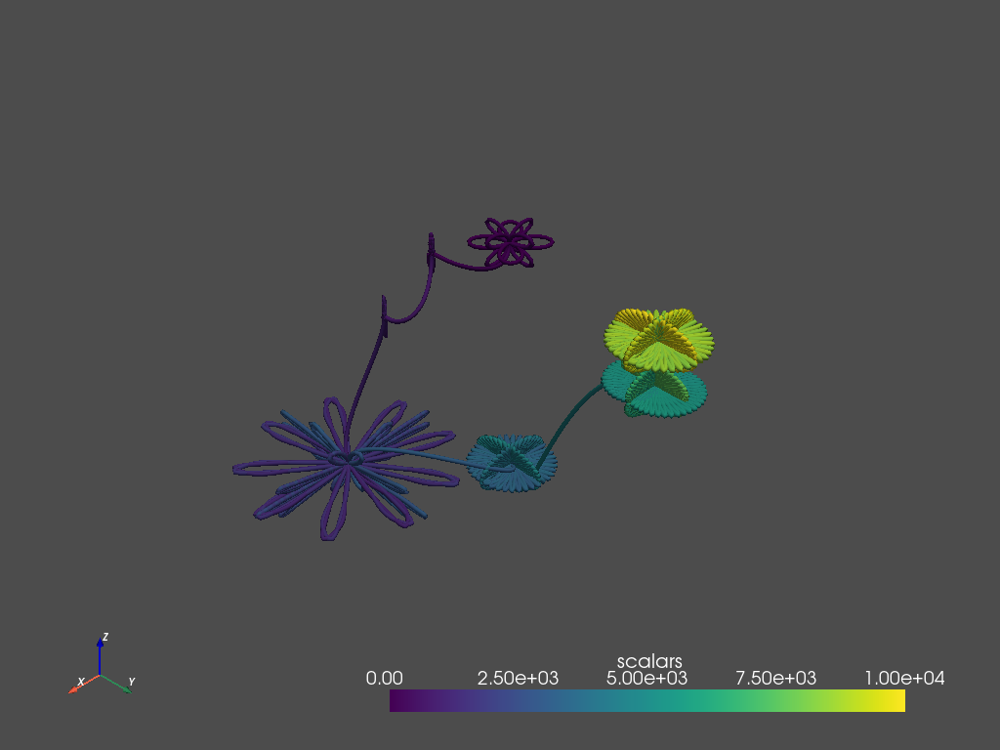

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 2
f = 2
n_points = 400

points = [0]

points = objct(points,A,f,n_points,0,0,0)



# object 2

A = 1/10
f = 20
X = [10,0,3]
n_points = 100

points = objct(points,A,f,n_points,X[0],X[1],X[2])


# object 3

A = 1/100
f = 10
X = [20,5,3]
n_points = 100

points = objct(points,A,f,n_points,X[0],X[1],X[2])


# object 4

A = 5
f = 90
X = [25,5,-10]
n_points = 100

points = objct(points,A,f,n_points,X[0],X[1],X[2])


# object 5

A = 2
f = 20
X = [15,15,-10]
n_points = 100

points = objct(points,A,f,n_points,X[0],X[1],X[2])


# object 6

A = 2
f = 50
X = [15,30,6]
n_points = 100

points = objct(points,A,f,n_points,X[0],X[1],X[2])


# object 6

A = 1/2
f = 10
X = [15,30,10]
n_points = 100

points = objct(points,A,f,n_points,X[0],X[1],X[2])


# object 6

A = 2
f = 20
X = [15,30,10]
n_points = 100

points = objct(points,A,f,n_points,X[0],X[1],X[2])



# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points, 10000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);

/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


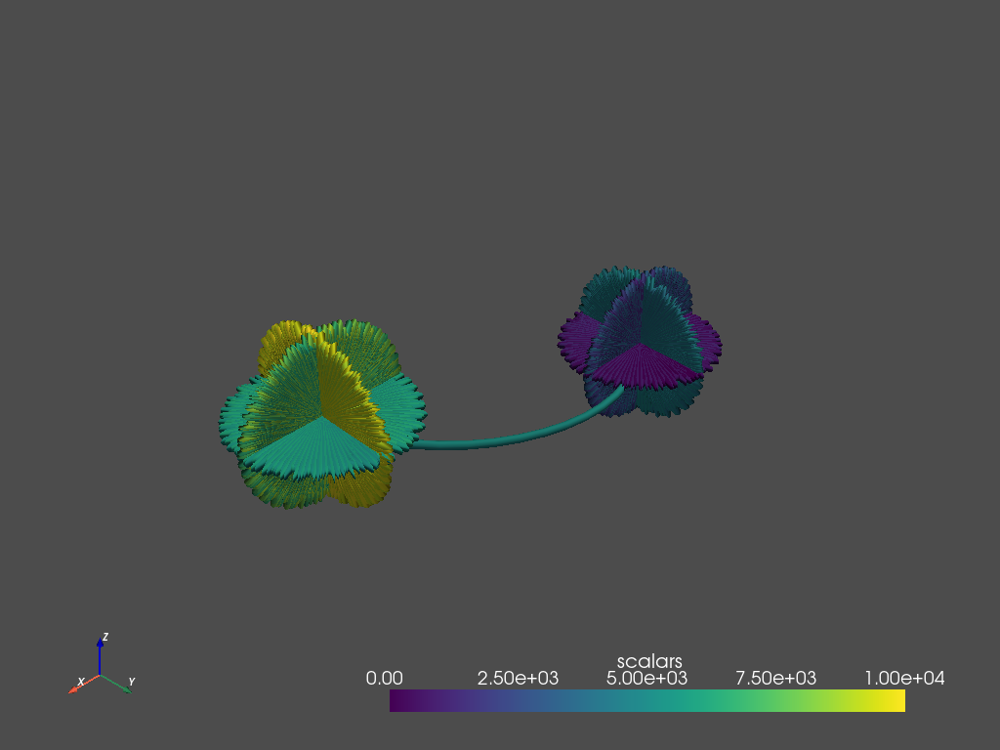

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 1
f = 100
n_points = 1000

points = [0]

points = objct(points,A,f,n_points,0,0,0)



# object 2

A = 1
f = 100
X = [10,0,3]
n_points = 1000

points = objct(points,A,f,n_points,X[0],X[1],X[2])



# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points, 10000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);

## Model planets

In [ ]:
n = 2 # for Earth

print(np.log(eT[n]))
print(np.log(e_orb[n]))
print(np.log(e_free[n]))

print(np.log(n_freeMG[n]))
print(np.log(n_freeTH[n]))

print(np.log(Volume[n]))

117.99084612076264
61.26330295482904
117.99084612076264
98.1356125550449
117.99084611838042
48.43420657605083


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: overflow encountered in double_scalars
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


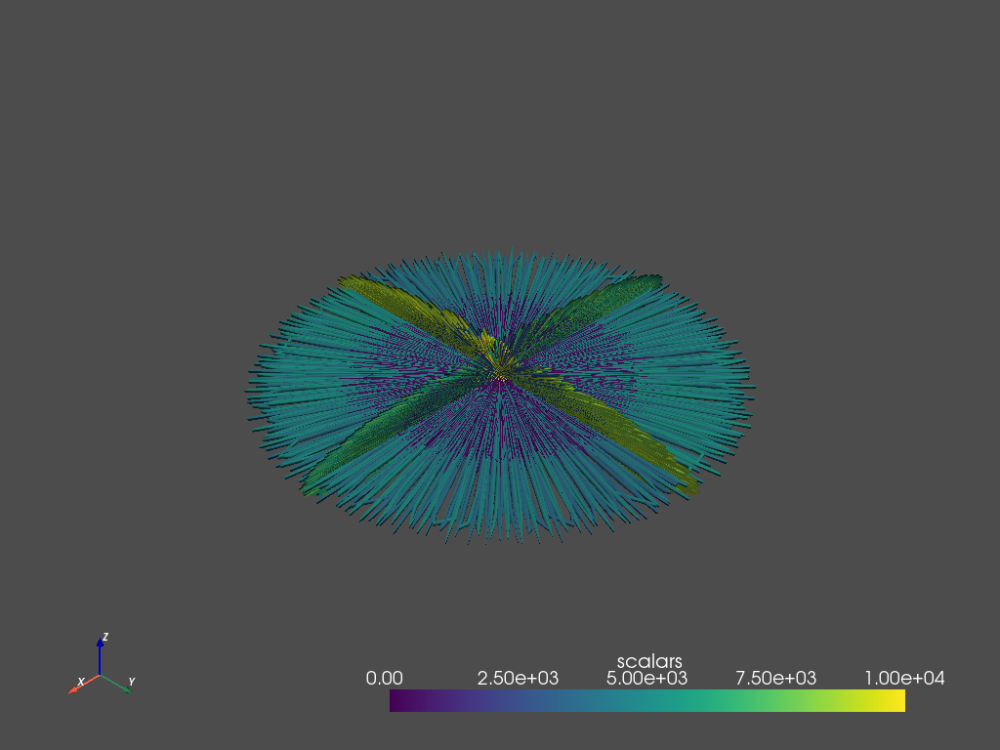

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

points = [0]

# Earth
n=2

# Magnetic electrons

A = np.log(n_freeMG[n]/e_orb[n])/10
f = np.log(n_freeMG[n])
X = [0,0,0]
n_points = 1000

points = objct(points,A,f,n_points,X[0],X[1],X[2])


# Thermal electrons

A = np.log(n_freeTH[n]/e_orb[n])/10
f = np.log(n_freeTH[n])
X = [0,0,0]
n_points = 1000

points = objct(points,A,f,n_points,X[0],X[1],X[2])


# Orbital electrons

A = 1
f = np.log(e_orb[n])
X = [0,0,0]
n_points = 1000

points = objct(points,A,f,n_points,X[0],X[1],X[2])





# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points, 10000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: overflow encountered in double_scalars
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


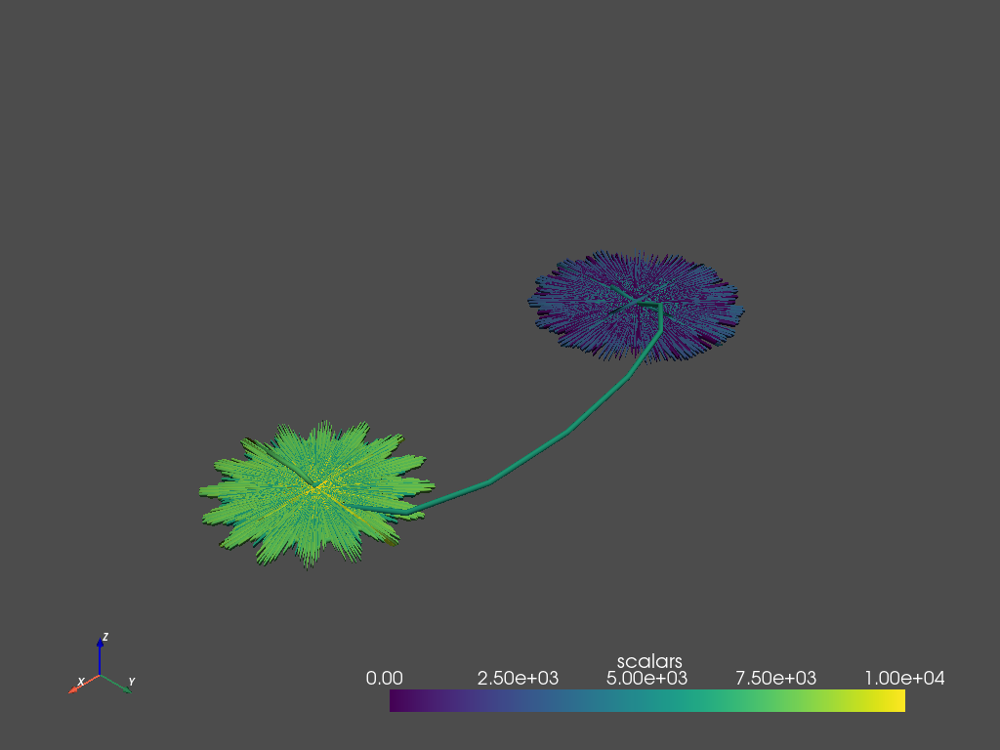

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

points = [0]

# Sun
n=9

# Magnetic electrons

A = np.log(n_freeMG[n])
f = np.log(n_freeMG[n])
X = [0,0,0]
n_points = 1000

points = objct(points,A,f,n_points,X[0],X[1],X[2])


# Thermal electrons

A = np.log(n_freeTH[n])
f = np.log(n_freeTH[n])
X = [0,0,0]
n_points = 1000

points = objct(points,A,f,n_points,X[0],X[1],X[2])


# Orbital electrons

A = np.log(e_orb[n])
f = np.log(e_orb[n])
X = [0,0,0]
n_points = 1000

points = objct(points,A,f,n_points,X[0],X[1],X[2])


# Earth
n=2

# Magnetic electrons

A = np.log(n_freeMG[n])
f = np.log(n_freeMG[n])
X = [1000*Sun_distance[n],0,0]
n_points = 1000

points = objct(points,A,f,n_points,X[0],X[1],X[2])


# Thermal electrons

A = np.log(n_freeTH[n])
f = np.log(n_freeTH[n])
n_points = 1000

points = objct(points,A,f,n_points,X[0],X[1],X[2])


# Orbital electrons

A = np.log(e_orb[n])
f = np.log(e_orb[n])
n_points = 1000

points = objct(points,A,f,n_points,X[0],X[1],X[2])


# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points, 10000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);

## Forces

In [ ]:
def objct(points,A,f,n_points,X,Y,Z,object_force):

  T = 1/f
  # Horizontal ring


  theta = np.linspace(-np.pi, np.pi, n_points)
  z = np.linspace(0, 0, n_points)
  r = (np.sin(f*theta))+(np.sin(f*theta)) + object_force
  x = r * np.sin(theta)*A-A/(2*np.pi*f)**(f-1)
  y = r * np.cos(theta)*A
  if len(points) == 1:
    points = np.column_stack((x+X, y+Y, z+Z))
  else:
    points = np.concatenate((points,np.column_stack((x+X, y+Y, z+Z))))
    

  # Vertical ring

  theta = np.linspace(-np.pi, np.pi, n_points)
  r = np.sin(f*theta)+np.sin(f*theta)
  z = r * np.cos(theta) 
  x = A * r * np.sin(theta)
  y = A * np.linspace(0, 0, n_points)
  points = np.concatenate((points,np.column_stack((x+X, y+Y, z+Z))))


  theta = np.linspace(-np.pi, np.pi, n_points)
  r = np.sin(f*theta)+np.sin(f*theta)
  z = r * np.cos(theta) 
  x = A * r * np.sin(theta)
  y = A * np.linspace(0, 0, n_points)
  points = np.concatenate((points,np.column_stack((x+X, y+Y, z+Z))))

  import scipy

  rotation_degrees = 90
  rotation_radians = np.radians(rotation_degrees)
  rotation_axis = np.array([0, 0, 1])

  rotation_vector = rotation_radians * rotation_axis
  rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
  rotated_vec = rotation.apply(np.column_stack((x, y, z)))
  rotated_vec[:,0] = rotated_vec[:,0] + X  # xaxis
  rotated_vec[:,1] = rotated_vec[:,1] + Y  # yaxis
  rotated_vec[:,2] = rotated_vec[:,2] + Z  # zaxis
  points = np.concatenate((points,rotated_vec))

  return points

3


/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


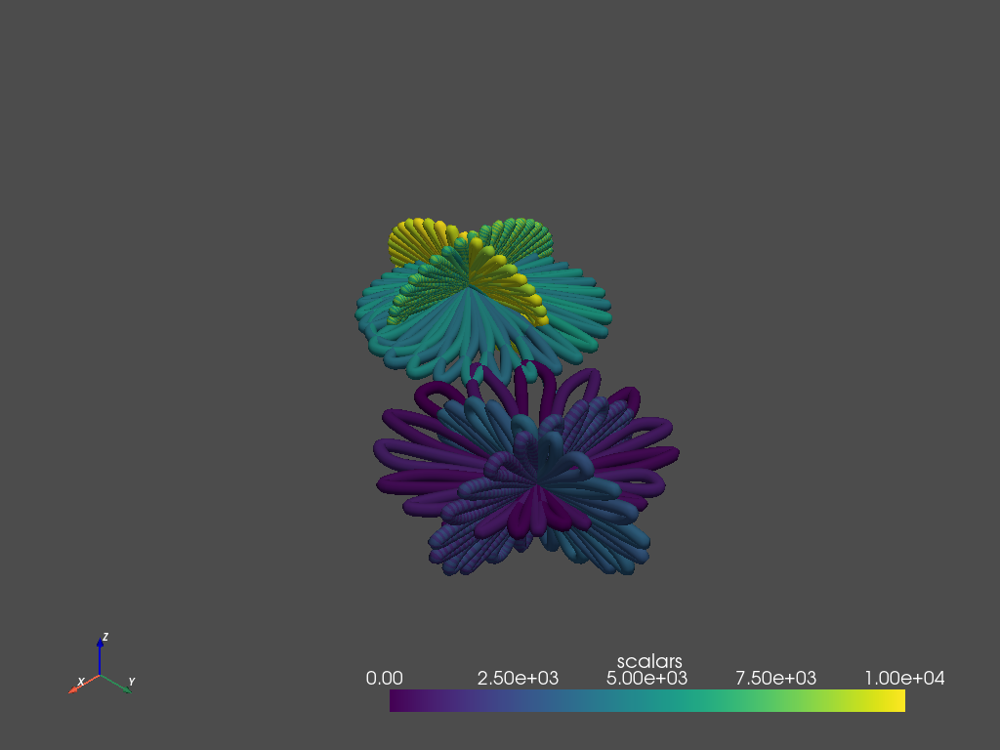

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

n_points = 100
points = [0]
theta = np.linspace(-np.pi, np.pi, n_points)

X2 = [2,1,0]
X1 = [8,10,0]

angle = np.arctan((X2[1]-X1[1])/(X2[0]-X1[0]))
if X2[0] == X1[0]:
  angle = 0

print(sum(X2))

a = 0
if X2[0]<X1[0]:
  a = 1

# object

A = 2
f = 10

n_points = 100

force12 = np.sin(theta+angle+a*np.pi)

points = objct(points,A,f,n_points,X1[0],X1[1],X1[2],force12)


# object

A = 2
f = 20

n_points = 100
force21 = np.sin(theta+angle+(1-a)*np.pi)

points = objct(points,A,f,n_points,X2[0],X2[1],X2[2],force21)



# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points, 10000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);

## Planets with forces

68.56392016109227


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: overflow encountered in double_scalars
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


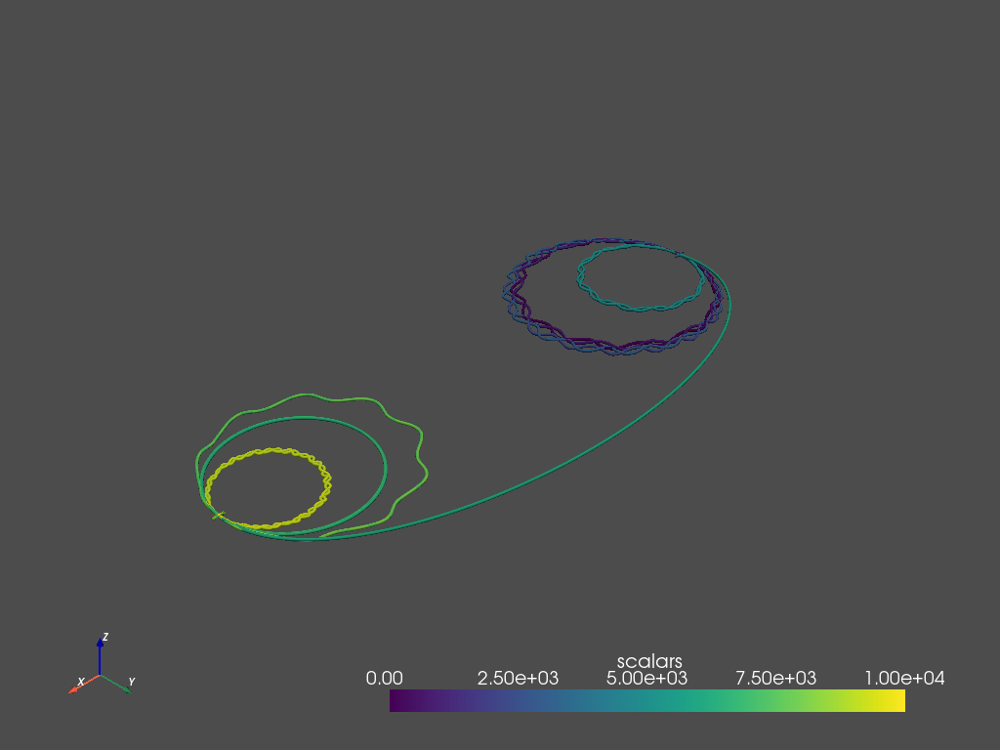

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

points = [0]

X1 = [0,0,0]
X2 = [25000*Sun_distance[n],0,0]

charge = e_orb[2]*e_orb[9]*(1.6E-19)**2
distance = np.sqrt((X2[0]-X1[0])**2+(X2[1]-X1[1])**2+(X2[2]-X1[2])**2)/1000
F = np.log(8.9875517923E9*charge/distance**2)

print(F)

angle = np.arctan((X2[1]-X1[1])/(X2[0]-X1[0]))
if X2[0] == X1[0]:
  angle = 0

a = 0
if X2[0]<X1[0]:
  a = 1

# Sun
n=9

# Magnetic electrons

A = np.log(n_freeMG[n])
f = np.log(n_freeMG[n])
X = X1
n_points = 100

force12 = F*np.sin(theta+angle+a*np.pi)

points = objct(points,A,f,n_points,X[0],X[1],X[2],force12)


# Thermal electrons

A = np.log(n_freeTH[n])
f = np.log(n_freeTH[n])
n_points = 100

points = objct(points,A,f,n_points,X[0],X[1],X[2],force12)


# Orbital electrons

A = np.log(e_orb[n])
f = np.log(e_orb[n])
n_points = 100

points = objct(points,A,f,n_points,X[0],X[1],X[2],force12)


# Earth
n=2

# Magnetic electrons

A = np.log(n_freeMG[n])
f = np.log(n_freeMG[n])
X = X2
n_points = 100

force21 = F*np.sin(theta+angle+(1-a)*np.pi)

points = objct(points,A,f,n_points,X[0],X[1],X[2],force21)


# Thermal electrons

A = np.log(n_freeTH[n])
f = np.log(n_freeTH[n])
n_points = 100

points = objct(points,A,f,n_points,X[0],X[1],X[2],force21)


# Orbital electrons

A = np.log(e_orb[n])
f = np.log(e_orb[n])
n_points = 100

points = objct(points,A,f,n_points,X[0],X[1],X[2],force21)


# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points, 10000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=10*5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);

In [ ]:
n = 2 # for Earth

print(np.log(eT[n]))
print(np.log(e_orb[n]))
print(np.log(e_free[n]))

print(np.log(n_freeMG[n]))
print(np.log(n_freeTH[n]))

print(np.log(Volume[n]))

117.99084612076264
61.26330295482904
117.99084612076264
98.1356125550449
117.99084611838042
48.43420657605083


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: overflow encountered in double_scalars
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


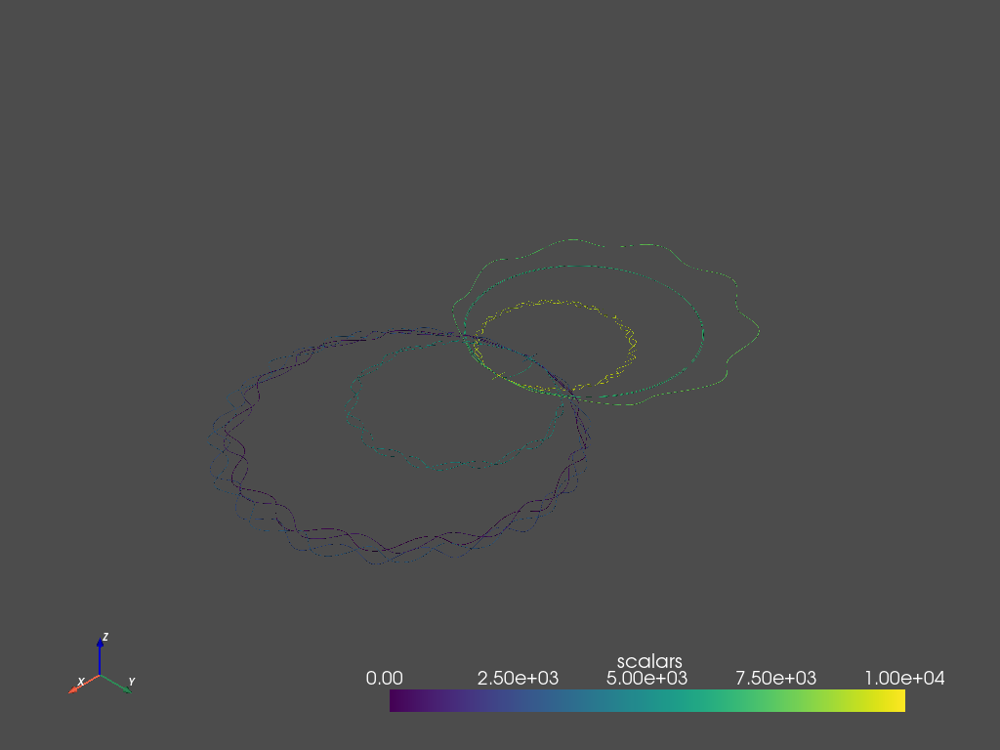

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

points = [0]

X1 = [0,0,0]
X2 = [1000*Sun_distance[n],0,0]

charge = e_orb[2]*e_orb[9]*(1.6E-19)**2
distance = np.sqrt((X2[0]-X1[0])**2+(X2[1]-X1[1])**2+(X2[2]-X1[2])**2)
F = np.log(8.9875517923E9*charge/distance**2)

angle = np.arctan((X2[1]-X1[1])/(X2[0]-X1[0]))
if X2[0] == X1[0]:
  angle = 0

a = 0
if X2[0]<X1[0]:
  a = 1

# Sun
n=9

# Magnetic electrons

A = np.log(n_freeMG[n])
f = np.log(n_freeMG[n])
X = X1
n_points = 100

force12 = F*np.sin(theta+angle+a*np.pi)

points = objct(points,A,f,n_points,X[0],X[1],X[2],force12)


# Thermal electrons

A = np.log(n_freeTH[n])
f = np.log(n_freeTH[n])
n_points = 100

points = objct(points,A,f,n_points,X[0],X[1],X[2],force12)


# Orbital electrons

A = np.log(e_orb[n])
f = np.log(e_orb[n])
n_points = 100

points = objct(points,A,f,n_points,X[0],X[1],X[2],force12)


# Earth
n=2

# Magnetic electrons

A = np.log(n_freeMG[n])
f = np.log(n_freeMG[n])
X = X2
n_points = 100

force21 = F*np.sin(theta+angle+(1-a)*np.pi)

points = objct(points,A,f,n_points,X[0],X[1],X[2],force21)


# Thermal electrons

A = np.log(n_freeTH[n])
f = np.log(n_freeTH[n])
n_points = 100

points = objct(points,A,f,n_points,X[0],X[1],X[2],force21)


# Orbital electrons

A = np.log(e_orb[n])
f = np.log(e_orb[n])
n_points = 100

points = objct(points,A,f,n_points,X[0],X[1],X[2],force21)


# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points, 10000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);

## Particles

/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


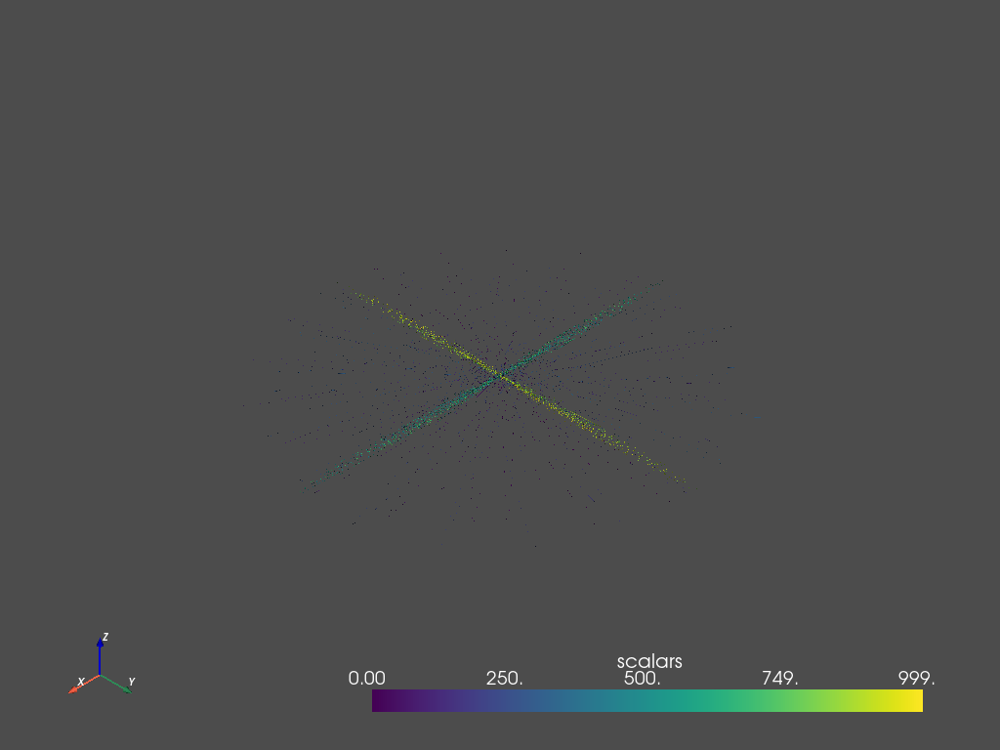

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 20
f = 40

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (np.sin(f*theta))+(np.sin(f*theta))
x = r * np.sin(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * np.cos(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))



# object 2

A = 1/20
f = 20

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (np.sin(f*theta))+(np.sin(f*theta))
x = r * np.sin(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * np.cos(theta)*A
points = np.concatenate((points,np.column_stack((x, y, z))))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))


# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


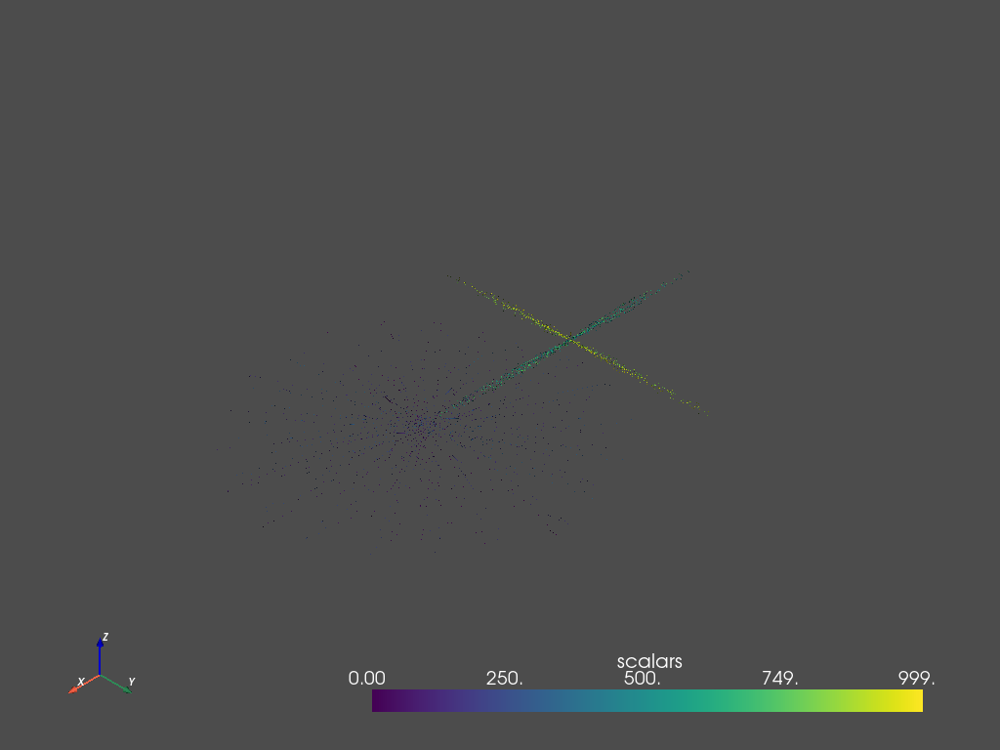

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 20
f = 40

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (np.sin(f*theta))+(np.sin(f*theta))
x = r * np.sin(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * np.cos(theta)*A
points = np.column_stack((x+2*A, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))



# object 2

A = 1/20
f = 20

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (np.sin(f*theta))+(np.sin(f*theta))
x = r * np.sin(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * np.cos(theta)*A
points = np.concatenate((points,np.column_stack((x, y, z))))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))


# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


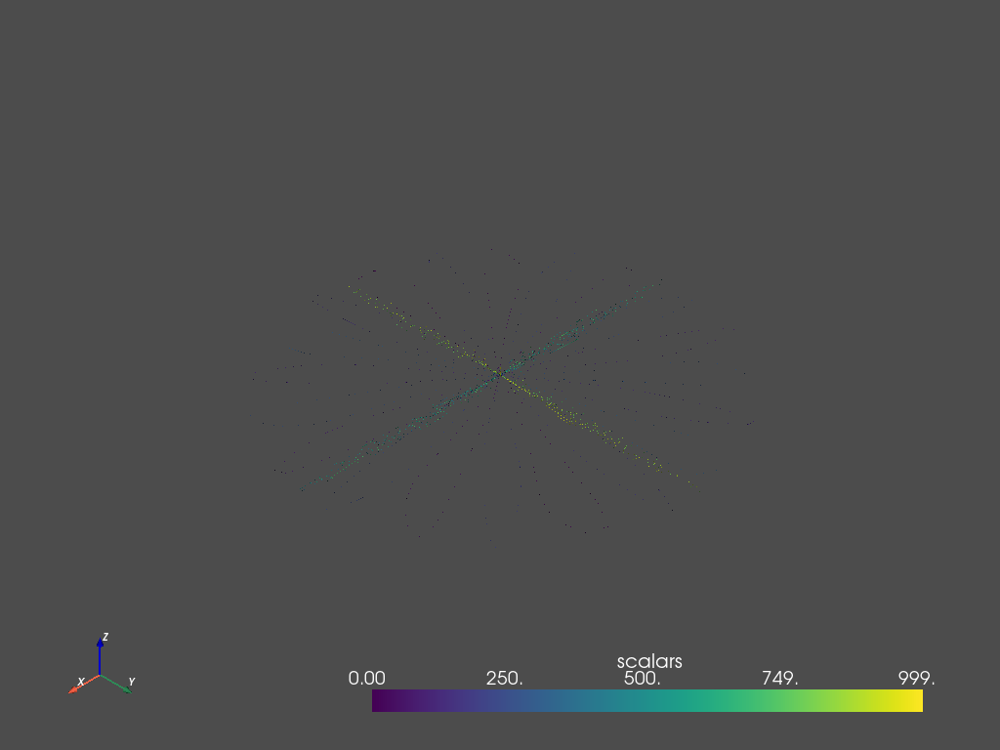

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 20
f = 10

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (np.sin(f*theta))+(np.sin(f*theta))
x = r * np.sin(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * np.cos(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))



# object 2

A = 1/20
f = 20

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (np.sin(f*theta))+(np.sin(f*theta))
x = r * np.sin(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * np.cos(theta)*A
points = np.concatenate((points,np.column_stack((x, y, z))))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))


# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


## Curved Line

/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


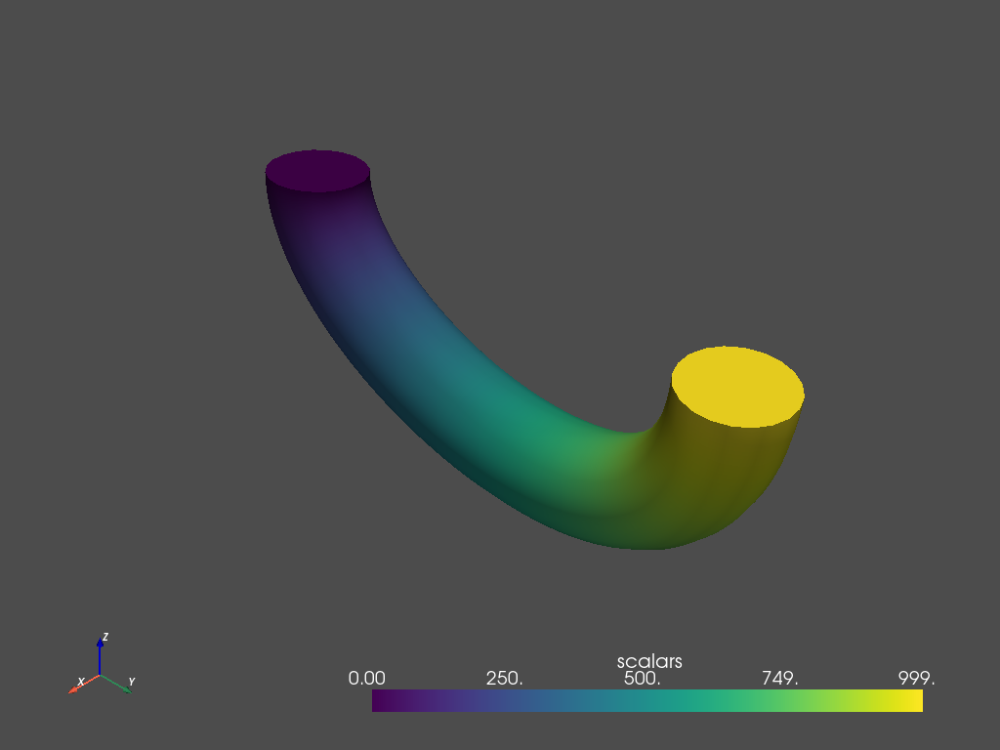

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

A = 1
f = 99

T = 1/f

# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (np.sin(f*theta))+(np.sin(f*theta))
x = r * np.sin(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * np.cos(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x+A, y, z))) # changes to line by translation of A


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))

# Create spline with 1000 interpolation points
spline = pv.Spline(points, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


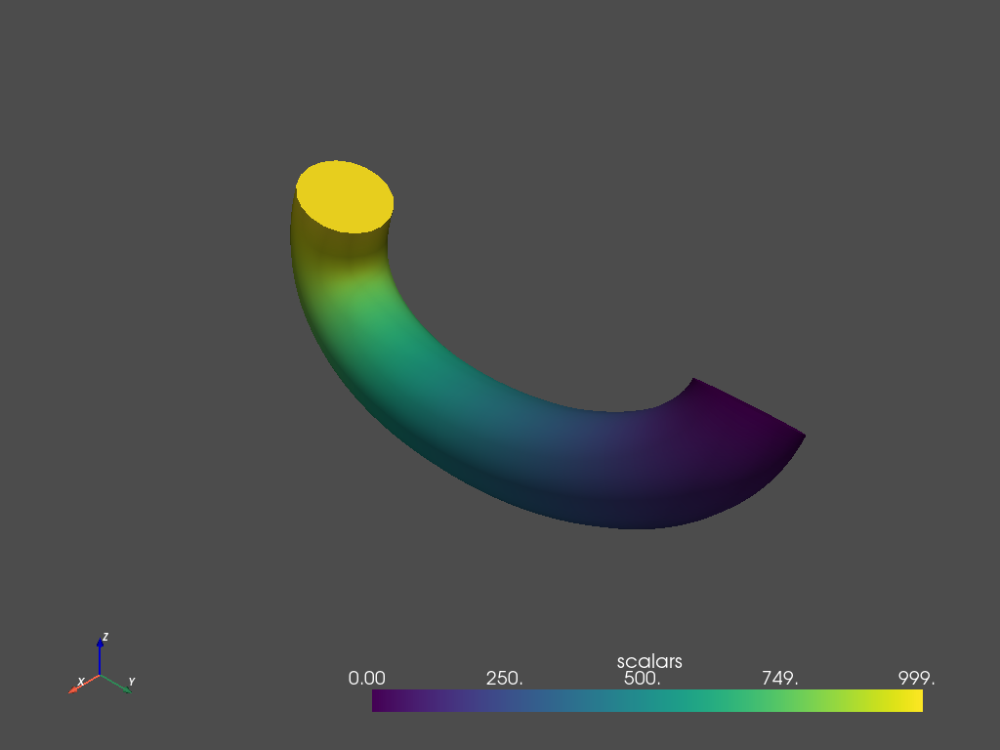

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

A = 9
f = 99

T = 1/f

# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (np.sin(f*theta))+(np.sin(f*theta))
x = r * np.sin(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * np.cos(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x-A, y, z))) # changes to line


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))



# Create spline with 1000 interpolation points
spline = pv.Spline(points, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


# Fibonacci

## Fibonacci sequence

[0, 1, 1, 2, 3, 5, 8, 13, 21, 34, 55, 89, 144, 233, 377]

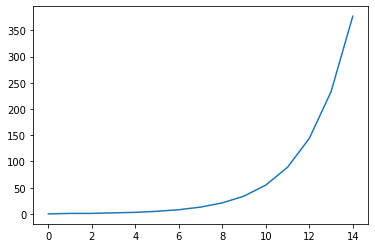

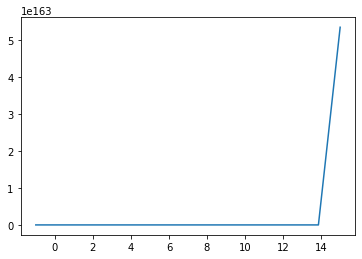

In [ ]:
def fibonacci_of(n):
  if n in {0, 1}:  # Base case
    return n
  return fibonacci_of(n - 1) + fibonacci_of(n - 2)  # Recursive case

x = [fibonacci_of(n) for n in range(15)]

plt.plot(x)


x2 = np.linspace(-1, 15, 15)
y2 = np.exp(x)

plt.figure()
plt.plot(x2, y2)

x

In [ ]:
O = np.array([0]) #0

l = np.array([1]) # 1

a = O+l #1

b = l+l #2

c =  l+l+l#3

d = b+c #5

e = d+c #8
e

array([8])

In [ ]:
0 1 3 8 21
 1 2 5 13 34

SyntaxError: ignored

In [ ]:


0 3 20
 1 6 37
  2 11 68



In [ ]:
#0,1
fib2 = np.array([0,1,1, 2, 3, 5, 8, 13, 21, 34,55,89,144,233,377,610])

In [ ]:
a = [0,1,1]
f = 2
n = 2

a = np.append(a,2*a[n]-(a[n-f+1]-a[n-f]))
a

In [ ]:
#0,1,2
fib3 = np.array([0,1,2,3, 6, 11, 20, 37, 68,85,153,  306, 544, 1003,1853,3400])

In [ ]:
#0,1,2
fib10 = np.array([0,1,2,3,4,5,6,7,8,9,10,55,109,217])

In [ ]:
a = fib10
f = 10
n = 13

2*a[n]-(a[n-f+1]-a[n-f]) # = a[n+1]



## Fibonacci via machine learning

In [ ]:
# predict
def pred(x):
  return reg.predict(np.array([x]))

[0, 1, 1, 2, 3, 5, 8, 13, 21, 34, 55, 89, 144, 233, 377, 610, 987, 1597, 2584, 4181, 6765, 10946, 17711, 28657, 46368, 75025, 121393, 196418, 317811, 514229, 832040, 1346269, 2178309, 3524578, 5702887, 9227465, 14930352, 24157817, 39088169, 63245986, 102334155, 165580141, 267914296, 433494437, 701408733, 1134903170, 1836311903, 2971215073, 4807526976, 7778742049, 12586269025, 20365011074, 32951280099, 53316291173, 86267571272, 139583862445, 225851433717, 365435296162, 591286729879, 956722026041, 1548008755920, 2504730781961, 4052739537881, 6557470319842, 10610209857723, 17167680177565, 27777890035288, 44945570212853, 72723460248141, 117669030460994, 190392490709135, 308061521170129, 498454011879264, 806515533049394, 1304969544928659, 2111485077978054, 3416454622906715, 5527939700884773, 8944394323791494, 14472334024676276, 23416728348467784, 37889062373144088, 61305790721611912, 99194853094756064, 160500643816368064, 259695496911124288, 420196140727492608, 679891637638617344, 110008777

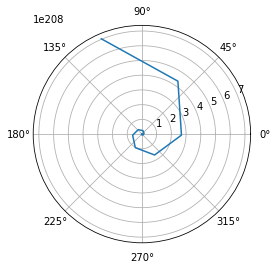

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
import matplotlib as plt

# features
fibonacci = pd.DataFrame([[1,1,2],[2,1,3],[3,2,5],[5,3,8],[8,5,13]])

# target
fibonacci.columns = [0,1,2]
fibonacci.iloc[0]
fibonacci

# train
reg = LinearRegression().fit(fibonacci[[0,1]],fibonacci[2])
reg.score(fibonacci[[0,1]],fibonacci[2])

list1 = [0,1]

for k in range(1000):
  list1.append(int(np.rint(pred([list1[k],list1[k+1]]))))
print(list1)

plt.pyplot.polar(list1)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1692: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['float']. An error will be raised in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1692: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['float']. An error will be raised in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:805: RuntimeWarning: overflow encountered in square
  numerator = (weight * (y_true - y_pred) ** 2).sum(axis=0, dtype=np.float64)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:807: RuntimeWarning: overflow encountered in square
  weight * (y_true - np.average(y_true, axis=0, weights=sample_weight)) ** 2
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:813: RuntimeWarning: invalid value encountered in true_divide
 

[0, 1, 71288134650346800291268306339067051951456695425758748915299883092176174487635584164154887676833928121541286087087412614229511011271491218722697833120659596691437416786879139845044909253853184, 154753736495720334925382022352499472256448252059827024708172279920854019677625933383262114513684535284322764359864121807473506699886884605655640010248624849825617536146542819150851244365447168, 304061544103070020589526629174197270934942974671592188318887153990297976591047182519292282511561705619719822305656924260122017169411871946341558180589258922578320792129360130139550376796356608, 539270446994798587756354033944200563589136226159087533097988927635720112834929733885420145178292818926146396961364295221817420263021033107602467396859319379753752707986398028326208129510408192, 922697971716202875358193782928119190876711485045905356651740055946904840239762732970524817447350418140781434643420949841406435736425146428823917250062021108666025859613600701162602134442606592, 154182149801713686281715

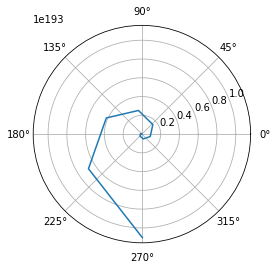

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
import matplotlib as plt

n = 950
# features
fibonacci = pd.DataFrame([np.transpose(list1[n+0:n+10]),np.transpose(list1[n+10:n+20]),np.transpose(list1[n+10:n+20]),np.transpose(list1[n+20:n+30]),np.transpose(list1[n+40:n+50])])

# columns
fibonacci.columns = np.linspace(0,len(list1[0:10])-1,len(list1[0:10]))
fibonacci.iloc[0]
fibonacci

# train
reg = LinearRegression().fit(fibonacci[[0,1]],fibonacci[2])
reg.score(fibonacci[[0,1]],fibonacci[2])

list1 = [0,1]

for k in range(10):
  list1.append(int(np.rint(pred([list1[k],list1[k+1]]))))

print(list1)
plt.pyplot.polar(list1);

# Fractals

In [ ]:
def plot_coords(coords, bare_plot=False):
    if bare_plot:
        # Turns off the axis markers.
        plt.axis('off')
    # Ensures equal aspect ratio.
    plt.axes().set_aspect('equal', 'datalim')
    # Converts a list of coordinates into 
    # lists of X and Y values, respectively.
    X, Y = zip(*coords)
    # Draws the plot.
    plt.plot(X, Y);

In [ ]:
def turtle_to_coords(turtle_program, turn_amount=45):
    # The state variable tracks the current location and angle of the turtle.
    # The turtle starts at (0, 0) facing up (90 degrees).
    state = (0.0, 0.0, 90.0)
    
    # Throughout the turtle's journey, we "yield" its location. These coordinate
    # pairs become the path that plot_coords draws.
    yield (0.0, 0.0)
    
    # Loop over the program, one character at a time.
    for command in turtle_program:
        x, y, angle = state
        
        if command in 'Ff':      # Move turtle forward
            state = (x - cos(angle * DEGREES_TO_RADIANS),
                     y + sin(angle * DEGREES_TO_RADIANS),
                     angle)
            
            if command == 'f':
                # Insert a break in the path so that
                # this line segment isn't drawn.
                yield (float('nan'), float('nan'))
                
            yield (state[0], state[1])
                        
        elif command == '+':     # Turn turtle clockwise without moving
            state = (x, y, angle + turn_amount)
            
        elif command == '-':     # Turn turtle counter-clockwise without moving
            state = (x, y, angle - turn_amount)
            
        # Note: We silently ignore unknown commands

In [ ]:
from math import isnan
def print_coords(coords):
    for (x, y) in coords:
        if isnan(x):
            print('<gap>')
        else:
            print('({:.2f}, {:.2f})'.format(x, y))

In [ ]:
def transform_sequence(sequence, transformations):
    return ''.join(transformations.get(c, c) for c in sequence)

In [ ]:
def transform_multiple(sequence, transformations, iterations):
    for _ in range(iterations):
        sequence = transform_sequence(sequence, transformations)
    return sequence

In [ ]:
def branching_turtle_to_coords(turtle_program, turn_amount=45):
    saved_states = list()
    state = (0, 0, 90)
    yield (0, 0)

    for command in turtle_program:
        x, y, angle = state

        if command.lower() in 'abcdefghij':        # Move forward (matches a-j and A-J)
            state = (x - cos(angle * DEGREES_TO_RADIANS),
                     y + sin(angle * DEGREES_TO_RADIANS),
                     angle)
            
            if command.islower():                  # Add a break in the line if command matches a-j
                yield (float('nan'), float('nan'))

            yield (state[0], state[1])

        elif command == '+':                       # Turn clockwise
            state = (x, y, angle + turn_amount)

        elif command == '-':                       # Turn counterclockwise
            state = (x, y, angle - turn_amount)

        elif command == '[':                       # Remember current state
            saved_states.append(state)

        elif command == ']':                       # Return to previous state
            state = saved_states.pop()
            yield (float('nan'), float('nan'))
            x, y, _ = state
            yield (x, y)

        # Note: We silently ignore unknown commands

In [ ]:
def l_plot(axiom, transformations, iterations=0, angle=45):
    turtle_program = transform_multiple(axiom, transformations, iterations)
    coords = branching_turtle_to_coords(turtle_program, angle)
    plot_coords(coords, bare_plot=True) # bare_plot removes the axis labels

In [ ]:
import matplotlib.pyplot as plt

plot_coords(turtle_to_coords(transform_multiple('F', {'F': '+F+F--F+F'}, 5)))

In [ ]:
l_plot('F', {'F': 'FF[++F][-FF]'}, 5, 22)

In [ ]:
l_plot('A', {'F': 'FF', 'A': 'F[+AF-[A]--A][---A]'}, 5, 22.5)

# Mathematics of Life

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


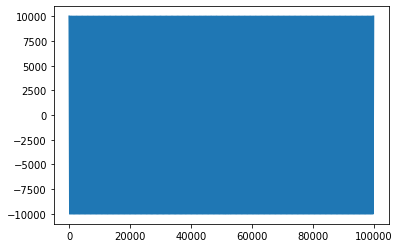

In [ ]:
L = 100000  # length
W = 10000  # width/height/amplitude
f = 100 # frequency


x = np.linspace(0j, 5j, L)

y = W*np.exp(f*np.pi*x)
y
plt.plot(y)

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


(-100.0, 100.0)

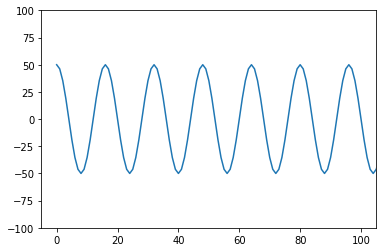

In [ ]:
L = 50  # length
W = 50  # width/height/amplitude
f = 1*L*W # frequency


i = np.linspace(0j, 1j, L)

y = W*np.exp(f*np.pi*x)
y
plt.plot(y)


# Observers view
plt.xlim(-5,105)
plt.ylim(-100,100)

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


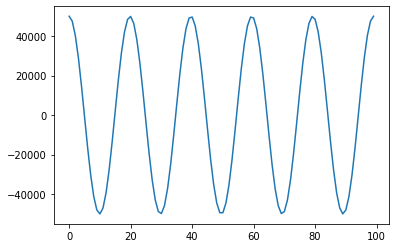

In [ ]:
L = 100  # length
W = 50000 # width/height/amplitude
f = 5 # frequency


x = np.linspace(0j, 1j, L)

y = W*np.exp(2*f*np.pi*x)
y
plt.plot(y)




/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


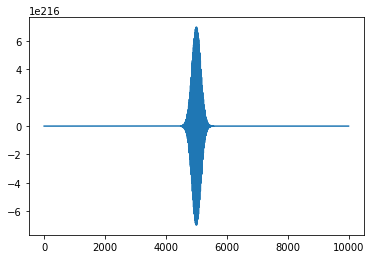

In [ ]:
L = 10000  # length
W = 500 # width/height/amplitude
f = 10000 # frequency


x = np.linspace(0j, 1j, L)

y = W*np.exp(f*np.pi*x)
y
plt.plot(np.sin(y))




## Cos and sine wave

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


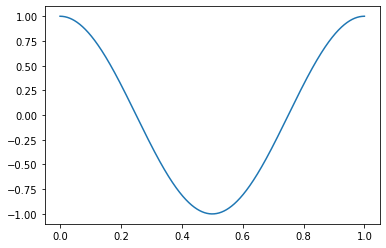

In [ ]:
L=1000
W=1
f=1

x = np.linspace(0j,1j,L)

xr = np.linspace(0,1,L)

y = (W*np.exp(2*f*np.pi*x))   # cos

plt.plot(xr,y)

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


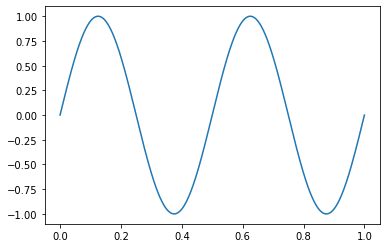

In [ ]:
L=1000
W=1
f=2

x = np.linspace(0j,1j,L)

xr = np.linspace(0,1,L)

y = (W*np.exp(2*f*np.pi*x-np.pi*0.5j))   # sine

plt.plot(xr,y) 


## Normal distribution

In [ ]:
mu = 1
sig = 5

L=1000
W=1/(2*np.sqrt(2*np.pi)*sig)
f=1/2

xr = np.linspace(-sig/2,sig/2,L)+mu

y = W*((-1)**(sig+1)*np.exp(-2j*f*np.pi*(xr)/sig)**2+1)  # change to real by removing -j

plt.plot(xr,y) 


## Electromagnetism spectrum

In [ ]:
L=10000
W=1
f=1

x = np.linspace(0j,1j,L)

xr = np.linspace(0,1,L)

y = np.sin(W*np.exp(2*f*np.pi*x))

y = np.sin(W*np.exp(2*f*np.pi*xr))

plt.plot(xr,y)


In [ ]:
L=10000
W=1
f=1

x = np.linspace(0j,1j,L)

xr = np.linspace(0,1,L)

y = np.sin(W*np.exp(2*f*np.pi*x))

y = np.sin(W*np.exp(2*f*np.pi*xr))

y = W*np.exp(2j*f*np.pi*(W*np.exp(2*f*np.pi*xr))-0.5j)

plt.plot(xr,y)


## Heart beat

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


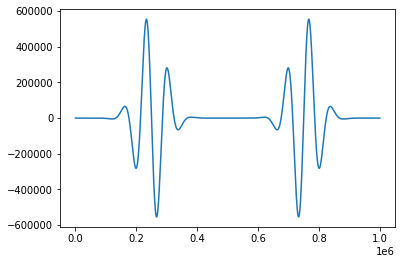

In [ ]:
L = 1000000   # length
W = 14 # width/height/amplitude
f = 2 # frequency

x = np.linspace(0j, 1j, L)

y = np.sin(W*np.exp(f*np.pi*x))

plt.plot(y)

In [ ]:
L = 1000   # length
W = 1 # width/height/amplitude
f = 2 # frequency

x = np.linspace(0j, 1j, L)
xr = np.linspace(0, 1, L)

y = W*np.exp(2*f*np.pi*(W*np.exp(2*f*np.pi*x))*1j-0.5j)

plt.plot(y)



In [ ]:
L = 1000000  # length
W = 3 # width/height/amplitude
f = 1 # frequency

x = np.linspace(0j, 1j, L)

y = W*np.exp(2*f*np.pi*(W*np.exp(2*f*np.pi*x))*1j)

plt.plot(y)

## Sinusodial exponentially-corrected formulas

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def E(x):
  return W*np.exp(2*f*np.pi*x)

def E2(x):
  return W*np.exp(2*f*np.pi*x-0.5j*np.pi)

def S(x):
  return W*np.exp(2*f*np.pi*x*1j-np.pi*0.5j)

def C(x):
  return W*np.exp(2*f*np.pi*x*1j)

def Electromagnetism(x):
  return S(E(x))

def ElectronWave(x):
  return C(C(x))

def LifeWave(x):
  return S(C(x))

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


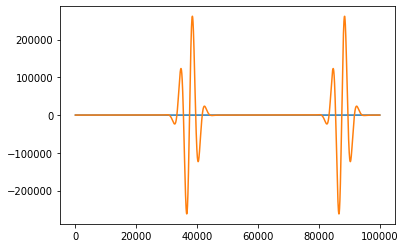

In [ ]:
W = 1
f = 2
L = 100000

x = np.linspace(0, 1, L)

#plt.plot(E(x)) # exponential
#plt.plot(C(x)) # cos
#plt.plot(S(x)) # sine

plt.plot(S(E(x))) # electromagnetic spectrum

#plt.plot(C(C(x))) # electron beat

plt.plot(S(C(x))) # heart beat

In [ ]:
plt.plot(E(x))
plt.plot(E2(x))

In [ ]:
plt.plot(E(x*1j))
plt.plot(E2(x*1j))

In [ ]:
plt.plot(S(x))
plt.plot(C(x))

In [ ]:
plt.plot(S(E(x)))

In [ ]:
plt.plot(LifeWave(x))

In [ ]:
plt.plot(ElectronWave(x))

In [ ]:
plt.plot(Electromagnetism(x))

In [ ]:
plt.plot(S(E(x))+C(E(x)))

In [ ]:
plt.plot(LifeWave(x))

# Infinite universes

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def E(x):
  return W*np.exp(2*f*np.pi*x)

def E2(x):
  return W*np.exp(2*f*np.pi*x-0.5j*np.pi)

def S(x):
  return W*np.exp(2*f*np.pi*x*1j-np.pi*0.5j)

def C(x):
  return W*np.exp(2*f*np.pi*x*1j)

def Electromagnetism(x):
  return S(E(x))

def ElectronWave(x):
  return C(C(x))

def LifeWave(x):
  return S(C(x))

In [ ]:
W = 1
f = 100
L = 10000

x = np.linspace(0, 1, L)

phase = -0/(4*f)

fig, axs = plt.subplots(3, 2)

axs[0,0].plot(E(x+phase)) # exponential
axs[1,1].plot(C(x+phase)) # cos
axs[1,0].plot(S(x+phase)) # sine

axs[0,1].plot(S(E(x+phase))) # electromagnetic spectrum

axs[2,1].plot(C(C(x+phase))) # electron beat
axs[2,0].plot(S(C(x+phase))) # heart beat

In [ ]:
W = 25
f = 25
L = 10000

x = np.linspace(0, 1, L)

phase = -0/(4*f)

fig, axs = plt.subplots(3, 2)

axs[0,0].plot(E(x+phase)) # exponential
axs[1,1].plot(C(x+phase)) # cos
axs[1,0].plot(S(x+phase)) # sine

axs[0,1].plot(S(E(x+phase))) # electromagnetic spectrum

axs[2,1].plot(C(C(x+phase))) # electron beat
axs[2,0].plot(S(C(x+phase))) # heart beat

In [ ]:
W = 2
f = 50
L = 10000

x = np.linspace(0, 1, L)

phase = -0/(4*f)

fig, axs = plt.subplots(3, 2)

axs[0,0].plot(E(x+phase)) # exponential
axs[1,1].plot(C(x+phase)) # cos
axs[1,0].plot(S(x+phase)) # sine

axs[0,1].plot(S(E(x+phase))) # electromagnetic spectrum

axs[2,1].plot(C(C(x+phase))) # electron beat
axs[2,0].plot(S(C(x+phase))) # heart beat

In [ ]:
# W x f < 100

W = 25
f = 3
L = 10000

x = np.linspace(0, 1, L)

phase = -0/(4*f)

fig, axs = plt.subplots(3, 2)

axs[0,0].plot(E(x+phase)) # exponential
axs[1,1].plot(C(x+phase)) # cos
axs[1,0].plot(S(x+phase)) # sine

axs[0,1].plot(S(E(x+phase))) # electromagnetic spectrum

axs[2,1].plot(C(C(x+phase))) # electron beat
axs[2,0].plot(S(C(x+phase))) # heart beat

In [ ]:
W = 50
f = 25
L = 10000

x = np.linspace(0, 1, L)

phase = -0/(4*f)

fig, axs = plt.subplots(3, 2)

axs[0,0].plot(E(x+phase)) # exponential
axs[1,1].plot(C(x+phase)) # cos
axs[1,0].plot(S(x+phase)) # sine

axs[0,1].plot(S(E(x+phase))) # electromagnetic spectrum

axs[2,1].plot(C(C(x+phase))) # electron beat
axs[2,0].plot(S(C(x+phase))) # heart beat

In [ ]:
W = 75
f = 25
L = 10000

x = np.linspace(0, 1, L)

phase = -0/(4*f)

fig, axs = plt.subplots(3, 2)

axs[0,0].plot(E(x+phase)) # exponential
axs[1,1].plot(C(x+phase)) # cos
axs[1,0].plot(S(x+phase)) # sine

axs[0,1].plot(S(E(x+phase))) # electromagnetic spectrum

axs[2,1].plot(C(C(x+phase))) # electron beat
axs[2,0].plot(S(C(x+phase))) # heart beat

In [ ]:
W = 1/2
f = 4
L = 10000

x = np.linspace(0, 1, L)

phase = -0/(4*f)

fig, axs = plt.subplots(3, 2)

axs[0,0].plot(E(x+phase)) # exponential
axs[1,1].plot(C(x+phase)) # cos
axs[1,0].plot(S(x+phase)) # sine

axs[0,1].plot(S(E(x+phase))) # electromagnetic spectrum

axs[2,1].plot(C(C(x+phase))) # electron beat
axs[2,0].plot(S(C(x+phase))) # heart beat

# Exponential quantum relativity

## Initialise

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def factorial(x):
  factorial = 1
  if int(x) >= 1:
    for i in range (1,int(x)+1):
      factorial = factorial * i
  return factorial

In [ ]:
def exp(x,n):
  exp = 0
  for i in range (0,n):
    exp += (1/factorial(i))
  return exp**x

In [ ]:
n = 100

def E(x,n):
  return W*exp(2*f*np.pi*x,n)

def E2(x,n):
  return W*exp(2*f*np.pi*x-0.5j*np.pi,n)

def S(x):
  return W*exp(2*f*np.pi*x*1j-np.pi*0.5j,n)

def C(x):
  return W*exp(2*f*np.pi*x*1j,n)

def Electromagnetism(x):
  return S(E(x))

def ElectronWave(x):
  return C(C(x))

def LifeWave(x):
  return S(C(x))

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


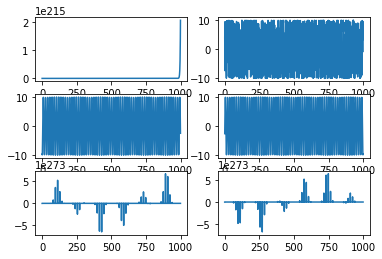

In [ ]:
W = 10 # 1/1000 Volumatic # 10 lines # 25 particles # 1 normal
f = 10
L = 1000

# x = np.linspace(0, 1, L)
# w1/10, f1/10 (Default/volume)
# w1, f1 (Default/string)
# w5, f5 (Default/particles)

# w1,f100 (DNA)
# w25,f25,f100 (Particles)
# w10,f10,f99 (Particles/Lines)
# w 1/1000,f1, f25 (Volumes)

# w1, f1/(2*np.pi) x = np.linspace(np.pi/2, 5*np.pi/2, L)

x = np.linspace(0, 1, L)
x = np.linspace(np.pi/2, 5*np.pi/2, L)

phase = -0/(4*f)

fig, axs = plt.subplots(3, 2)

axs[0,0].plot(E(x+phase,n)) # exponential
axs[1,1].plot(C(x+phase)) # cos
axs[1,0].plot(S(x+phase)) # sine

axs[0,1].plot(S(E(x+phase,n))) # electromagnetic spectrum

axs[2,1].plot(C(C(x+phase))) # electron beat
axs[2,0].plot(S(C(x+phase))) # heart beat

## Sphere

/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


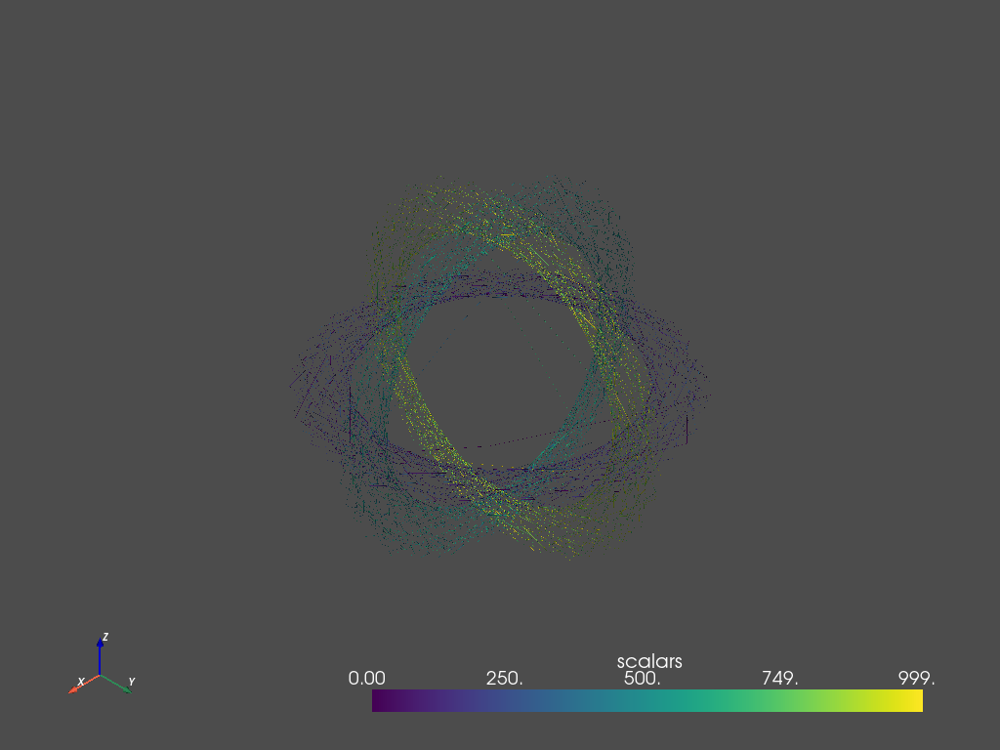

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 1
f = 2

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (S(f*theta))+(S(f*theta))
x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * C(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))





import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))






# Create spline with 1000 interpolation points
spline = pv.Spline(points.real, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


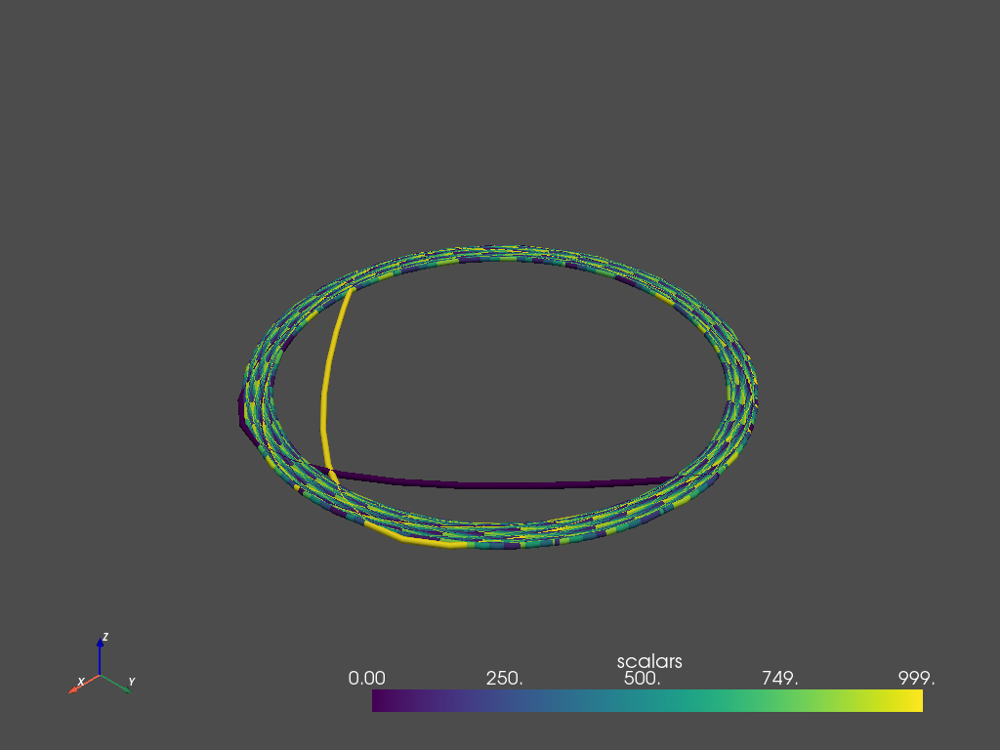

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 1
f = 99

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (S(f*theta))+(S(f*theta))
x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * C(theta)*A
points = np.column_stack((x, y, z))




# Create spline with 1000 interpolation points
spline = pv.Spline(points.real, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


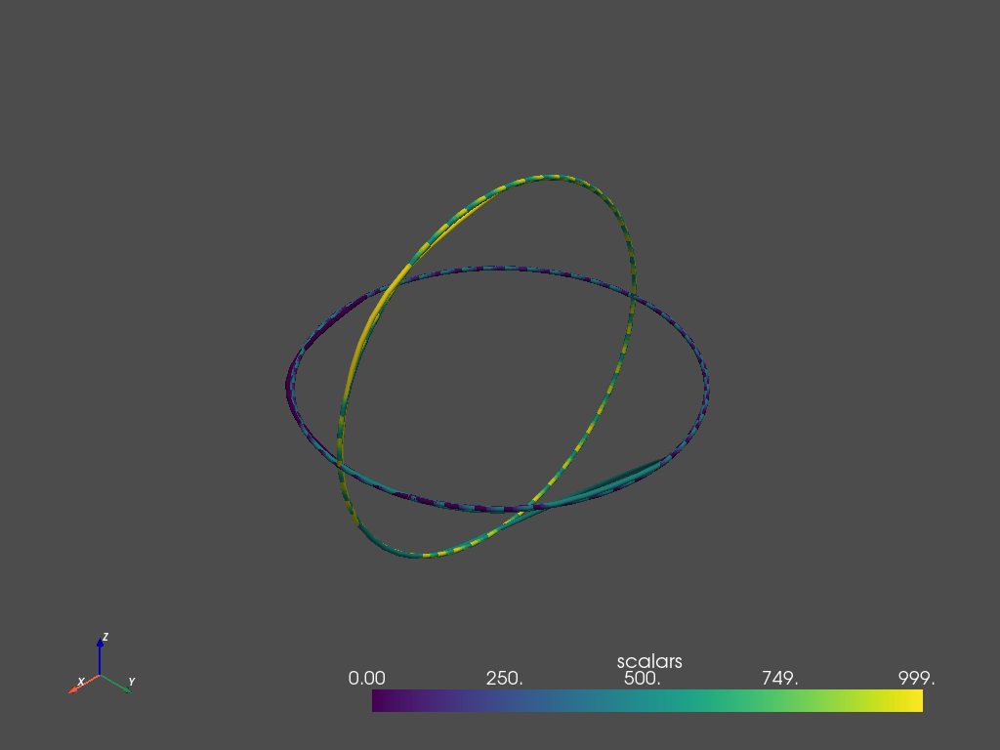

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 1
f = 5

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (S(f*theta))+(S(f*theta))
x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * C(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))






# Create spline with 1000 interpolation points
spline = pv.Spline(points.real, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


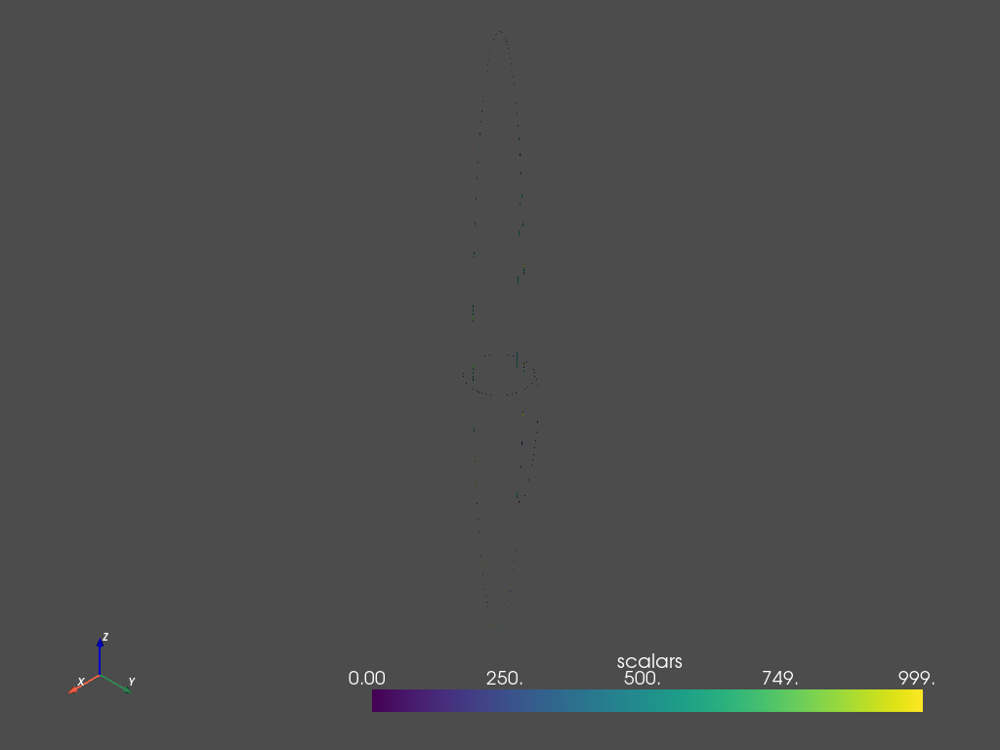

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 1/10
f = 100

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (S(f*theta))+(S(f*theta))
x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * C(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



# Create spline with 1000 interpolation points
spline = pv.Spline(points.real, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


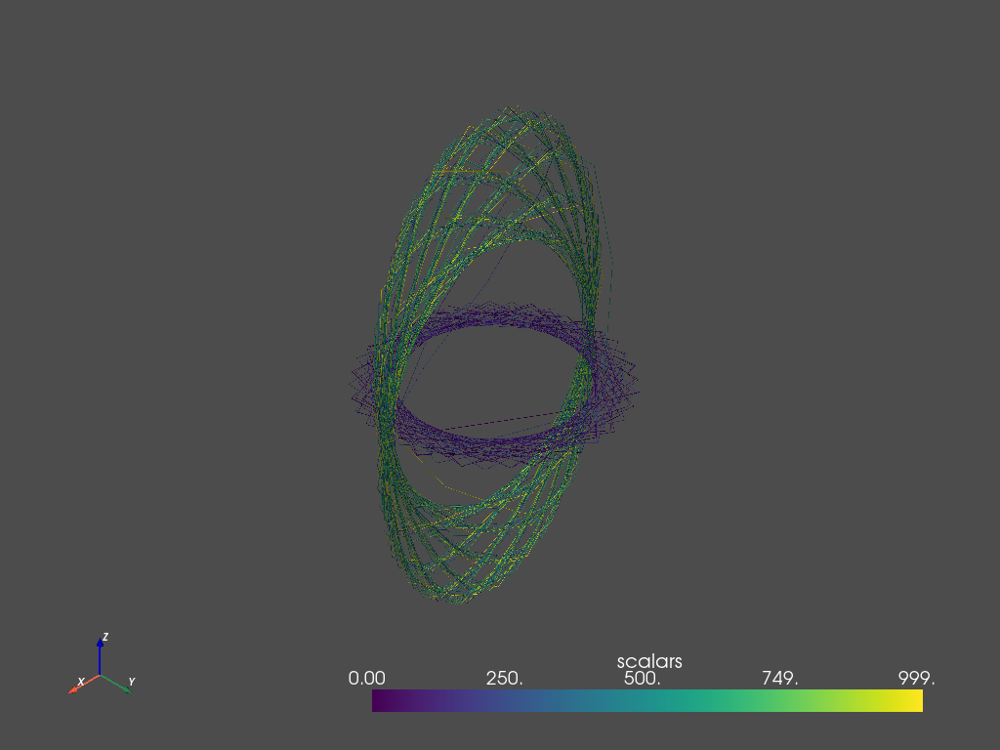

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 1/2
f = 2

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (S(f*theta))+(S(f*theta))
x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * C(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



# Create spline with 1000 interpolation points
spline = pv.Spline(points.real, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


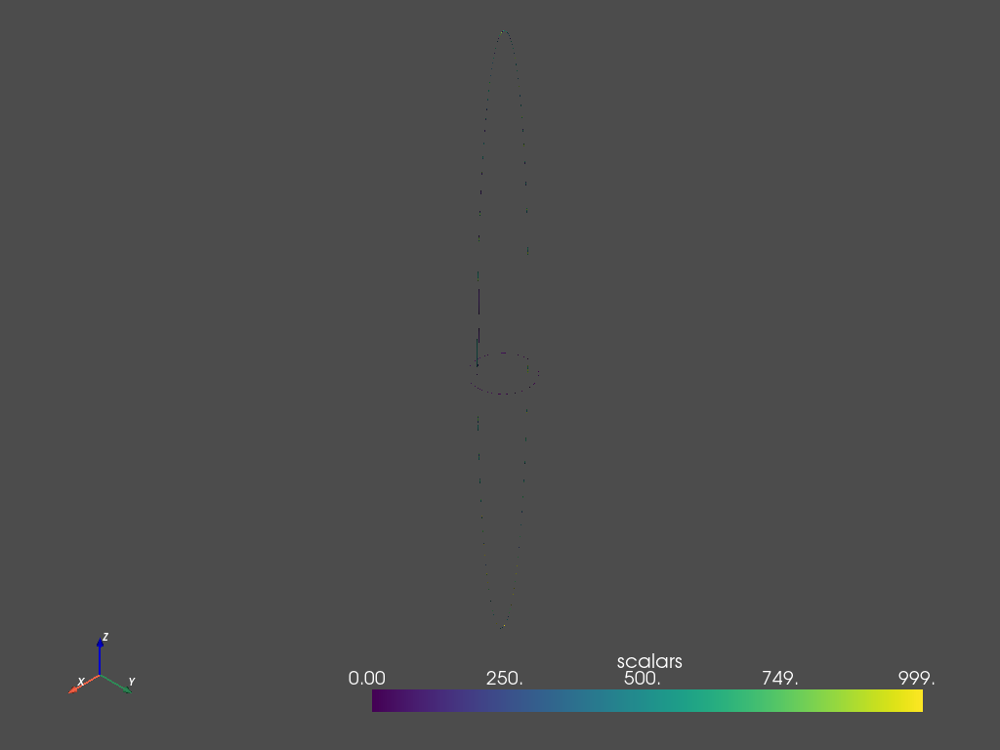

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 1/10
f = 10

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (S(f*theta))+(S(f*theta))
x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * C(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



# Create spline with 1000 interpolation points
spline = pv.Spline(points.real, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


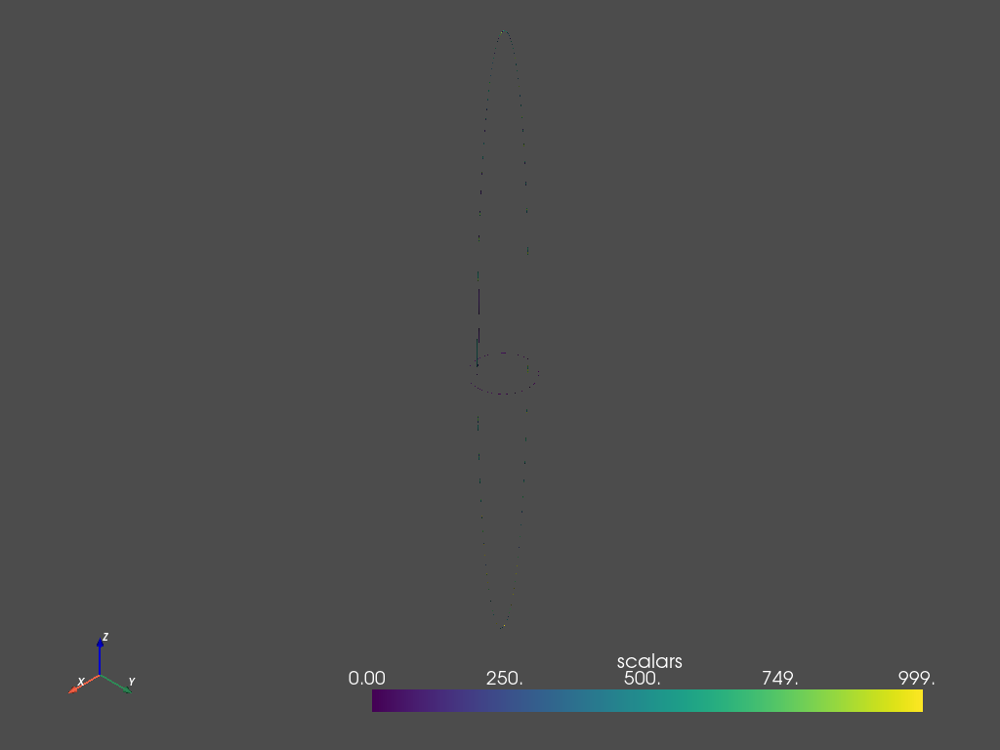

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 1/10
f = 10

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (S(f*theta))+(S(f*theta))
x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * C(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



# Create spline with 1000 interpolation points
spline = pv.Spline(points.real, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


## Rings

### Real

/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


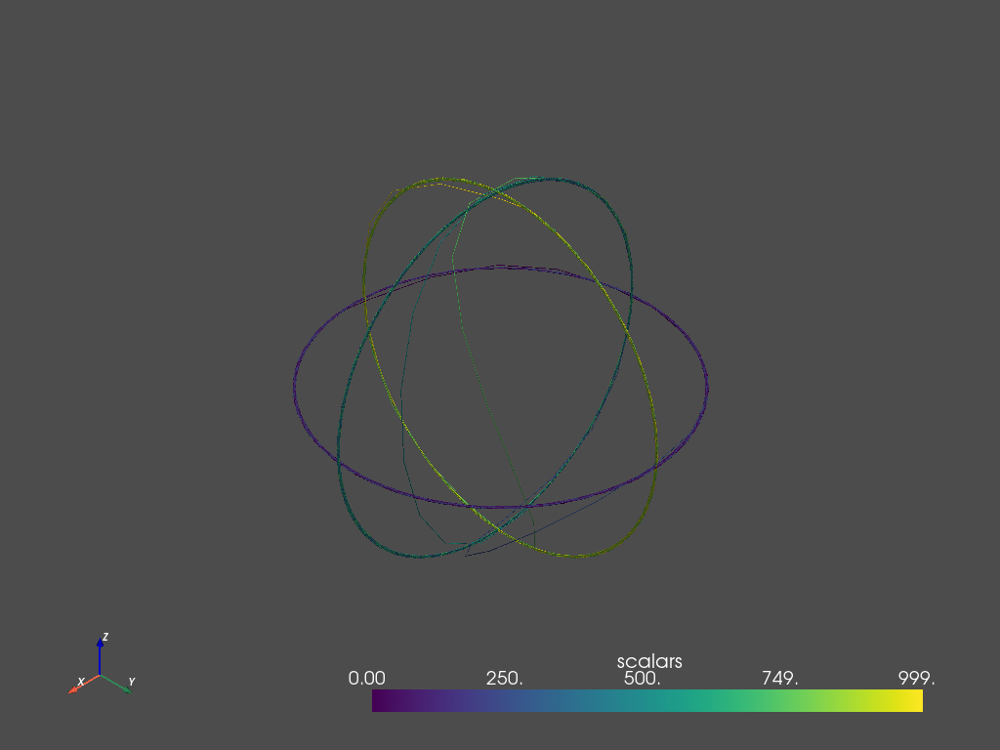

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 1
f = 1

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (S(f*theta))+(S(f*theta))
x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * C(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))



# Create spline with 1000 interpolation points
spline = pv.Spline(points.real, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


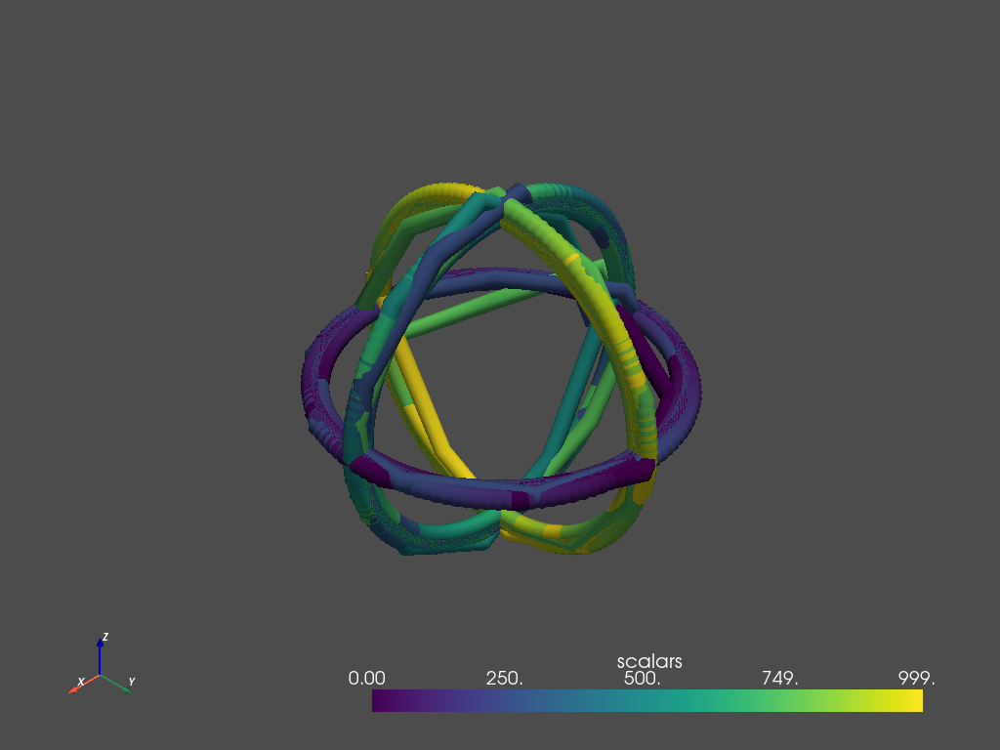

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 1
f = 25

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (S(f*theta))+(S(f*theta))
x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * C(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))



# Create spline with 1000 interpolation points
spline = pv.Spline(points.real, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


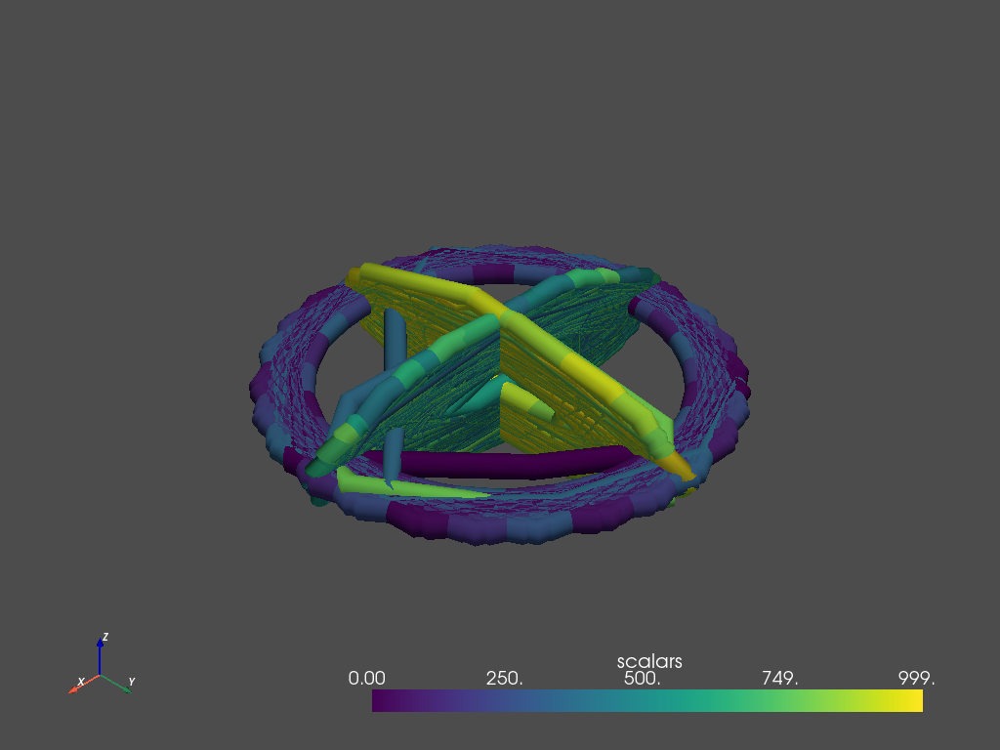

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 10
f = 20

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (S(f*theta))+(S(f*theta))
x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * C(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))



# Create spline with 1000 interpolation points
spline = pv.Spline(points.real, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


### Imaginary

/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


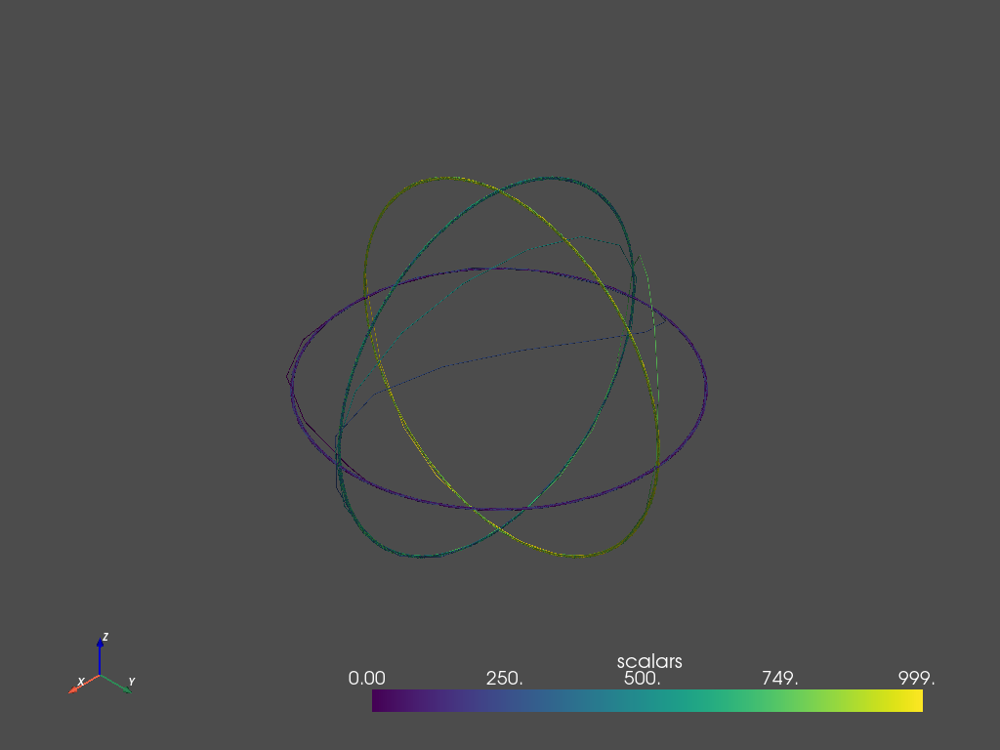

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 1
f = 1

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (S(f*theta))+(S(f*theta))
x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * C(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))






# Create spline with 1000 interpolation points
spline = pv.Spline(points.imag, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


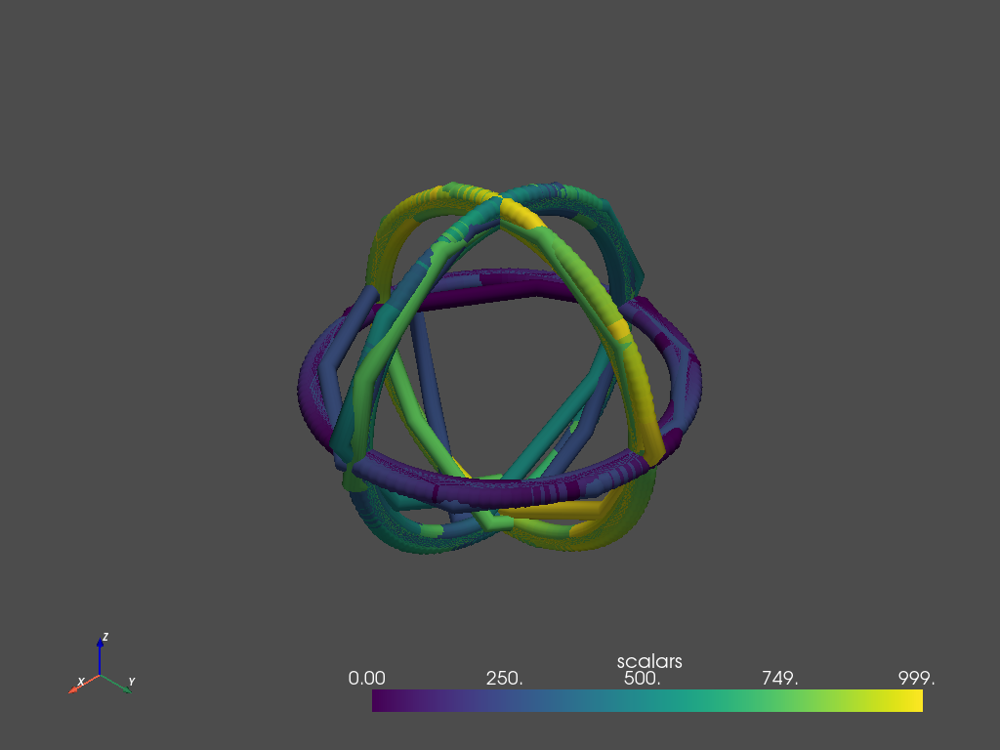

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 1
f = 25

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (S(f*theta))+(S(f*theta))
x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * C(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))



# Create spline with 1000 interpolation points
spline = pv.Spline(points.imag, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


## Two relative models

/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


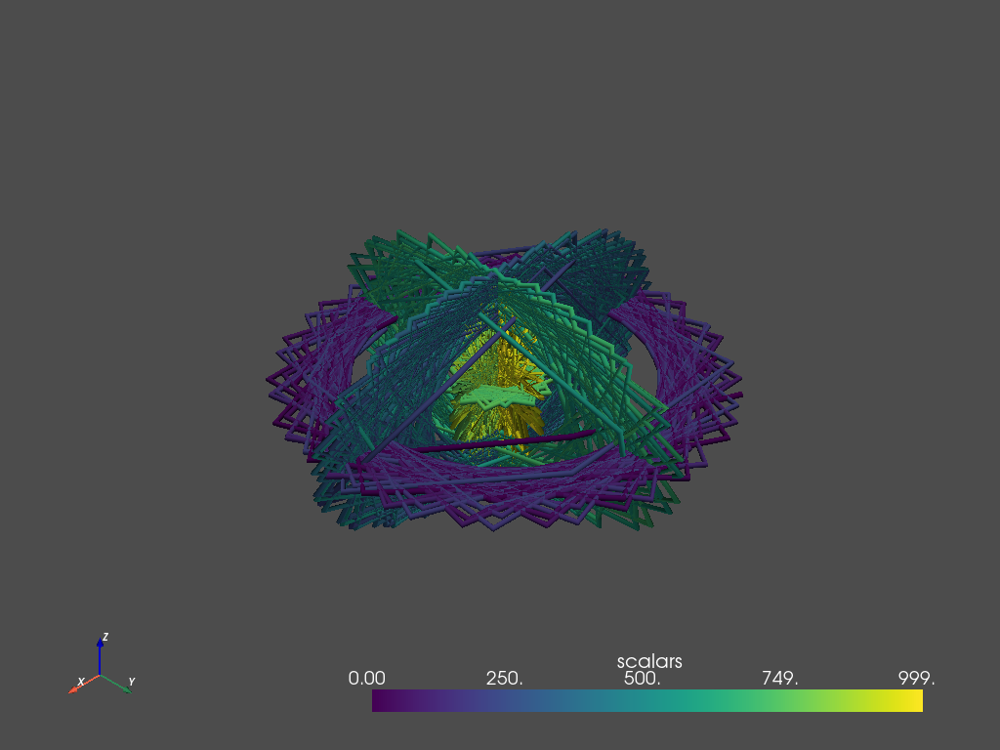

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 2
f = 2

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (S(f*theta))+(S(f*theta))
x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * C(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))



# object 2

A = 1/2
f = 2

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (S(f*theta))+(S(f*theta))
x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * C(theta)*A
points = np.concatenate((points,np.column_stack((x, y, z))))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))


# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points.real, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


## Object

In [ ]:
def objct2(points,A,f,n_points,X,Y,Z):

  T = 1/f
  # Horizontal ring


  theta = np.linspace(-np.pi, np.pi, n_points)
  z = np.linspace(0, 0, n_points)
  r = (S(f*theta))+(S(f*theta))
  x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
  y = r * C(theta)*A
  if len(points) == 1:
    points = np.column_stack((x+X, y+Y, z+Z))
  else:
    points = np.concatenate((points,np.column_stack((x+X, y+Y, z+Z))))
    

  # Vertical ring

  theta = np.linspace(-np.pi, np.pi, n_points)
  r = S(f*theta)+S(f*theta)
  z = r * C(theta) 
  x = A * r * S(theta)
  y = A * np.linspace(0, 0, n_points)
  points = np.concatenate((points,np.column_stack((x+X, y+Y, z+Z))))


  theta = np.linspace(-np.pi, np.pi, n_points)
  r = S(f*theta)+S(f*theta)
  z = r * C(theta) 
  x = A * r * S(theta)
  y = A * np.linspace(0, 0, n_points)
  points = np.concatenate((points,np.column_stack((x+X, y+Y, z+Z))))

  import scipy

  rotation_degrees = 90
  rotation_radians = np.radians(rotation_degrees)
  rotation_axis = np.array([0, 0, 1])

  rotation_vector = rotation_radians * rotation_axis
  rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
  rotated_vec = rotation.apply(np.column_stack((x, y, z)))
  rotated_vec[:,0] = rotated_vec[:,0] + X  # xaxis
  rotated_vec[:,1] = rotated_vec[:,1] + Y  # yaxis
  rotated_vec[:,2] = rotated_vec[:,2] + Z  # zaxis
  points = np.concatenate((points,rotated_vec))

  return points

## Modelling

/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


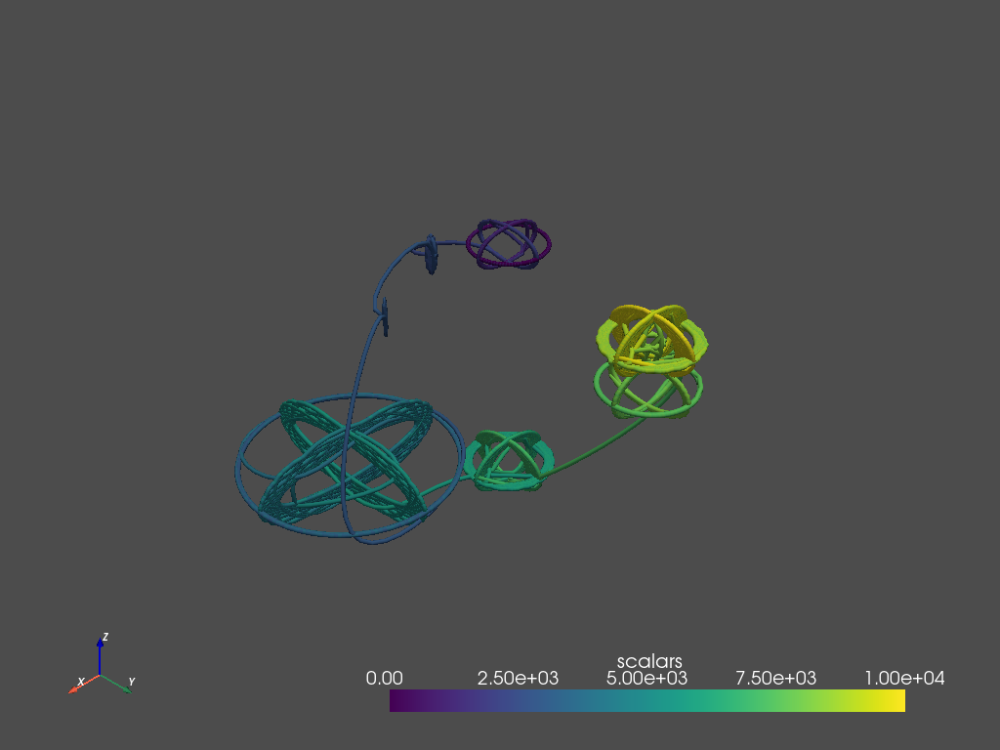

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 2
f = 2
n_points = 400

points = [0]

points = objct2(points,A,f,n_points,0,0,0)



# object 2

A = 1/10
f = 20
X = [10,0,3]
n_points = 100

points = objct2(points,A,f,n_points,X[0],X[1],X[2])


# object 3

A = 1/100
f = 10
X = [20,5,3]
n_points = 100

points = objct2(points,A,f,n_points,X[0],X[1],X[2])


# object 4

A = 5
f = 90
X = [25,5,-10]
n_points = 100

points = objct2(points,A,f,n_points,X[0],X[1],X[2])


# object 5

A = 2
f = 20
X = [15,15,-10]
n_points = 100

points = objct2(points,A,f,n_points,X[0],X[1],X[2])


# object 6

A = 2
f = 50
X = [15,30,6]
n_points = 100

points = objct2(points,A,f,n_points,X[0],X[1],X[2])


# object 6

A = 1/2
f = 10
X = [15,30,10]
n_points = 100

points = objct2(points,A,f,n_points,X[0],X[1],X[2])


# object 6

A = 2
f = 20
X = [15,30,10]
n_points = 100

points = objct2(points,A,f,n_points,X[0],X[1],X[2])



# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points.real, 10000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);

## Model planets

In [ ]:
n = 2 # for Earth

print(np.log(eT[n]))
print(np.log(e_orb[n]))
print(np.log(e_free[n]))

print(np.log(n_freeMG[n]))
print(np.log(n_freeTH[n]))

print(np.log(Volume[n]))

117.99084612076264
61.26330295482904
117.99084612076264
98.1356125550449
117.99084611838042
48.43420657605083


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: overflow encountered in double_scalars
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


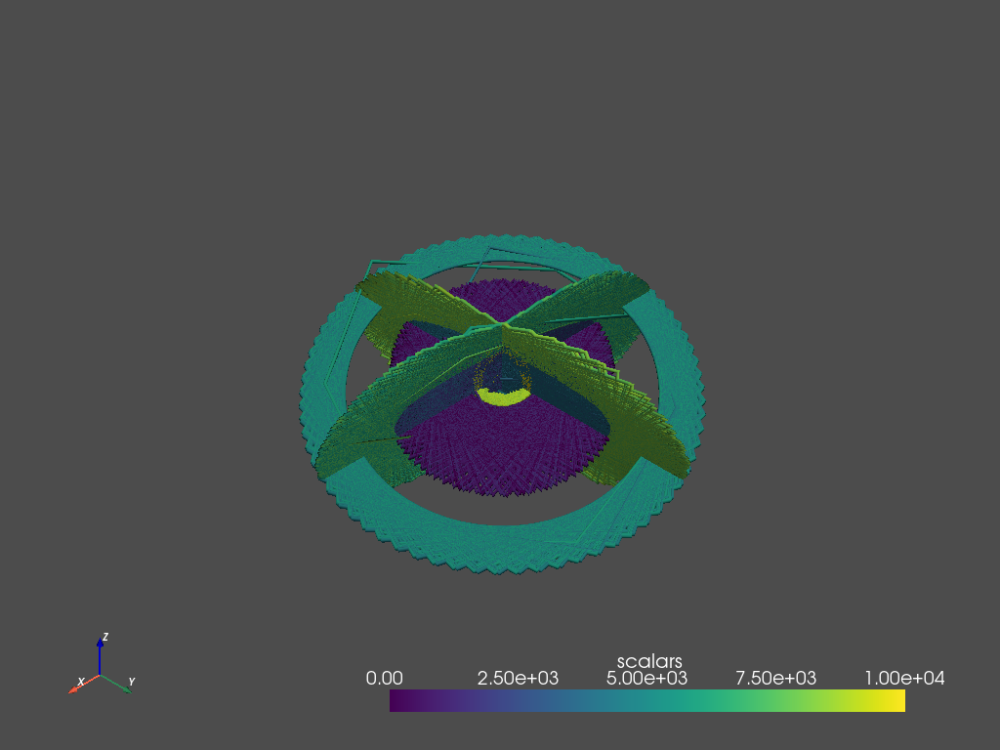

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

points = [0]

# Earth
n=2

# Magnetic electrons

A = np.log(n_freeMG[n]/e_orb[n])/10
f = np.log(n_freeMG[n])
X = [0,0,0]
n_points = 1000

points = objct2(points,A,f,n_points,X[0],X[1],X[2])


# Thermal electrons

A = np.log(n_freeTH[n]/e_orb[n])/10
f = np.log(n_freeTH[n])
X = [0,0,0]
n_points = 1000

points = objct2(points,A,f,n_points,X[0],X[1],X[2])


# Orbital electrons

A = 1
f = np.log(e_orb[n])
X = [0,0,0]
n_points = 1000

points = objct2(points,A,f,n_points,X[0],X[1],X[2])





# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points.imag, 10000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: overflow encountered in double_scalars
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


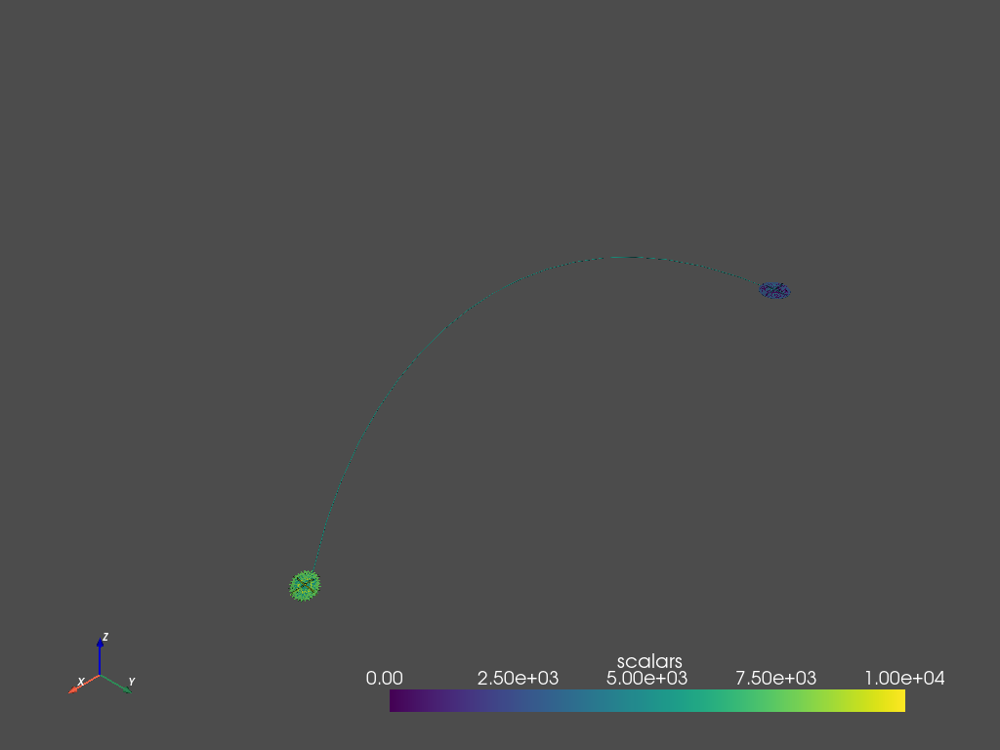

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

points = [0]

# Sun
n=9

# Magnetic electrons

A = np.log(n_freeMG[n])
f = np.log(n_freeMG[n])
X = [0,0,0]
n_points = 1000

points = objct2(points,A,f,n_points,X[0],X[1],X[2])


# Thermal electrons

A = np.log(n_freeTH[n])
f = np.log(n_freeTH[n])
X = [0,0,0]
n_points = 1000

points = objct2(points,A,f,n_points,X[0],X[1],X[2])


# Orbital electrons

A = np.log(e_orb[n])
f = np.log(e_orb[n])
X = [0,0,0]
n_points = 1000

points = objct2(points,A,f,n_points,X[0],X[1],X[2])


# Earth
n=2

# Magnetic electrons

A = np.log(n_freeMG[n])
f = np.log(n_freeMG[n])
X = [10000*Sun_distance[n],0,0]
n_points = 1000

points = objct2(points,A,f,n_points,X[0],X[1],X[2])


# Thermal electrons

A = np.log(n_freeTH[n])
f = np.log(n_freeTH[n])
n_points = 1000

points = objct2(points,A,f,n_points,X[0],X[1],X[2])


# Orbital electrons

A = np.log(e_orb[n])
f = np.log(e_orb[n])
n_points = 1000

points = objct2(points,A,f,n_points,X[0],X[1],X[2])


# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points.real, 10000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);

## Forces

In [ ]:
def objct2(points,A,f,n_points,X,Y,Z,object_force):

  T = 1/f
  # Horizontal ring


  theta = np.linspace(-np.pi, np.pi, n_points)
  z = np.linspace(0, 0, n_points)
  r = (S(f*theta))+(S(f*theta)) + object_force
  x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
  y = r * C(theta)*A
  if len(points) == 1:
    points = np.column_stack((x+X, y+Y, z+Z))
  else:
    points = np.concatenate((points,np.column_stack((x+X, y+Y, z+Z))))
    

  # Vertical ring

  theta = np.linspace(-np.pi, np.pi, n_points)
  r = S(f*theta)+S(f*theta)
  z = r * C(theta) 
  x = A * r * S(theta)
  y = A * np.linspace(0, 0, n_points)
  points = np.concatenate((points,np.column_stack((x+X, y+Y, z+Z))))


  theta = np.linspace(-np.pi, np.pi, n_points)
  r = S(f*theta)+S(f*theta)
  z = r * C(theta) 
  x = A * r * S(theta)
  y = A * np.linspace(0, 0, n_points)
  points = np.concatenate((points,np.column_stack((x+X, y+Y, z+Z))))

  import scipy

  rotation_degrees = 90
  rotation_radians = np.radians(rotation_degrees)
  rotation_axis = np.array([0, 0, 1])

  rotation_vector = rotation_radians * rotation_axis
  rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
  rotated_vec = rotation.apply(np.column_stack((x, y, z)))
  rotated_vec[:,0] = rotated_vec[:,0] + X  # xaxis
  rotated_vec[:,1] = rotated_vec[:,1] + Y  # yaxis
  rotated_vec[:,2] = rotated_vec[:,2] + Z  # zaxis
  points = np.concatenate((points,rotated_vec))

  return points

### 2 bodies

19


/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


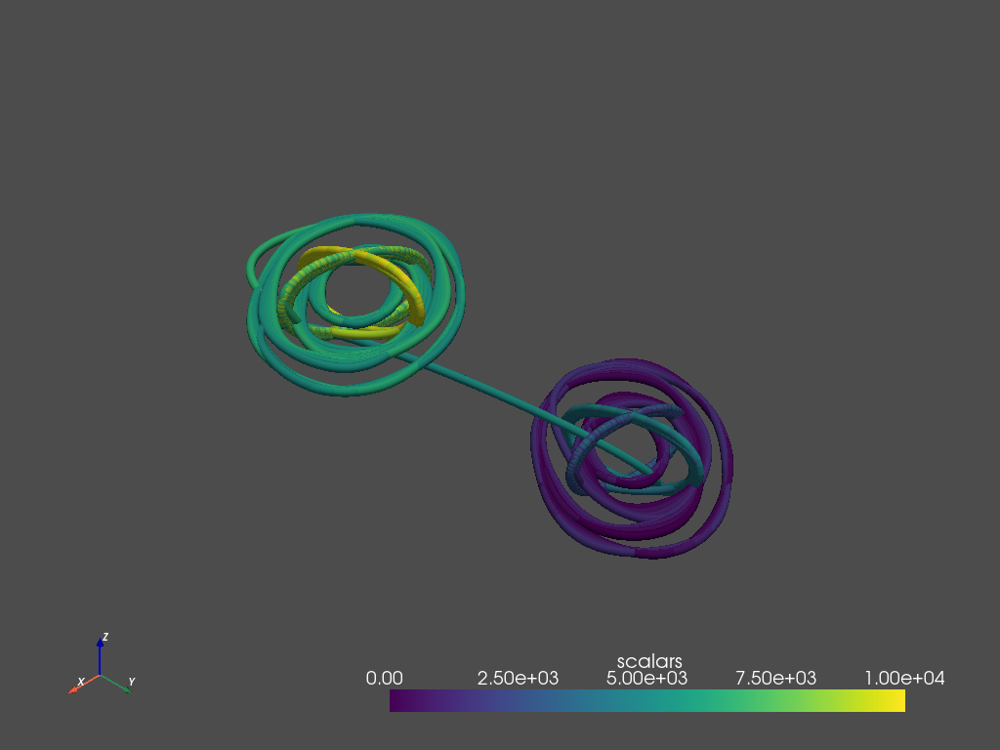

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

n_points = 100
points = [0]
theta = np.linspace(-np.pi, np.pi, n_points)

X2 = [10,1,8]
X1 = [2,10,0]


if X2[0] != X1[0]:
  angle = np.arctan((X2[1]-X1[1])/(X2[0]-X1[0]))
else:
  angle = 0

print(sum(X2))

a = 0
if X2[0]<X1[0]:
  a = 1

# object

A = 2
f = 10



force12 = S(theta+angle+a*np.pi)

points = objct2(points,A,f,n_points,X1[0],X1[1],X1[2],force12)


# object

A = 2
f = 10


force21 = S(theta+angle+(1-a)*np.pi)

points = objct2(points,A,f,n_points,X2[0],X2[1],X2[2],force21)



# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points.real, 10000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);

## Planets with forces

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: overflow encountered in double_scalars
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


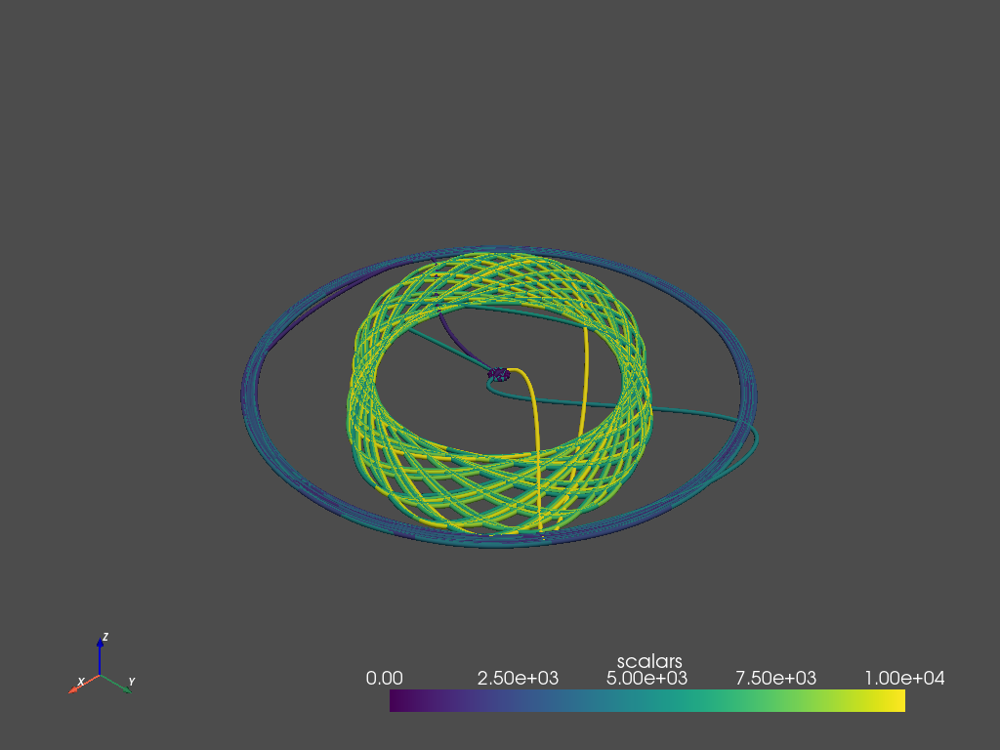

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

points = [0]

X1 = [0,0,0]
X2 = [Sun_distance[n],0,0]

distance = np.sqrt((X2[0]-X1[0])**2+(X2[1]-X1[1])**2+(X2[2]-X1[2])**2)/1000

cm = n_freeMG[2]*n_freeMG[9]*(1.6E-19)**2
cth = n_freeTH[2]*n_freeTH[9]*(1.6E-19)**2
co = e_orb[2]*e_orb[9]*(1.6E-19)**2

Fm = np.log(8.9875517923E9*cm/distance**2)*0
Fth = np.log(8.9875517923E9*cth/distance**2)*0
Fo = np.log(8.9875517923E9*co/distance**2)


if X2[0] != X1[0]:
  angle = np.arctan((X2[1]-X1[1])/(X2[0]-X1[0]))
else:
  angle = 0

a = 0
if X2[0]<X1[0]:
  a = 1

# Sun
n=9

# Magnetic electrons

A = np.log(n_freeMG[n])
f = np.log(n_freeMG[n])
X = X1
n_points = 100

forcem12 = Fm*S(theta+angle+a*np.pi)

points = objct2(points,A,f,n_points,X[0],X[1],X[2],forcem12)


# Thermal electrons

A = np.log(n_freeTH[n])
f = np.log(n_freeTH[n])
n_points = 100

forceth12 = Fth*S(theta+angle+a*np.pi)

points = objct2(points,A,f,n_points,X[0],X[1],X[2],forceth12)


# Orbital electrons

A = np.log(e_orb[n])
f = np.log(e_orb[n])
n_points = 100

forceo12 = Fo*S(theta+angle+a*np.pi)

points = objct2(points,A,f,n_points,X[0],X[1],X[2],forceo12)


# Earth
n=2

# Magnetic electrons

A = np.log(n_freeMG[n])
f = np.log(n_freeMG[n])
X = X2
n_points = 100

forcem21 = Fm*S(theta+angle+(1-a)*np.pi)

points = objct2(points,A,f,n_points,X[0],X[1],X[2],forcem21)


# Thermal electrons

A = np.log(n_freeTH[n])
f = np.log(n_freeTH[n])
n_points = 100

forceth21 = Fth*S(theta+angle+(1-a)*np.pi)

points = objct2(points,A,f,n_points,X[0],X[1],X[2],forceth21)


# Orbital electrons

A = np.log(e_orb[n])
f = np.log(e_orb[n])
n_points = 100

forceo21 = Fo*S(theta+angle+(1-a)*np.pi)

points = objct2(points,A,f,n_points,X[0],X[1],X[2],forceo21)


# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points.real, 10000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=10*5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);

In [ ]:
n = 2 # for Earth

print(np.log(eT[n]))
print(np.log(e_orb[n]))
print(np.log(e_free[n]))

print(np.log(n_freeMG[n]))
print(np.log(n_freeTH[n]))

print(np.log(Volume[n]))

117.99084612076264
61.26330295482904
117.99084612076264
98.1356125550449
117.99084611838042
48.43420657605083


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: overflow encountered in double_scalars
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


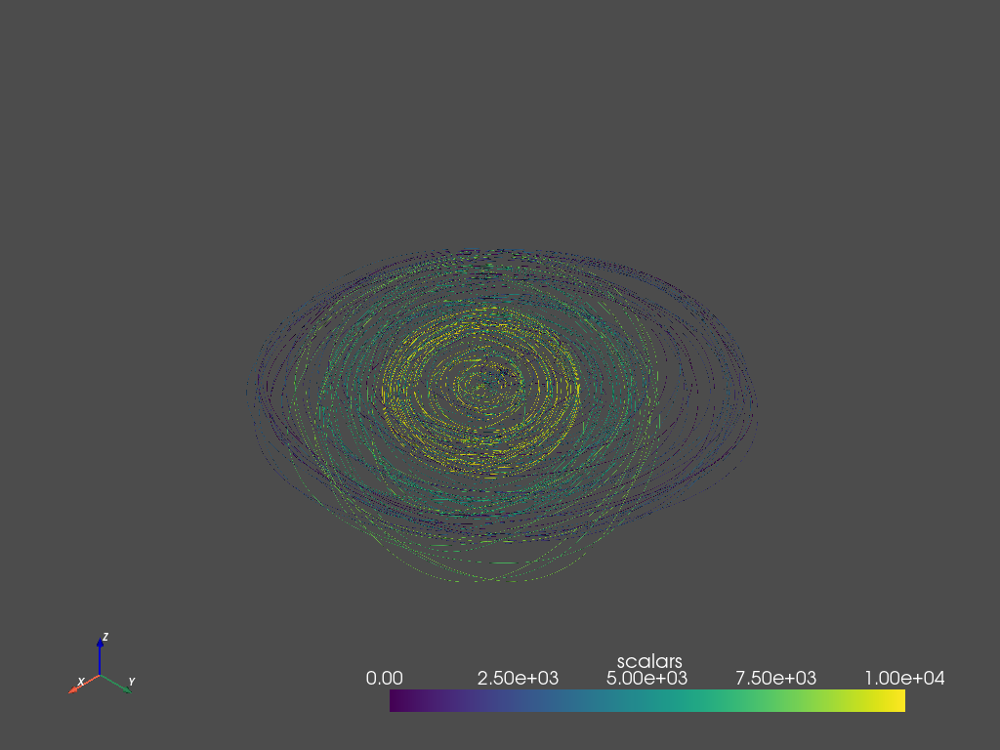

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

points = [0]

X1 = [0,0,0]
X2 = [1000*Sun_distance[n],0,0]

charge = e_orb[2]*e_orb[9]*(1.6E-19)**2
distance = np.sqrt((X2[0]-X1[0])**2+(X2[1]-X1[1])**2+(X2[2]-X1[2])**2)
F = np.log(8.9875517923E9*charge/distance**2)

angle = np.arctan((X2[1]-X1[1])/(X2[0]-X1[0]))
if X2[0] == X1[0]:
  angle = 0

a = 0
if X2[0]<X1[0]:
  a = 1

# Sun
n=9

# Magnetic electrons

A = np.log(n_freeMG[n])
f = np.log(n_freeMG[n])
X = X1
n_points = 100

force12 = F*np.sin(theta+angle+a*np.pi)

points = objct2(points,A,f,n_points,X[0],X[1],X[2],force12)


# Thermal electrons

A = np.log(n_freeTH[n])
f = np.log(n_freeTH[n])
n_points = 100

points = objct2(points,A,f,n_points,X[0],X[1],X[2],force12)


# Orbital electrons

A = np.log(e_orb[n])
f = np.log(e_orb[n])
n_points = 100

points = objct2(points,A,f,n_points,X[0],X[1],X[2],force12)


# Earth
n=2

# Magnetic electrons

A = np.log(n_freeMG[n])
f = np.log(n_freeMG[n])
X = X2
n_points = 100

force21 = F*np.sin(theta+angle+(1-a)*np.pi)

points = objct2(points,A,f,n_points,X[0],X[1],X[2],force21)


# Thermal electrons

A = np.log(n_freeTH[n])
f = np.log(n_freeTH[n])
n_points = 100

points = objct2(points,A,f,n_points,X[0],X[1],X[2],force21)


# Orbital electrons

A = np.log(e_orb[n])
f = np.log(e_orb[n])
n_points = 100

points = objct2(points,A,f,n_points,X[0],X[1],X[2],force21)


# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points.real, 10000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);

## Particles

/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


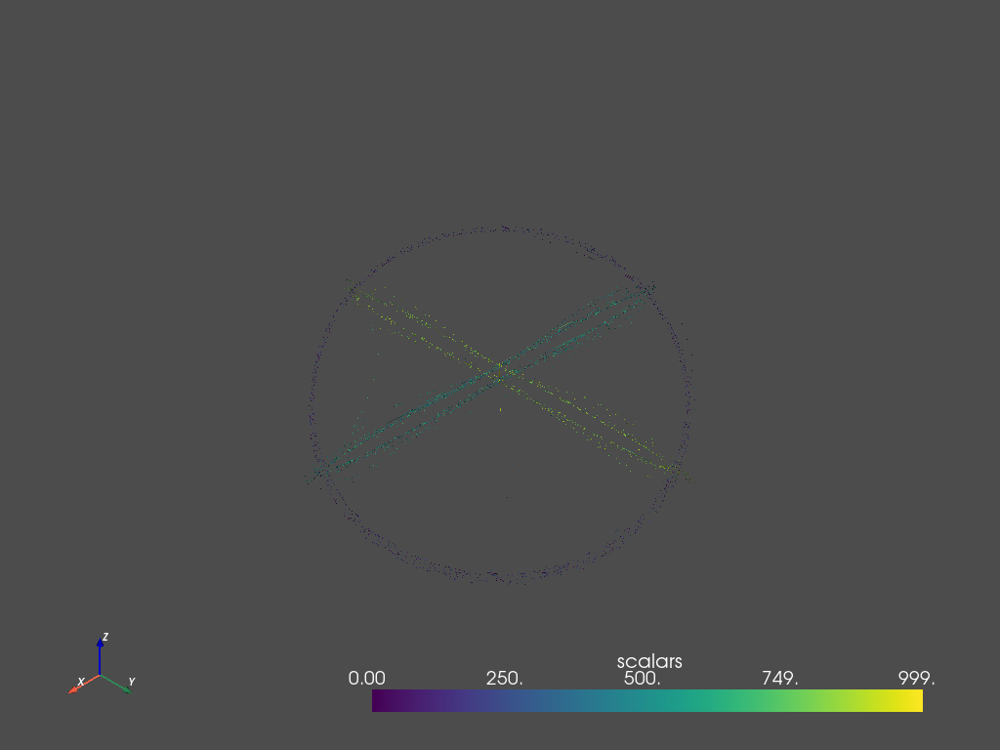

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 20
f = 40

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (S(f*theta))+(S(f*theta))
x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * C(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * np.cos(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))



# object 2

A = 1/20
f = 20

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (S(f*theta))+(S(f*theta))
x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * C(theta)*A
points = np.concatenate((points,np.column_stack((x, y, z))))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))


# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points.real, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


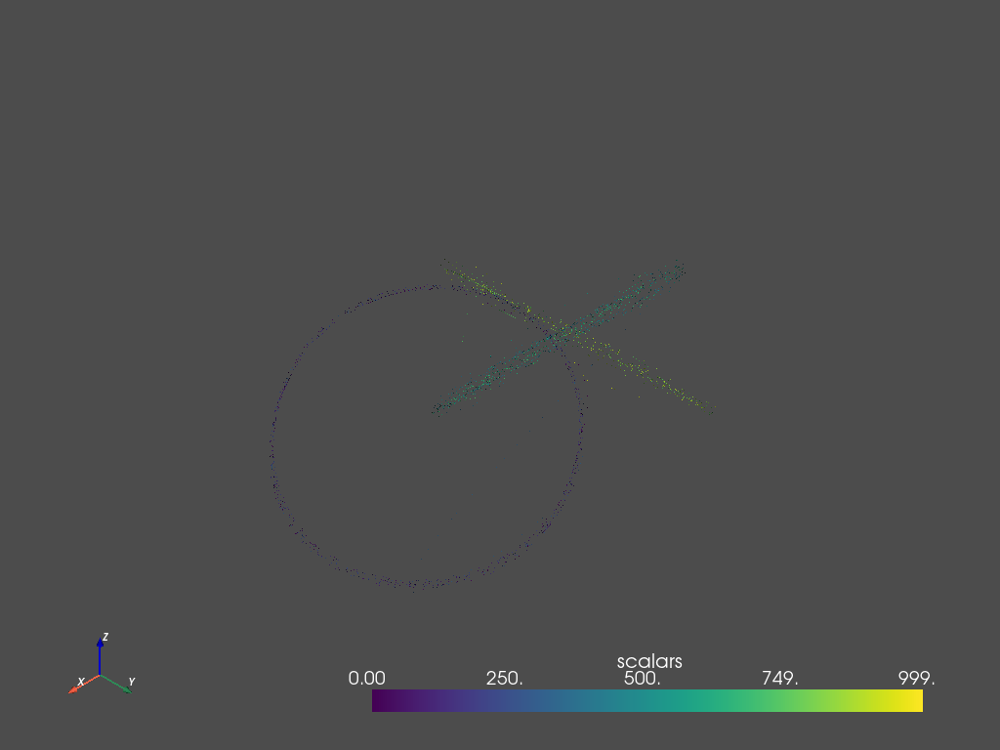

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 20
f = 40

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (S(f*theta))+(S(f*theta))
x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * C(theta)*A
points = np.column_stack((x+2*A, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * np.cos(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * C(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))



# object 2

A = 1/20
f = 20

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (S(f*theta))+(S(f*theta))
x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * C(theta)*A
points = np.concatenate((points,np.column_stack((x, y, z))))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))


# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points.real, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


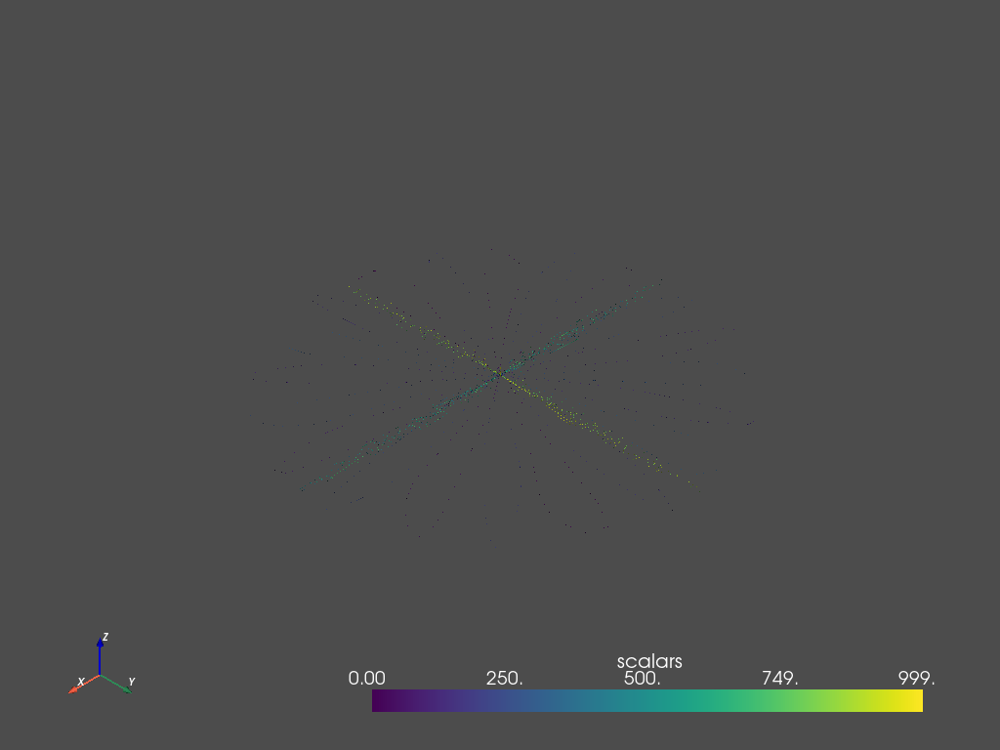

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason



# object 1

A = 20
f = 10

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (np.sin(f*theta))+(np.sin(f*theta))
x = r * np.sin(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * np.cos(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))



# object 2

A = 1/20
f = 20

T = 1/f


# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (np.sin(f*theta))+(np.sin(f*theta))
x = r * np.sin(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * np.cos(theta)*A
points = np.concatenate((points,np.column_stack((x, y, z))))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x, y, z)))


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))


# 3D plot

# Create spline with 1000 interpolation points
spline = pv.Spline(points, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


## Curved Line

/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


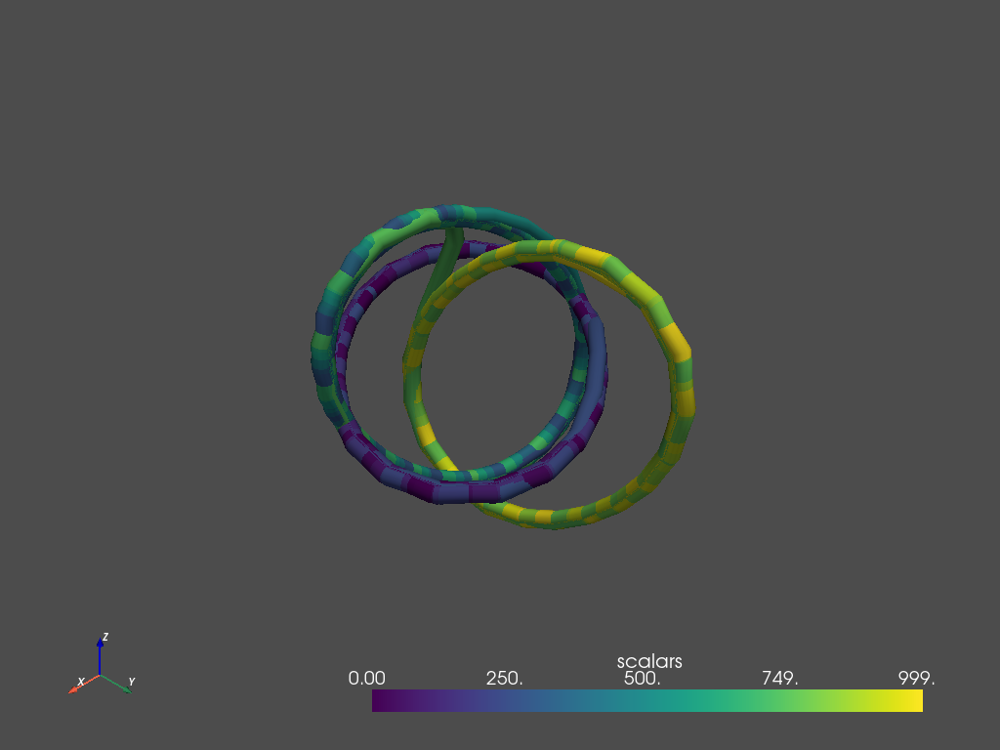

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

A = 1
f = 20

T = 1/f

# Horizontal ring

n_points = 100
theta = np.linspace(-1, 1, n_points)
z = np.linspace(0, 0, n_points)
r = (S(f*theta))+(S(f*theta))
x = r * S(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * C(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

#theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


#theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x+A, y, z))) # changes to line by translation of A


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = S(f*theta)+S(f*theta)
z = r * C(theta) 
x = A * r * S(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))

# Create spline with 1000 interpolation points
spline = pv.Spline(points.real, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


/usr/local/lib/python3.7/dist-packages/pyvista/jupyter/notebook.py:60: UserWarning: Failed to use notebook backend: 

Please install `ipyvtklink` to use this feature: https://github.com/Kitware/ipyvtklink

Falling back to a static output.
  warnings.warn(f'Failed to use notebook backend: \n\n{e}\n\n'


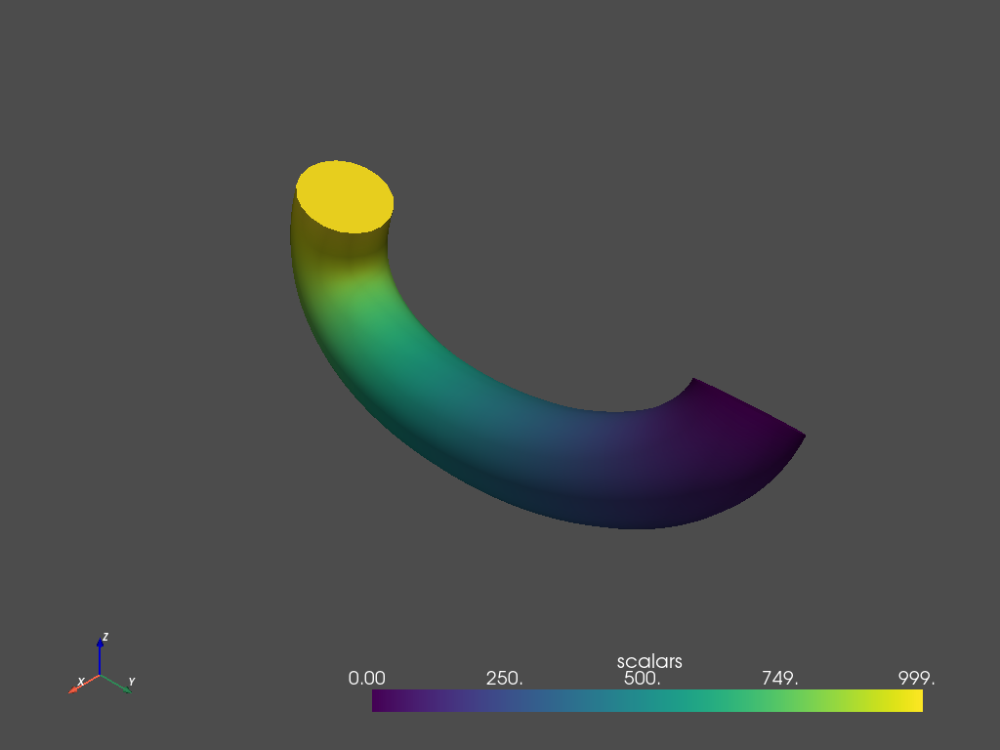

In [ ]:
### new cell spline example cell ###
pn.extension('vtk')  # this needs to be at the top of each cell for some reason

A = 9
f = 99

T = 1/f

# Horizontal ring

n_points = 100
theta = np.linspace(-np.pi, np.pi, n_points)
z = np.linspace(0, 0, n_points)
r = (np.sin(f*theta))+(np.sin(f*theta))
x = r * np.sin(theta)*A-A/(2*np.pi*f)**(f-1)
y = r * np.cos(theta)*A
points = np.column_stack((x, y, z))


# Vertical ring

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))


theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,np.column_stack((x, y, z))))



import scipy

rotation_degrees = 90
rotation_radians = np.radians(rotation_degrees)
rotation_axis = np.array([0, 0, 1])

rotation_vector = rotation_radians * rotation_axis
rotation = scipy.spatial.transform.Rotation.from_rotvec(rotation_vector)
rotated_vec = rotation.apply(np.column_stack((x-A, y, z))) # changes to line


# Vertical rotated by 90
angle = np.pi/2

theta = np.linspace(-np.pi, np.pi, n_points)
r = np.sin(f*theta)+np.sin(f*theta)
z = r * np.cos(theta) 
x = A * r * np.sin(theta)
y = A * np.linspace(0, 0, n_points)
points = np.concatenate((points,rotated_vec))



# Create spline with 1000 interpolation points
spline = pv.Spline(points, 1000)

# add scalars to spline and plot it
spline["scalars"] = np.arange(spline.n_points)
tube = spline.tube(radius=5*A*0.02)
tube.plot(smooth_shading=True, notebook=True);


# Exponential mathematics

## Initialise

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def factorial(x):
  factorial = 1
  if int(x) >= 1:
    for i in range (1,int(x)+1):
      factorial = factorial * i
  return factorial

In [ ]:
def exp(x,n):
  exp = 0
  for i in range (0,n):
    exp += (1/factorial(i))
  return exp**x


In [ ]:
n = 100

def E(x,n):
  return W*exp(2*f*np.pi*x,n)

def E2(x,n):
  return W*exp(2*f*np.pi*x-0.5j*np.pi,n)

def S(x):
  return W*exp(2*f*np.pi*x*1j-np.pi*0.5j,n)

def C(x):
  return W*exp(2*f*np.pi*x*1j,n)

def Electromagnetism(x):
  return S(E(x,n))

def ElectronWave(x):
  return C(C(x))

def LifeWave(x):
  return S(C(x))

## C wave and S wave comparison to cos and sine

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


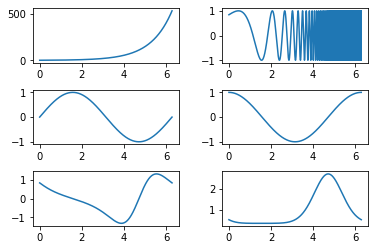

In [ ]:
W = 1 # 1/1000 Volumatic # 10 lines # 25 particles # 1 normal
f = 1/(2*np.pi)
L = 10000

# w1/10, f1/10 (Default/volume)
# w1, f1 (Default/string)
# w5, f5 (Default/particles)

# w1,f100 (DNA)
# w25,f25,f100 (Particles)
# w10,f10,f99 (Particles/Lines)
# w 1/1000,f1, f25 (Volumes)


x = np.linspace(0, 2*np.pi, L)
#x = np.linspace(0, 1, L)

phase = -0/(4*f)

fig, axs = plt.subplots(3, 2)
plt.subplots_adjust(wspace=0.3, hspace=0.5)

axs[0,0].plot(x,E(x+phase,n)) # exponential
axs[1,1].plot(x,C(x+phase)) # cos
axs[1,0].plot(x,S(x+phase)) # sine

axs[0,1].plot(x,S(E(x+phase,n))) # electromagnetic spectrum

axs[2,1].plot(x,C(C(x+phase))) # electron beat
axs[2,0].plot(x,S(C(x+phase))) # heart beat

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


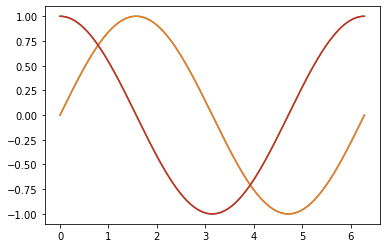

In [ ]:
plt.plot(x,S(x))
plt.plot(x,np.sin(x))

plt.plot(x,C(x))
plt.plot(x,np.cos(x))



/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


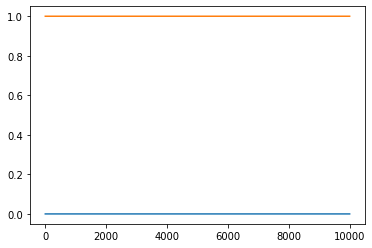

In [ ]:
plt.plot(C(x)**2+S(x)**2)

plt.plot(np.cos(x)**2+np.sin(x)**2)

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


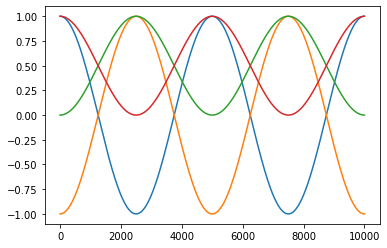

In [ ]:
plt.plot(C(x)**2)
plt.plot(S(x)**2)

plt.plot(np.sin(x)**2)
plt.plot(np.cos(x)**2)

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


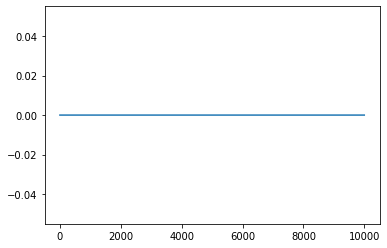

In [ ]:
plt.plot(np.sin(x*1j))
#plt.plot(np.cos(x*1j))
#plt.plot(C(x*1j))
#plt.plot(S(x*1j))

## Discrete exponential increase

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


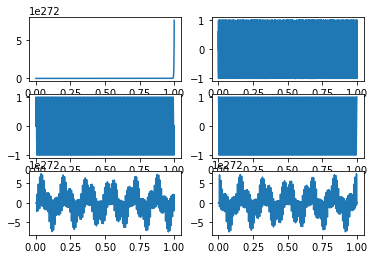

In [ ]:
W = 1 # 1/1000 Volumatic # 10 lines # 25 particles # 1 normal
f = 100
L = 10000

# w1/10, f1/10 (Default/volume)
# w1, f1 (Default/string)
# w5, f5 (Default/particles)

# w1,f100 (DNA)
# w25,f25,f100 (Particles)
# w10,f10,f99 (Particles/Lines)
# w 1/1000,f1, f25 (Volumes)


x = np.linspace(0, 1, L)
#x = np.linspace(np.pi/2, 5*np.pi/2, L)

phase = -0/(4*f)

fig, axs = plt.subplots(3, 2)

axs[0,0].plot(x,E(x+phase,n)) # exponential
axs[1,1].plot(x,C(x+phase)) # cos
axs[1,0].plot(x,S(x+phase)) # sine

axs[0,1].plot(x,S(E(x+phase,n))) # electromagnetic spectrum

axs[2,1].plot(x,C(C(x+phase))) # electron beat
axs[2,0].plot(x,S(C(x+phase))) # heart beat

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


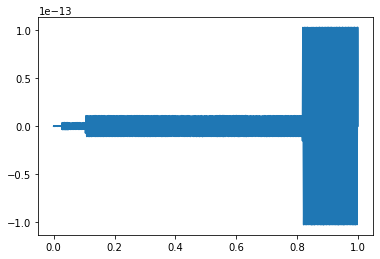

In [ ]:
plt.plot(x,C(x)**2+S(x)**2)

## Comparison to ECG data

### Initiate

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

#%cd /content/drive/MyDrive/Machine Learning Ideas/ECG data

Mounted at /content/drive


In [ ]:
# ECG data
with open("/content/drive/MyDrive/Machine Learning Ideas/Quantum Relativity/ECG data/mitbih_train.csv") as file_name:
    ecg_array = np.loadtxt(file_name, delimiter=",")

FileNotFoundError: ignored

In [ ]:
# C and S wave comparison

ecg_array

### Analysis

In [ ]:
plt.plot(ecg_array[0,:]);

In [ ]:
W = 1/2 # 1/1000 Volumatic # 10 lines # 25 particles # 1 normal
W2 = 0.0022

a = 1  #  stretch in x
c = 0  # elevation

f = 2.2
L = 188

x = np.linspace(0, 1, L)

phase = 0.35 #-0/(4*f)

plt.plot(x*180,W2*S(C(a*x+phase))+c, linestyle = '--', label = 'Generated'); # heart beat

plt.plot(ecg_array[0,:], label = 'ECG');

plt.legend()

In [ ]:
W = 1/2 # 1/1000 Volumatic # 10 lines # 25 particles # 1 normal
f = 2.2 

W2 = 0.0028

a1 = 1  #  stretch in x
c1 = 0  # elevation
a2 = 0.4  #  stretch in x
c2 = 0.1  # elevation


L = 188
x = np.linspace(0, 1, L)

phase1 = 0.345 #-0/(4*f)
phase2 = 0.225 #-0/(4*f)

plt.plot(x*180,W2*S(C(a1*x+phase1))+c1, linestyle = '--', label = 'Generated'); # heart beat

W = 1/4
f = 2.2*2
plt.plot(x*180,W2*C(C(a2*x+phase2))+c2, linestyle = '--', label = 'Generated'); # electronic beat

plt.plot(ecg_array[0,:], label = 'ECG');

plt.legend()

In [ ]:
L = 188
x = np.linspace(0, 1, L)

W = 1/2 # 1/1000 Volumatic # 10 lines # 25 particles # 1 normal
f = 2.2 

W2 = 0.0028
a1 = 1  #  stretch in x
c1 = 0  # elevation
phase1 = 0.345

beat1 = W2*S(C(a1*x+phase1))+c1

W = 1/4
f = 2.2*2

W3 = 0.0022
a2 = 0.4  #  stretch in x
c2 = 0.1  # elevation
phase2 = 0.225

beat2 = W3*C(C(a2*x+phase2))+c2


plt.plot(x*180,beat1+beat2, linestyle = '--', label = 'Generated'); # electronic beat
plt.plot(ecg_array[0,:], label = 'ECG');
plt.legend()

### Machine learning

#### Initialise

In [ ]:
# Machine learning to update parameters efficiently

def beat_gen_analysis(W1,W2,a,c,f1,phase,ecg):


  n = 100

  def E(x,n):
    return W*exp(2*f*np.pi*x,n)

  def E2(x,n):
    return W*exp(2*f*np.pi*x-0.5j*np.pi,n)

  def S(x):
    return W*exp(2*f*np.pi*x*1j-np.pi*0.5j,n)

  def C(x):
    return W*exp(2*f*np.pi*x*1j,n)

  def Electromagnetism(x):
    return S(E(x))

  def ElectronWave(x):
    return C(C(x))

  def LifeWave(x):
    return S(C(x))

  W = W1
  f = f1
  
  L = 188
  x = np.linspace(0, 1, L)

  #plt.plot(x*180,W2*S(C(a*x+phase))+c, linestyle = '--', label = 'Generated'); # heart beat
  #plt.plot(ecg, label = 'ECG');
  plt.legend()


  return W2*S(C(a*x+phase))+c

In [ ]:
# Beat1

beat1 = beat_gen_analysis(0.5,0.0028,1,0,2.2,0.345,ecg_array[0,:])
                       # (W, W2,  a,c,  f,phase,ecg)


# Beat2

beat2 = beat_gen_analysis(0.25,0.0022,0.4,0.1,4.4,0.225,ecg_array[0,:])
                        # (W, W2,  a,c,  f,phase,ecg)

plt.plot(x*180,beat1+beat2, linestyle = '--', label = 'Generated');
plt.plot(ecg_array[0,:], label = 'ECG');

In [ ]:
def heartbeat(W1, W2,  a1,c1,  f1,phase1, W12, W22,  a2,c2,  f2,phase2,ecg):
  # Beat1

  beat1 = beat_gen_analysis(W1, W2,  a1,c1,  f1,phase1,ecg)
                        # (W, W2,  a,c,  f,phase,ecg)


  # Beat2

  beat2 = beat_gen_analysis(W12, W22,  a2,c2,  f2,phase2,ecg)
                          # (W, W2,  a,c,  f,phase,ecg)

  plt.plot(x*180,beat1+beat2, linestyle = '--', label = 'Generated');
  plt.plot(ecg_array[0,:], label = 'ECG');

  return beat1+beat2

In [ ]:
W1, W2,  a1,c1,  f1,phase1 = 0.5,0.0028,1,0,2.2,0.345
W12, W22,  a2,c2,  f2,phase2,ecg = 0.25,0.0022,0.4,0.1,4.4,0.225,ecg_array[0,:]

hbeat = heartbeat(W1, W2,  a1,c1,  f1,phase1, W12, W22,  a2,c2,  f2,phase2,ecg)
               # (W1, W2,  a1,c1,  f1,phase1, W12, W22,  a2,c2,  f2,phase2,ecg)

#### Variable training

In [ ]:
# Beat1

W = 1/2 
f = 2.2 

beat1 = beat_gen_analysis(0.5,0.0028,1,0,2.2,0.345,ecg_array[0,:])
                       # (W, W2,  a,c,  f,phase,ecg)


# Beat2

W = 0.25
f = 4.4 

beat2 = beat_gen_analysis(0.25,0.0022,0.4,0.1,4.4,0.225,ecg_array[0,:])
                        # (W, W2,  a,c,  f,phase,ecg)

plt.plot(x*180,beat1+beat2, linestyle = '--', label = 'Generated');
plt.plot(ecg_array[0,:], label = 'ECG');

## Comparison to Electromagnetic spectrum

In [ ]:
W = 1 # 1/1000 Volumatic # 10 lines # 25 particles # 1 normal
f = 1
L = 10000

# w1/10, f1/10 (Default/volume)
# w1, f1 (Default/string)
# w5, f5 (Default/particles)

# w1,f100 (DNA)
# w25,f25,f100 (Particles)
# w10,f10,f99 (Particles/Lines)
# w 1/1000,f1, f25 (Volumes)


x = np.linspace(0, 1, L)
#x = np.linspace(np.pi/2, 5*np.pi/2, L)

phase = -0/(4*f)

plt.plot(x,S(E(x+phase,n))) # electromagnetic spectrum


In [ ]:
# Cos and sine comparison

In [ ]:
# Evaluation

# Main equation

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


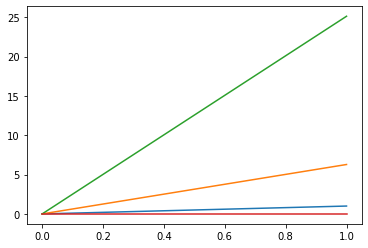

In [ ]:
W = 1
f = 4
x = np.linspace(0,1,100)

plt.plot(x,(x))
plt.plot(x,(2*np.pi*x))
plt.plot(x,(2*np.pi*f*x))
plt.plot(x,(2*np.pi*f*x*1J))
#plt.plot(x,np.exp(2*np.pi*f*x))

In [ ]:
x = 1
y = 1

sum = np.zeros(10000)

for K in range(1,10000):
    y *= x/K
    sum[K] = y

2*np.sum(sum)

3.4365636569180906

## Exponential function

### Opposite

In [ ]:
def exp2(x):
  x = np.array(x)
  accuracy = 100

  y = np.ones(len(x))
  if isinstance(x[0], complex):
    y = np.ones(len(x))*1j
    
  y2 = np.zeros((accuracy,len(x)))

  for K in range(1,accuracy):
      y*= x/K
      for i in range(0,len(x)):
        y2[K,i] = np.sum(y[i],axis=0)

  return y2

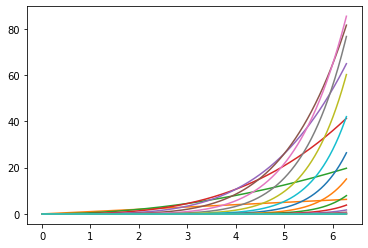

In [ ]:
plt.plot(x,np.transpose(exp2(x)));

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: ComplexWarning: Casting complex values to real discards the imaginary part
  


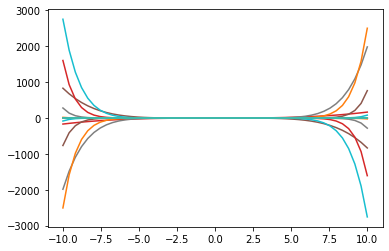

In [ ]:
x = np.linspace(-10,10,50)
plt.plot(x,np.transpose(exp2(1j*x)));

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: ComplexWarning: Casting complex values to real discards the imaginary part
  


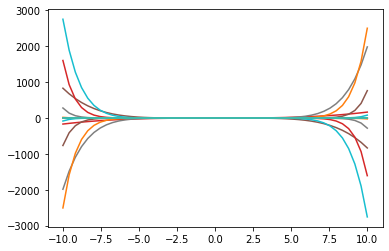

In [ ]:
plt.plot(x,np.transpose(exp2(1j*x)));

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: ComplexWarning: Casting complex values to real discards the imaginary part
  


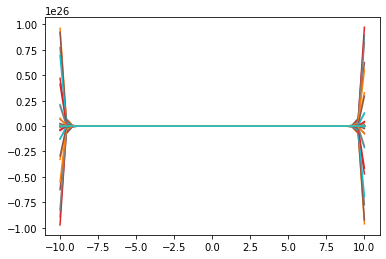

In [ ]:
f = 1

plt.plot(x,np.transpose(exp2(2*np.pi*f*x*1j)));

### Normal

In [ ]:
accuracy = 1000

x = np.array([1])

y = np.ones(len(x))
y2 = np.zeros((accuracy,len(x)))

for K in range(1,accuracy):
    y *= x/K
    for i in range(0,len(x)):
      y2[K,i] = y[i]

np.sum(y2,axis=0)+1

array([2.71828183])

In [ ]:
def exp(x):
  x = np.array(x)
  accuracy = 1000

  y = np.ones(len(x))
  if isinstance(x[0], complex):
    y = -1j*np.ones(len(x))
    
  y2 = np.zeros((accuracy,len(x)))

  for K in range(1,accuracy):
      y *= x/K
      for i in range(0,len(x)):
        y2[K,i] = y[i]

  return np.sum(y2,axis=0)

In [ ]:
def exp(x):
  x = np.array(x)
  accuracy = 1000

  y = np.ones(len(x))
  if isinstance(x[0], complex):
    y = np.ones(len(x))*1j
    
  y2 = np.zeros((accuracy,len(x)))

  for K in range(1,accuracy):
      y *= x/K
      for i in range(0,len(x)):
        y2[K,i] = -y[i]

  return np.sum(y2,axis=0)+1

In [ ]:
def exp(x):
  x = np.array(x)
  accuracy = 1000

  y = np.ones(len(x))
  if isinstance(x[0], complex):
    y = np.ones(len(x))*1j
    
  y2 = np.zeros((accuracy,len(x)))

  for K in range(1,accuracy):
      y *= x/K
      for i in range(0,len(x)):
        y2[K,i] = y[i]

  return np.sum(y2,axis=0)

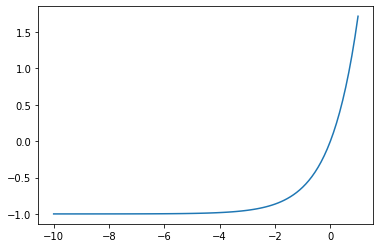

In [ ]:
x = np.linspace(-10,1,100)
plt.plot(x,exp(x))

In [ ]:
exp([1j*np.pi])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: ComplexWarning: Casting complex values to real discards the imaginary part
  


array([-1.7646957e-141])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: ComplexWarning: Casting complex values to real discards the imaginary part
  


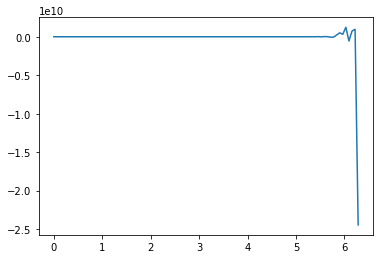

In [247]:
x = np.linspace(0,2*np.pi,100)

f = 10/(2*np.pi)
W = 1

y = W*exp(-2*np.pi*f*x*1j)

plt.plot(x,y)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: ComplexWarning: Casting complex values to real discards the imaginary part
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: ComplexWarning: Casting complex values to real discards the imaginary part
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: ComplexWarning: Casting complex values to real discards the imaginary part
  


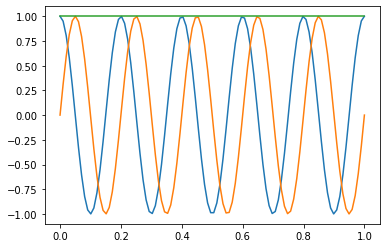

In [ ]:
x = np.linspace(0,1,100)

f = 5
W = 1

y = W*exp(-2*np.pi*f*x*1j-0.5*1j*np.pi)

plt.plot(x,y)

y = W*exp(-2*np.pi*f*x*1j)

plt.plot(x,y)

plt.plot((W*exp(-2*np.pi*f*x*1j)**2+W*exp(-2*np.pi*f*x*1j-0.5*1j*np.pi)**2)[0:round(max(x))+1]);

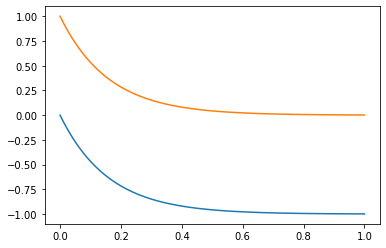

In [ ]:
x = np.linspace(0,1,100)

f = 1
W = 1

y = W*exp(-2*np.pi*f*x)
plt.plot(x,y)

y2 = W*np.exp(-2*np.pi*f*x)
plt.plot(x,y2)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: ComplexWarning: Casting complex values to real discards the imaginary part
  


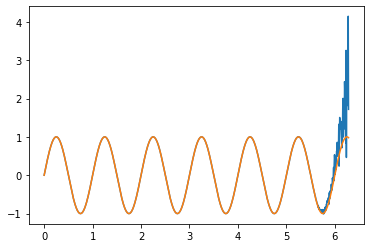

In [ ]:
x = np.linspace(0,2*np.pi,1000)

f = 2*np.pi/(2*np.pi)
W = 1

y = np.transpose(W*exp(-2*np.pi*f*x*1J)-exp([np.pi*1j]))

plt.plot(x,y)

plt.plot(x,np.sin(2*np.pi*x))

### Orbital becoming thermal

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: ComplexWarning: Casting complex values to real discards the imaginary part
  


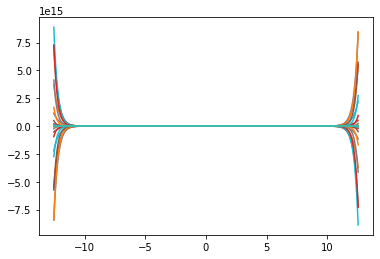

In [ ]:
x = np.linspace(-4*np.pi,4*np.pi,1000)

f = 1*np.pi/(2*np.pi)  # 0.1, 2 or 10*np.pi/(2*np.pi)
W = 1

y = np.transpose(W*exp2(-2*np.pi*f*x*1J)-exp2([np.pi*1j]))

plt.plot(x,y);

#plt.polar(x,np.sin(f*2*np.pi*x))

#### Coil of wire

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: ComplexWarning: Casting complex values to real discards the imaginary part
  


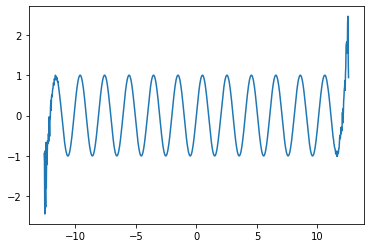

In [ ]:
x = np.linspace(-4*np.pi,4*np.pi,1000)

f = 0.99*np.pi/(2*np.pi)  # 0.1, 2 or 10*np.pi/(2*np.pi)
W = 1

y = np.transpose(W*exp(-2*np.pi*f*x*1J)-exp([np.pi*1j]))

plt.plot(x,y);

#plt.polar(x,np.sin(f*2*np.pi*x))

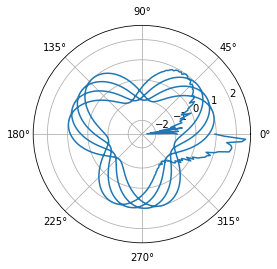

In [ ]:
plt.polar(x,y);

## Waves

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: ComplexWarning: Casting complex values to real discards the imaginary part
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: overflow encountered in multiply
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in multiply
  if sys.path[0] == '':


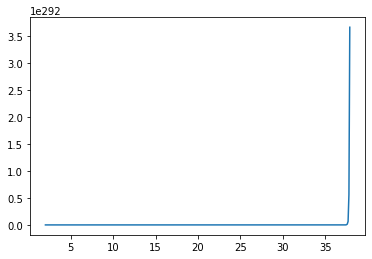

In [ ]:
# W = 2
# f = 2
# x = np.linspace(0,2,10000)+1

# y = W*exp(2*np.pi*f*x*1J-0.5J*np.pi)

# plt.plot(x,y)


W = 3
f = 3
x = np.linspace(0,1000,10000)+2

y = W*exp(2*np.pi*f*x*1J-0.5J*np.pi)

plt.plot(x,y)


# W = 4
# f = 4
# x = np.linspace(0,1,1000)+3

# y = W*exp(2*np.pi*f*x*1J-0.5J*np.pi)

#plt.plot(x,y)

In [ ]:
def primewave(n):

  W = n
  f = n
  x = np.linspace(0,1,1000)+n-1

  y = W*np.exp(2*np.pi*f*x*1J-0.5J*np.pi)

  plt.plot(x,y);

  return y

In [ ]:
def primewave(n):

  W = n
  f = n
  x = np.linspace(0,1,1000)+n-1

  y = W*np.exp(2*np.pi*f*x*1J-0.5J*np.pi)

  plt.polar(x,y);

  return y

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/

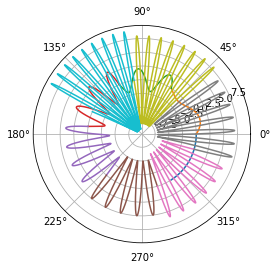

In [ ]:
for i in range(0,10):
  y = primewave(i)

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/

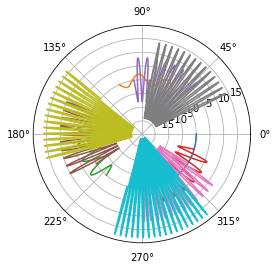

In [ ]:
for i in range(0,20,2):
  y = primewave(i)

## Fibonacci sequence makes it look 3D

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/

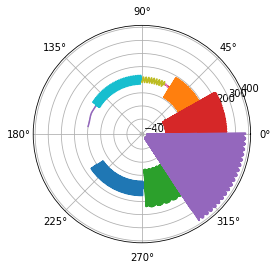

In [ ]:
for i in [0, 1, 1, 2, 3, 5, 8, 13, 21, 34, 55, 89, 144, 233, 377]:
  y = primewave(i)

## Primes

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/

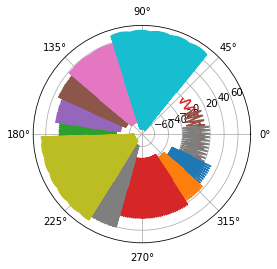

In [ ]:
primes = [2, 3, 5, 7, 11, 13, 17, 19, 23, 29, 31, 37, 41, 43, 47, 53, 59, 61, 67, 71, 73, 79, 83, 89, 97, 101, 103, 107, 109, 113, 127, 131, 137, 139, 149, 151, 157, 163, 167, 173, 179, 181, 191, 193, 197, 199, 211, 223, 227, 229, 233, 239, 241, 251, 257, 263, 269, 271, 277, 281, 283, 293, 307, 311, 313, 317, 331, 337, 347, 349, 353, 359, 367, 373, 379, 383, 389, 397, 401, 409, 419, 421, 431, 433, 439, 443, 449, 457, 461, 463, 467, 479, 487, 491, 499, 503, 509, 521, 523, 541, 547, 557, 563, 569, 571, 577, 587, 593, 599, 601, 607, 613, 617, 619, 631, 641, 643, 647, 653, 659, 661, 673, 677, 683, 691, 701, 709, 719, 727, 733, 739, 743, 751, 757, 761, 769, 773, 787, 797, 809, 811, 821, 823, 827, 829, 839, 853, 857, 859, 863, 877, 881, 883, 887, 907, 911, 919, 929, 937, 941, 947, 953, 967, 971, 977, 983, 991, 997]

for i in primes[0:20]:
  y = primewave(i)

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


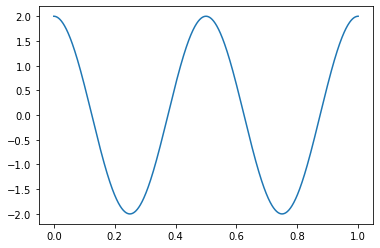

In [ ]:
W = 2
f = 2
x = np.linspace(0,1,1000)

y = W*np.exp(2*np.pi*f*x*1J)

plt.plot(x,y)

# 2D solar system

In [ ]:
def primewave(n):

  W = n
  f = n
  x = np.linspace(0,1,1000)+n-1

  y = W*np.exp(2*np.pi*f*x*1J-0.5J*np.pi)

  plt.plot(x+0.5,y);
  plt.plot(-y,x+0.5);

  plt.plot(x+0.5,y);
  plt.plot(-y,x+0.5);

  return y

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Trying to create polar plot on an axis that does not have a polar projection.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Requested projection is different from current axis projection, creating new axis with requested projection.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instan

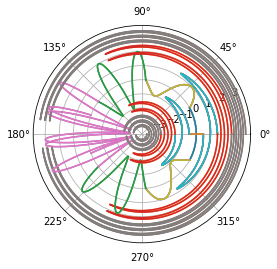

In [ ]:
fib = 0, 1, 1, 2, 3, 5, 8, 13, 21, 34, 55, 89, 144, 233, 377

for i in fib[0:5]:
  y = primewave(i)

for i in fib[0:5]:
  y = primewave(-i)